# **Análisis Exploratorio de Datos (EDA)**

###  **Introducción** 

### Contexto del Proyecto

El **análisis exploratorio de datos (EDA)** es un paso fundamental en cualquier proyecto de ciencia de datos. Su objetivo es **explorar, resumir y visualizar los datos** para descubrir patrones, detectar anomalías, probar hipótesis y verificar suposiciones antes de aplicar modelos predictivos o realizar análisis más profundos.

En este proyecto, trabajaremos con datos del sector de **telecomunicaciones en Argentina**. El objetivo es **entender el comportamiento del sector, especialmente en lo que respecta al acceso a internet,** y proporcionar información valiosa para mejorar la calidad de los servicios y encontrar oportunidades de crecimiento.

### Objetivos del EDA

1.	Comprender el Conjunto de Datos: Obtener una visión clara de la estructura y el contenido de los datos, incluyendo el tipo de datos y las variables disponibles.
2.	Identificar Problemas Potenciales: Detectar valores faltantes, duplicados y atípicos que puedan afectar el análisis.
3.	Explorar Relaciones y Patrones: Analizar la distribución de los datos y las relaciones entre las variables para identificar patrones y tendencias.
4.	Proveer Información Preliminar: Generar insights iniciales que puedan guiar futuros análisis y la toma de decisiones.

### Metodología

El EDA se llevará a cabo utilizando herramientas y técnicas de análisis de datos, principalmente con la biblioteca pandas para la manipulación de datos y matplotlib y seaborn para la visualización. La metodología seguirá estos pasos:

1.	Carga de Datos:

	•	Importar los datos desde un archivo de Excel y revisar la estructura general de las hojas de datos.
	
2.	Análisis de Valores Faltantes:

	•	Identificar y cuantificar los valores faltantes en cada columna.

	•	Visualizar los valores faltantes mediante gráficos de barras.

3.	Detección de Outliers:

	•	Analizar la distribución de las variables numéricas.

	•	Utilizar boxplots para identificar outliers.

4.	Detección de Duplicados:

	•	Identificar registros duplicados y determinar su impacto.

	•	Visualizar la cantidad de duplicados mediante gráficos.

5.	Análisis de Correlación:

	•	Calcular matrices de correlación para entender la relación entre variables.

	•	Visualizar la correlación utilizando mapas de calor.

6.	Visualización de Datos:

	•	Crear gráficos adicionales que ayuden a entender la distribución y relación de las variables clave.
	
7.	Documentación y Conclusiones:

	•	Documentar cada paso del análisis y anotar conclusiones preliminares que se derivan del EDA.

### Procesos a Realizar

•	Exploración Inicial: Revisar las primeras filas de datos, tipos de columnas, y estadísticas descriptivas para familiarizarse con el conjunto de datos.
	
•	Tratamiento de Valores Faltantes: Decidir cómo manejar los valores faltantes (eliminación, imputación, etc.)

### Bibliotecas Utilizadas

1. Pandas
2. Numpy
3. Matplotlib

# Desarrollo

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

In [3]:
# Carga de dataset Original, Excel

df = pd.ExcelFile('/Users/felipeamezquita/Library/Mobile Documents/com~apple~CloudDocs/Documents/HENRY/PROYECTO INDIVIDUAL/EJERCICIO 2/DATA/DATA PRINCIPAL/Internet.xlsx')

In [4]:
# Obtener la lista de hojas en el archivo
hojas = df.sheet_names

# Imprimir la lista de hojas
print(hojas)

['Acc_vel_loc_sinrangos', 'Velocidad_sin_Rangos', 'Accesos_tecnologia_localidad', 'Velocidad % por prov', 'Totales VMD', 'Totales Accesos Por Tecnología', 'Accesos Por Tecnología', 'Penetración-poblacion', 'Penetracion-hogares', 'Penetracion-totales', 'Totales Accesos por velocidad', 'Accesos por velocidad', 'Dial-BAf', 'Totales Dial-BAf', 'Ingresos ']


## **1. Analisis EDA base de datos Internet**

### **1.1 EDA hoja Acc_vel_loc_sinrangos**

**Descripción de la Hoja**

La hoja “Acc_vel_loc_sinrangos” proporciona datos sobre el acceso a internet en Argentina, desglosados por velocidad de conexión y localidad/partido. Las columnas incluidas son:

•	Provincias: Indica la provincia argentina donde se ubica la localidad.

•	Partido/Localidad: Detalla el partido o localidad específica dentro de la provincia.

•	Link Indec: Un enlace o identificador relacionado con el Instituto Nacional de Estadística y Censos (INDEC).

•	Velocidades: Varias columnas que representan diferentes rangos de velocidad de internet, con cada columna indicando la cantidad de usuarios con acceso a esa velocidad específica.

**Objetivos del EDA**

1.	Comprender la Distribución de Datos: Analizar cómo se distribuye el acceso a internet por velocidad en diferentes provincias y localidades.

2.	Identificar Anomalías y Problemas de Calidad de Datos: Detectar valores faltantes, duplicados y outliers que puedan afectar la calidad de los datos.

3.	Visualizar Patrones Geográficos y de Velocidad: Explorar las tendencias en el acceso a internet a través de visualizaciones gráficas.

**Metodología y Procesos**

1. Análisis de Valores Faltantes

•	Objetivo: Identificar columnas con valores faltantes y evaluar su impacto en el análisis.

•	Proceso: Utilizaremos el método isnull() para cuantificar los valores faltantes por columna. Visualizaremos los resultados con un gráfico de barras para identificar las columnas más afectadas.

2. Análisis de Valores Duplicados

•	Objetivo: Determinar si existen registros duplicados que puedan distorsionar el análisis.

•	Proceso: Usaremos duplicated() para detectar registros repetidos. Visualizaremos la cantidad de duplicados, si los hay, con un gráfico de barras.

3. Identificación de Outliers

•	Objetivo: Detectar valores atípicos en las columnas de velocidad que podrían indicar errores o casos especiales.

•	Proceso: Crearemos boxplots para las columnas de velocidad, lo que nos permitirá identificar outliers en la distribución de usuarios por velocidad.

4. Análisis de Distribución de Velocidades

•	Objetivo: Entender cómo se distribuyen los usuarios según las diferentes velocidades de internet en cada provincia y localidad.

•	Proceso: Usaremos histogramas y gráficos de barras para visualizar la cantidad de usuarios por velocidad, desglosada por provincia y localidad. Esto ayudará a identificar tendencias y patrones regionales.

5. Análisis Geográfico

•	Objetivo: Explorar el acceso a internet a nivel geográfico, destacando las diferencias entre provincias.

•	Proceso: Crearemos mapas de calor o gráficos geoespaciales (si es factible) para visualizar las diferencias en el acceso a internet por velocidad entre las provincias.

**Conclusiones Esperadas**

Al final de este EDA, esperamos tener una comprensión clara de cómo varía el acceso a internet en Argentina según la velocidad y la región. Identificaremos cualquier problema de calidad de datos que deba abordarse y obtendremos insights iniciales que podrán guiar futuras decisiones estratégicas y análisis más profundos.


In [5]:

# Leer la hoja "Acc_vel_loc_sinrangos"
h1 = df.parse('Acc_vel_loc_sinrangos')

#Ver h1
h1

,Provincia,Partido,Localidad,Link Indec,Otros,"0,256 Mbps","0,5 Mbps","0,512 Mbps","0,75 Mbps",1 Mbps,...,680 Mbps,700 Mbps,800 Mbps,850 Mbps,900 Mbps,999 Mbps,1000 Mbps,1024 Mbps,4000 Mbps,10000 Mbps
0,BUENOS AIRES,25 de Mayo,25 de Mayo,6854100,NaN,NaN,2.0,NaN,19.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,BUENOS AIRES,25 de Mayo,Agustín Mosconi,6854010,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,BUENOS AIRES,25 de Mayo,Del Valle,6854020,NaN,NaN,1.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,BUENOS AIRES,25 de Mayo,Ernestina,6854030,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,BUENOS AIRES,25 de Mayo,Gobernador Ugarte,6854040,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3060,TUCUMAN,Tafí Viejo,Villa Mariano Moreno - El Colmenar,90105100,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,5.0,NaN,NaN,NaN
3061,TUCUMAN,Trancas,San Pedro de Colalao,90112020,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3062,TUCUMAN,Trancas,Villa de Trancas,90112030,NaN,NaN,NaN,NaN,NaN,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3063,TUCUMAN,Yerba Buena,Villa Carmela,90119020,8.0,NaN,NaN,NaN,NaN,3.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
# Obtener la forma de la hoja (número de filas y columnas)
print(h1.shape)

# Obtener los nombres de las columnas
print(h1.columns)

# Obtener los tipos de datos de cada columna
print(h1.dtypes)

(3065, 125)
Index(['Provincia', 'Partido', 'Localidad', 'Link Indec', 'Otros',
       '0,256 Mbps', '0,5 Mbps', '0,512 Mbps', '0,75 Mbps', '1 Mbps',
       ...
       '680 Mbps', '700 Mbps', '800 Mbps', '850 Mbps', '900 Mbps', '999 Mbps',
       '1000 Mbps', '1024 Mbps', '4000 Mbps', '10000 Mbps'],
      dtype='object', length=125)
Provincia      object
Partido        object
Localidad      object
Link Indec     object
Otros         float64
               ...   
999 Mbps      float64
1000 Mbps     float64
1024 Mbps     float64
4000 Mbps     float64
10000 Mbps    float64
Length: 125, dtype: object


**Contar valolres nulos por columnas**

Valores nulos por columna:
Provincia        0
Partido          0
Localidad        0
Link Indec       0
Otros         2035
              ... 
999 Mbps      3048
1000 Mbps     2645
1024 Mbps     3063
4000 Mbps     3064
10000 Mbps    3063
Length: 125, dtype: int64


/var/folders/56/ng1477v167b0_8l7x8rdnw_r0000gn/T/ipykernel_87221/4092113872.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=valores_nulos.index, y=valores_nulos.values, palette='viridis')


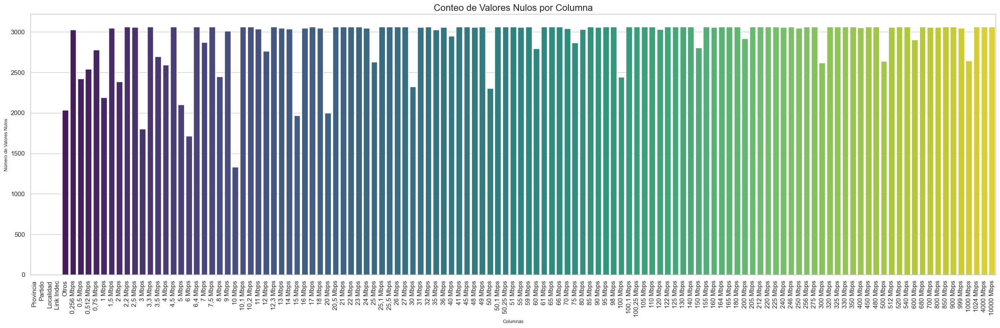

In [7]:

# Contar valores nulos en todas las columnas
valores_nulos = h1.isnull().sum()

# Mostrar el resultado
print("Valores nulos por columna:")
print(valores_nulos)

# Configurar el estilo de los gráficos
sns.set(style="whitegrid")

# Crear el gráfico de barras para visualizar los valores nulos
plt.figure(figsize=(24, 8))
sns.barplot(x=valores_nulos.index, y=valores_nulos.values, palette='viridis')

# Añadir títulos y etiquetas
plt.title('Conteo de Valores Nulos por Columna', fontsize=16)
plt.xlabel('Columnas', fontsize=8)
plt.ylabel('Número de Valores Nulos', fontsize=8)
plt.xticks(rotation=90)
plt.tight_layout()

# Mostrar el gráfico
plt.show()

**Conclusion**

Fue interesante esta grafica por que mientras menos nulos hubiran significaria que más locialidades, provincias, o partidos usaban esa velocidad de internet, vemos como el internet de 10 mpbs tiene menos nulos que los demas, aunque los nulos eran de esperarse, nos da una primera idea de como se comportaban los datos a analizar. 

In [8]:
# Vista en lista de los nombres de las columnas completa
for col in h1.columns.tolist():
    print(col)

Provincia
Partido
Localidad
Link Indec
Otros
0,256 Mbps
0,5 Mbps
0,512 Mbps
0,75 Mbps
1 Mbps
1,5 Mbps
2 Mbps
2,2 Mbps
2,5 Mbps
3 Mbps
3,3 Mbps
3,5 Mbps
4 Mbps
4,5 Mbps
5 Mbps
6 Mbps
6,4 Mbps
7 Mbps
7,5 Mbps
8 Mbps
9 Mbps
10 Mbps
10,1 Mbps
10,2 Mbps
11 Mbps
12 Mbps
12,3 Mbps
13 Mbps
14 Mbps
15 Mbps
16 Mbps
17 Mbps
18 Mbps
20 Mbps
20,5 Mbps
21 Mbps
22 Mbps
23 Mbps
24 Mbps
25 Mbps
25,1 Mbps
25,5 Mbps
26 Mbps
27 Mbps
30 Mbps
31 Mbps
32 Mbps
35 Mbps
36 Mbps
40 Mbps
41 Mbps
45 Mbps
48 Mbps
49 Mbps
50 Mbps
50,1 Mbps
50,25 Mbps
51 Mbps
55 Mbps
59 Mbps
60 Mbps
61 Mbps
65 Mbps
66 Mbps
70 Mbps
75 Mbps
80 Mbps
85 Mbps
90 Mbps
95 Mbps
98 Mbps
100 Mbps
100,1 Mbps
100,25 Mbps
105 Mbps
110 Mbps
120 Mbps
122 Mbps
125 Mbps
130 Mbps
140 Mbps
150 Mbps
155 Mbps
160 Mbps
164 Mbps
165 Mbps
180 Mbps
200 Mbps
205 Mbps
212 Mbps
220 Mbps
225 Mbps
240 Mbps
246 Mbps
250 Mbps
256 Mbps
275 Mbps
300 Mbps
320 Mbps
325 Mbps
330 Mbps
350 Mbps
400 Mbps
450 Mbps
480 Mbps
500 Mbps
512 Mbps
520 Mbps
540 Mbps
600 Mbps
680 Mb

Analisis de cantidad de usuarios por Localidad

In [9]:

# Seleccionar las columnas relevantes para las velocidades
columnas_velocidades = [
    '0,256 Mbps', '0,5 Mbps', '0,512 Mbps', '0,75 Mbps', '1 Mbps', '1,5 Mbps', '2 Mbps', '2,2 Mbps',
    '2,5 Mbps', '3 Mbps', '3,3 Mbps', '3,5 Mbps', '4 Mbps', '4,5 Mbps', '5 Mbps', '6 Mbps', '6,4 Mbps',
    '7 Mbps', '7,5 Mbps', '8 Mbps', '9 Mbps', '10 Mbps', '10,1 Mbps', '10,2 Mbps', '11 Mbps', '12 Mbps',
    '12,3 Mbps', '13 Mbps', '14 Mbps', '15 Mbps', '16 Mbps', '17 Mbps', '18 Mbps', '20 Mbps', '20,5 Mbps',
    '21 Mbps', '22 Mbps', '23 Mbps', '24 Mbps', '25 Mbps', '25,1 Mbps', '25,5 Mbps', '26 Mbps', '27 Mbps',
    '30 Mbps', '31 Mbps', '32 Mbps', '35 Mbps', '36 Mbps', '40 Mbps', '41 Mbps', '45 Mbps', '48 Mbps',
    '49 Mbps', '50 Mbps', '50,1 Mbps', '50,25 Mbps', '51 Mbps', '55 Mbps', '59 Mbps', '60 Mbps', '61 Mbps',
    '65 Mbps', '66 Mbps', '70 Mbps', '75 Mbps', '80 Mbps', '85 Mbps', '90 Mbps', '95 Mbps', '98 Mbps',
    '100 Mbps', '100,1 Mbps', '100,25 Mbps', '105 Mbps', '110 Mbps', '120 Mbps', '122 Mbps', '125 Mbps',
    '130 Mbps', '140 Mbps', '150 Mbps', '155 Mbps', '160 Mbps', '164 Mbps', '165 Mbps', '180 Mbps',
    '200 Mbps', '205 Mbps', '212 Mbps', '220 Mbps', '225 Mbps', '240 Mbps', '246 Mbps', '250 Mbps',
    '256 Mbps', '275 Mbps', '300 Mbps', '320 Mbps', '325 Mbps', '330 Mbps', '350 Mbps', '400 Mbps',
    '450 Mbps', '480 Mbps', '500 Mbps', '512 Mbps', '520 Mbps', '540 Mbps', '600 Mbps', '680 Mbps',
    '700 Mbps', '800 Mbps', '850 Mbps', '900 Mbps', '999 Mbps', '1000 Mbps', '1024 Mbps', '4000 Mbps',
    '10000 Mbps'
]

# Sumar la cantidad total de usuarios en todas las velocidades para cada fila
h1['Total Usuarios'] = h1[columnas_velocidades].sum(axis=1)

# Convertir a entero
h1['Total Usuarios'] = h1['Total Usuarios'].astype(int)

# Agrupar por localidad y sumar el total de usuarios en cada localidad
usuarios_por_localidad = h1.groupby('Localidad')['Total Usuarios'].sum().reset_index()

# Ordenar los datos por número de usuarios (opcional, pero puede ayudar a ver las localidades con más usuarios)
usuarios_por_localidad = usuarios_por_localidad.sort_values('Total Usuarios', ascending=False)

# Mostrar un resumen de los datos procesados
print(usuarios_por_localidad)

                            Localidad  Total Usuarios
531   Ciudad Autónoma de Buenos Aires         1504711
706                           Córdoba          522767
2070                          Rosario          363547
1608                    Mar del Plata          275510
1319                         La Plata          197609
...                               ...             ...
255                Barrio Perdriel IV               0
1384                        Larrechea               0
844                          El Salto               0
450                         Ceibalito               0
1186                        Jaramillo               0

[2778 rows x 2 columns]


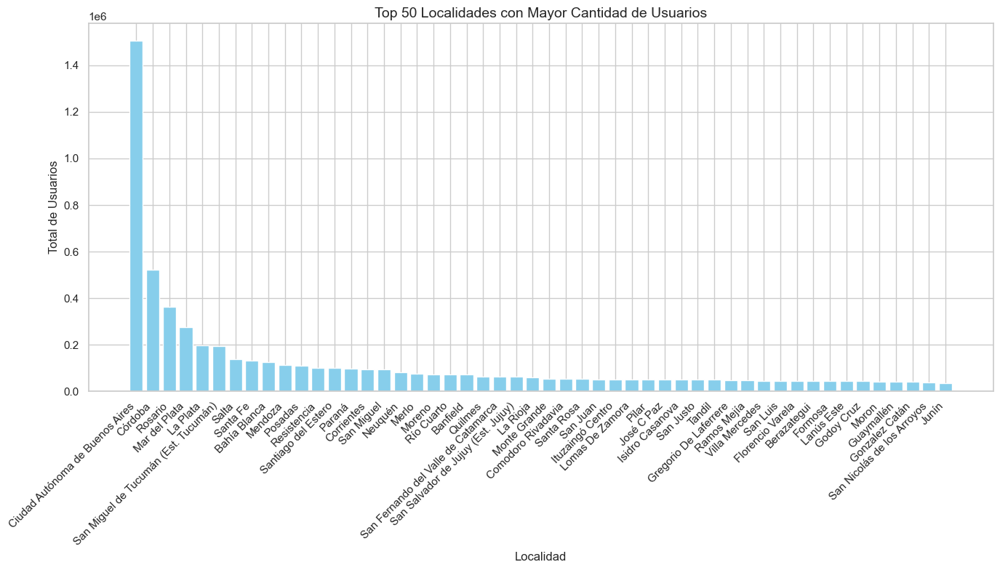

In [10]:


# Ordenar el DataFrame por 'Total Usuarios' en orden descendente y seleccionar las 50 primeras localidades
top_50_localidades = usuarios_por_localidad.sort_values(by='Total Usuarios', ascending=False).head(50)

# Crear el gráfico de barras
plt.figure(figsize=(14, 8))
plt.bar(top_50_localidades['Localidad'], top_50_localidades['Total Usuarios'], color='skyblue')

# Rotar las etiquetas del eje x para mejor legibilidad
plt.xticks(rotation=45, ha='right')

# Agregar título y etiquetas
plt.title('Top 50 Localidades con Mayor Cantidad de Usuarios', fontsize=14)
plt.xlabel('Localidad', fontsize=12)
plt.ylabel('Total de Usuarios', fontsize=12)

# Mostrar el gráfico
plt.tight_layout()  # Ajusta los márgenes para que las etiquetas no se corten
plt.show()

**Conclusion:**
Los resultados del analisis nos muestran como la localidad de ciudad autonoma de Buenos Aires tiene más de 1.5 millones de usuarios, seguida por cordoba con menos de 600.000 usuarios, mostrandonos un outlier y donde mas usuarios hay en el pais.

In [11]:



# Sumar la cantidad total de usuarios en todas las velocidades para cada fila
h1['Total Usuarios'] = h1[columnas_velocidades].sum(axis=1)

# Convertir a entero
h1['Total Usuarios'] = h1['Total Usuarios'].astype(int)

# Agrupar por Provincia y sumar el total de usuarios en cada Provincia
usuarios_por_Provincia = h1.groupby('Provincia')['Total Usuarios'].sum().reset_index()

# Ordenar los datos por número de usuarios (opcional, pero puede ayudar a ver las localidades con más usuarios)
usuarios_por_Provincia = usuarios_por_Provincia.sort_values('Total Usuarios', ascending=False)

# Mostrar un resumen de los datos procesados
print(usuarios_por_Provincia)

              Provincia  Total Usuarios
0          BUENOS AIRES         4919410
1                  CABA         1504711
5               CORDOBA         1067489
20             SANTA FE          902420
12              MENDOZA          297031
7            ENTRE RIOS          282577
23              TUCUMAN          264107
16                SALTA          196215
13             MISIONES          194030
15            RIO NEGRO          155443
4                CHUBUT          154036
3                 CHACO          151727
6            CORRIENTES          151652
18             SAN LUIS          150122
14              NEUQUEN          144078
21  SANTIAGO DEL ESTERO          123445
10             LA PAMPA          120596
9                 JUJUY          116083
11             LA RIOJA           87782
17             SAN JUAN           83911
2             CATAMARCA           74863
8               FORMOSA           62416
22     TIERRA DEL FUEGO           54434
19           SANTA CRUZ           46405


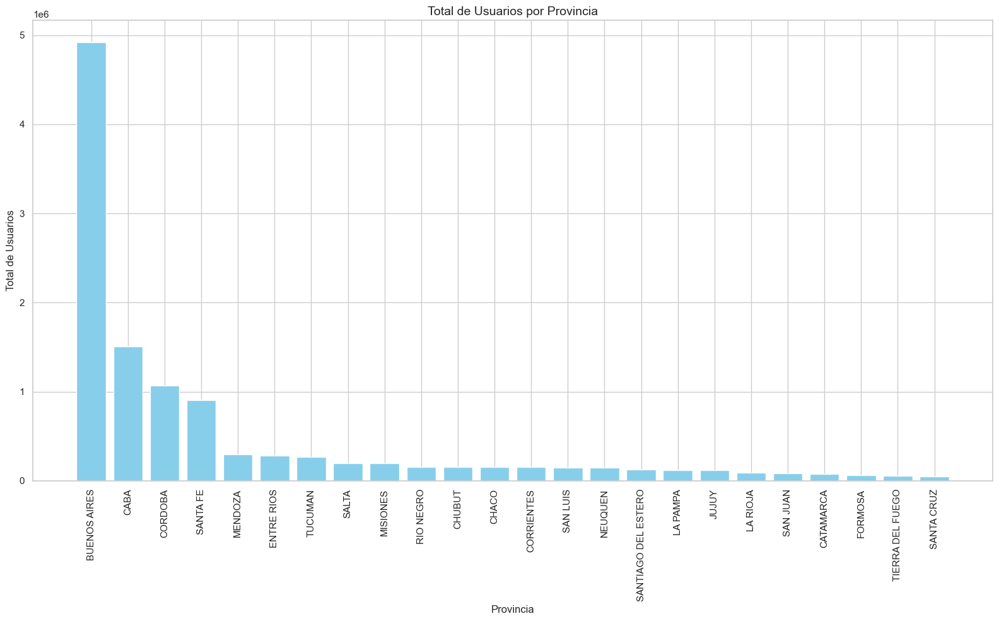

In [12]:

# Crear el gráfico de barras para todas las provincias
plt.figure(figsize=(16, 10))
plt.bar(usuarios_por_Provincia['Provincia'], usuarios_por_Provincia['Total Usuarios'], color='skyblue')

# Rotar las etiquetas del eje x para mejor legibilidad
plt.xticks(rotation=90, ha='center')

# Agregar título y etiquetas
plt.title('Total de Usuarios por Provincia', fontsize=14)
plt.xlabel('Provincia', fontsize=12)
plt.ylabel('Total de Usuarios', fontsize=12)

# Mostrar el gráfico
plt.tight_layout()  # Ajusta los márgenes para que las etiquetas no se corten
plt.show()

**Conclusiones:**

Vemos como la provincia de buenos aires es la que más usuarios tiene, seguida por caba, este analisis nos ayuda a pensar como en nueustro fututo analisis de datos veremos y haremos la muestra de la información.

In [13]:



# Sumar la cantidad total de usuarios en todas las velocidades para cada fila 
h1['Total Usuarios'] = h1[columnas_velocidades].sum(axis=1)

# Convertir a entero
h1['Total Usuarios'] = h1['Total Usuarios'].astype(int)

# Agrupar por Partido y sumar el total de usuarios en cada Partido
usuarios_por_Partido = h1.groupby('Partido')['Total Usuarios'].sum().reset_index()

# Ordenar los datos por número de usuarios (opcional, pero puede ayudar a ver las Partido con más usuarios)
usuarios_por_Partido = usuarios_por_Partido.sort_values('Total Usuarios', ascending=False)

# Mostrar un resumen de los datos procesados
print(usuarios_por_Partido)

                             Partido  Total Usuarios
57                           Capital         1509705
84   Ciudad Autónoma de Buenos Aires         1504711
324                          Rosario          405497
207                       La Matanza          389769
160               General Pueyrredón          287202
..                               ...             ...
20          Antofagasta de la Sierra               1
42                  Berón de Astrada               1
359              San Luis del Palmar               1
16                           Ancasti               1
228                     Lihuel Calel               0

[432 rows x 2 columns]


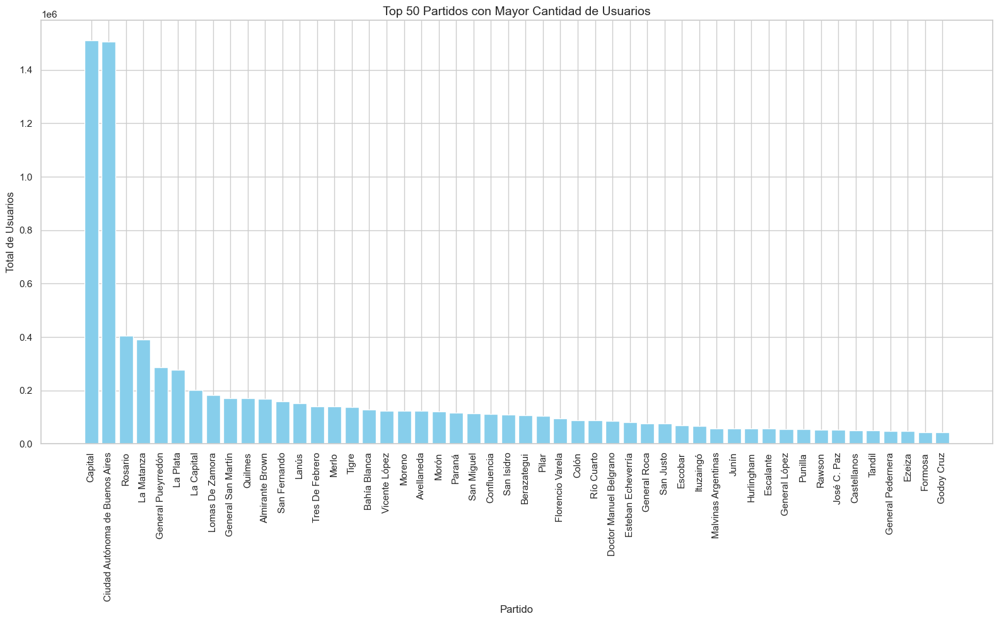

In [14]:
# Seleccionar los 50 partidos con mayor cantidad de usuarios
top_50_partidos = usuarios_por_Partido.head(50)

# Crear el gráfico de barras para los 50 partidos principales
plt.figure(figsize=(16, 10))
plt.bar(top_50_partidos['Partido'], top_50_partidos['Total Usuarios'], color='skyblue')

# Rotar las etiquetas del eje x para mejor legibilidad
plt.xticks(rotation=90, ha='center')

# Agregar título y etiquetas
plt.title('Top 50 Partidos con Mayor Cantidad de Usuarios', fontsize=14)
plt.xlabel('Partido', fontsize=12)
plt.ylabel('Total de Usuarios', fontsize=12)

# Mostrar el gráfico
plt.tight_layout()  # Ajusta los márgenes para que las etiquetas no se corten
plt.show()

**Conclusiones:**

Vemos como el partido de la capital y de la ciudad de buenos aires son los principales partidos con mayor cantidad de usuarios.

In [15]:
# Crear un diccionario para almacenar los resultados
usuarios_por_velocidad = {}

# Iterar sobre las columnas de velocidad y calcular la suma total de usuarios para cada una
for columna in columnas_velocidades:
    total_usuarios = int(h1[columna].sum())
    usuarios_por_velocidad[columna] = total_usuarios

# Convertir el diccionario a un DataFrame para facilitar la visualización
usuarios_por_velocidad_df = pd.DataFrame(list(usuarios_por_velocidad.items()), columns=['Velocidad', 'Total Usuarios'])

# Ordenar el DataFrame por el número total de usuarios
usuarios_por_velocidad_df = usuarios_por_velocidad_df.sort_values('Total Usuarios', ascending=False)

# Mostrar los resultados
print(usuarios_por_velocidad_df)

   Velocidad  Total Usuarios
97  300 Mbps         2250925
71  100 Mbps         2231071
54   50 Mbps         1600168
44   30 Mbps         1001084
21   10 Mbps          736235
..       ...             ...
43   27 Mbps               1
42   26 Mbps               1
36   22 Mbps               1
90  220 Mbps               1
89  212 Mbps               1

[120 rows x 2 columns]


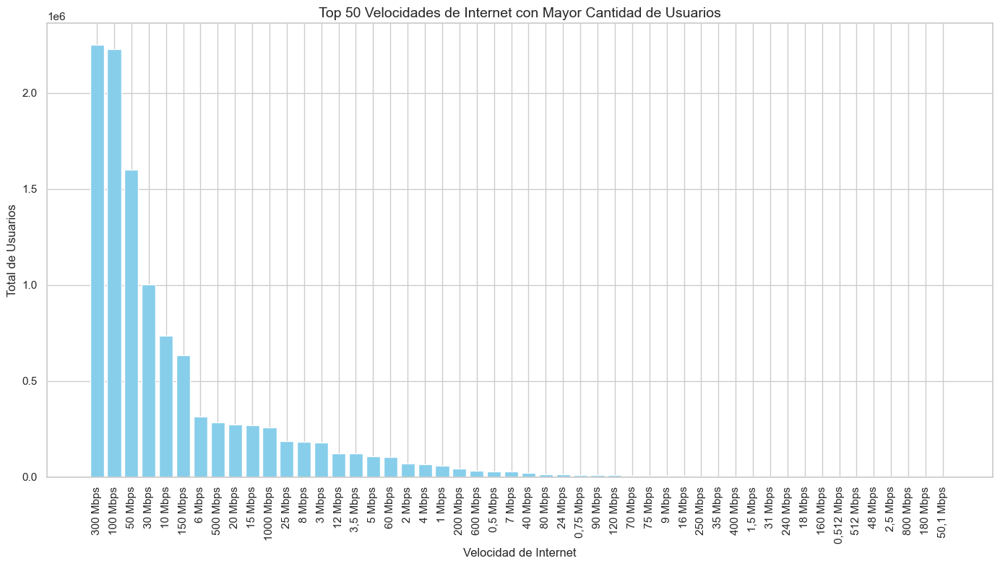

In [16]:

# Ordenar los datos por 'Total Usuarios' en orden descendente y seleccionar las 50 primeras velocidades
top_50_velocidades = usuarios_por_velocidad_df.sort_values(by='Total Usuarios', ascending=False).head(50)

# Crear el gráfico de barras
plt.figure(figsize=(14, 8))
plt.bar(top_50_velocidades['Velocidad'], top_50_velocidades['Total Usuarios'], color='skyblue')

# Rotar las etiquetas del eje x para mejor legibilidad
plt.xticks(rotation=90, ha='center')

# Agregar título y etiquetas
plt.title('Top 50 Velocidades de Internet con Mayor Cantidad de Usuarios', fontsize=14)
plt.xlabel('Velocidad de Internet', fontsize=12)
plt.ylabel('Total de Usuarios', fontsize=12)

# Ajustar el diseño para que las etiquetas no se corten
plt.tight_layout()

# Mostrar el gráfico
plt.show()

**Conclusiones:**

Este grafico me parecio muy interesante y curioso, me dice como mas de 9 millones de usuarios estan usando internet entre velocidades de 300 mbps y 150 mbps. 

**Matriz de correalciones**

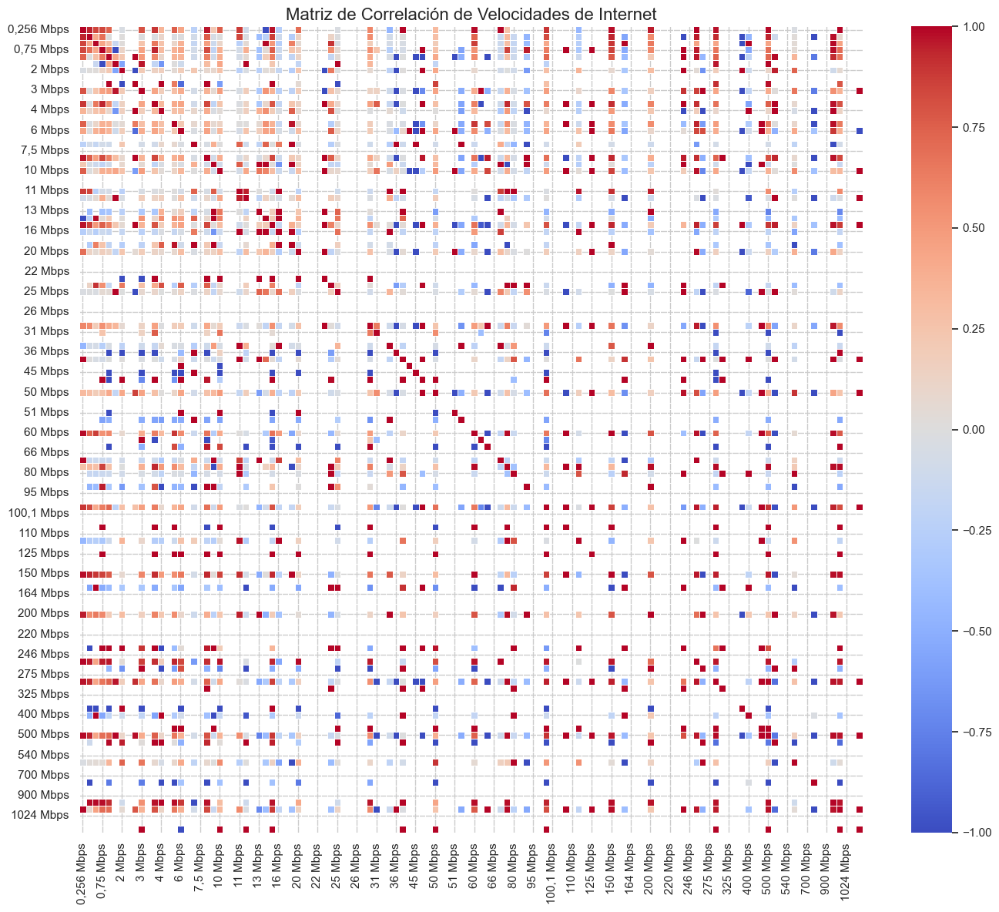

In [17]:

# Seleccionar solo las columnas de velocidad
columnas_velocidades = [
    '0,256 Mbps', '0,5 Mbps', '0,512 Mbps', '0,75 Mbps', '1 Mbps', '1,5 Mbps', '2 Mbps', '2,2 Mbps',
    '2,5 Mbps', '3 Mbps', '3,3 Mbps', '3,5 Mbps', '4 Mbps', '4,5 Mbps', '5 Mbps', '6 Mbps', '6,4 Mbps',
    '7 Mbps', '7,5 Mbps', '8 Mbps', '9 Mbps', '10 Mbps', '10,1 Mbps', '10,2 Mbps', '11 Mbps', '12 Mbps',
    '12,3 Mbps', '13 Mbps', '14 Mbps', '15 Mbps', '16 Mbps', '17 Mbps', '18 Mbps', '20 Mbps', '20,5 Mbps',
    '21 Mbps', '22 Mbps', '23 Mbps', '24 Mbps', '25 Mbps', '25,1 Mbps', '25,5 Mbps', '26 Mbps', '27 Mbps',
    '30 Mbps', '31 Mbps', '32 Mbps', '35 Mbps', '36 Mbps', '40 Mbps', '41 Mbps', '45 Mbps', '48 Mbps',
    '49 Mbps', '50 Mbps', '50,1 Mbps', '50,25 Mbps', '51 Mbps', '55 Mbps', '59 Mbps', '60 Mbps', '61 Mbps',
    '65 Mbps', '66 Mbps', '70 Mbps', '75 Mbps', '80 Mbps', '85 Mbps', '90 Mbps', '95 Mbps', '98 Mbps',
    '100 Mbps', '100,1 Mbps', '100,25 Mbps', '105 Mbps', '110 Mbps', '120 Mbps', '122 Mbps', '125 Mbps',
    '130 Mbps', '140 Mbps', '150 Mbps', '155 Mbps', '160 Mbps', '164 Mbps', '165 Mbps', '180 Mbps',
    '200 Mbps', '205 Mbps', '212 Mbps', '220 Mbps', '225 Mbps', '240 Mbps', '246 Mbps', '250 Mbps',
    '256 Mbps', '275 Mbps', '300 Mbps', '320 Mbps', '325 Mbps', '330 Mbps', '350 Mbps', '400 Mbps',
    '450 Mbps', '480 Mbps', '500 Mbps', '512 Mbps', '520 Mbps', '540 Mbps', '600 Mbps', '680 Mbps',
    '700 Mbps', '800 Mbps', '850 Mbps', '900 Mbps', '999 Mbps', '1000 Mbps', '1024 Mbps', '4000 Mbps',
    '10000 Mbps'
]

# Calcular la matriz de correlación
correlation_matrix = h1[columnas_velocidades].corr()

# Crear el mapa de calor
plt.figure(figsize=(14, 12))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', fmt='.2f', linewidths=0.5)

# Agregar título
plt.title('Matriz de Correlación de Velocidades de Internet', fontsize=16)

# Mostrar el gráfico
plt.tight_layout()
plt.show()

**Mapas de calor**

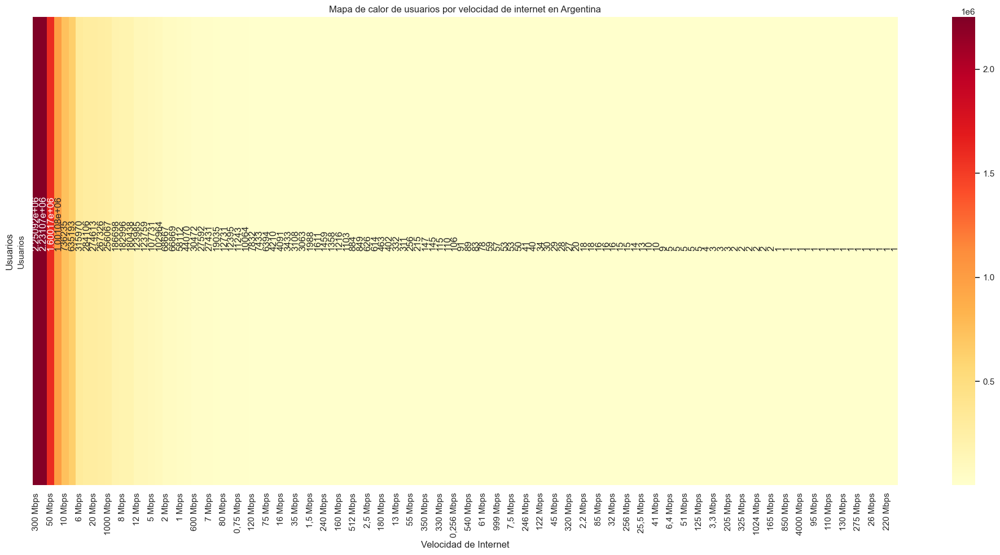

In [18]:


# Seleccionar solo las columnas de velocidad
columnas_velocidad = [col for col in h1.columns if 'Mbps' in col]

# Sumar los usuarios por velocidad
suma_usuarios = h1[columnas_velocidad].sum().sort_values(ascending=False)

# Crear un DataFrame con las sumas para facilitar la visualización
df_suma = pd.DataFrame({'Velocidad': suma_usuarios.index, 'Usuarios': suma_usuarios.values})

# Crear el mapa de calor
plt.figure(figsize=(20, 10))
sns.heatmap(df_suma.set_index('Velocidad').T, cmap='YlOrRd', annot=True, fmt='g', 
            annot_kws={'rotation': 90, 'va': 'bottom'})

plt.title('Mapa de calor de usuarios por velocidad de internet en Argentina')
plt.xlabel('Velocidad de Internet')
plt.ylabel('Usuarios')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

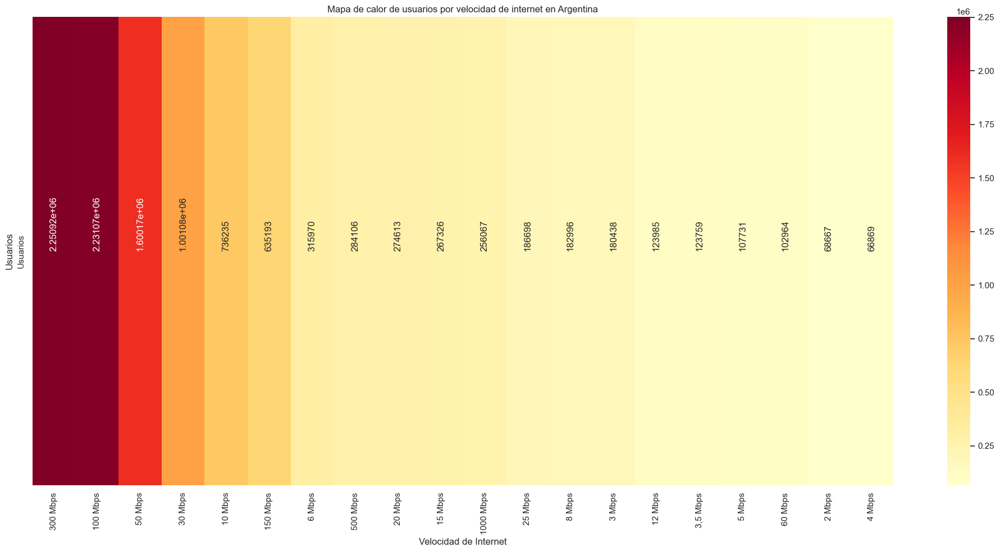

In [19]:


# Seleccionar solo las columnas de velocidad
columnas_velocidad = [col for col in h1.columns if 'Mbps' in col]

# Sumar los usuarios por velocidad
suma_usuarios = h1[columnas_velocidad].sum().sort_values(ascending=False)

# Crear un DataFrame con las sumas para facilitar la visualización
df_suma_top20 = df_suma.nlargest(20, 'Usuarios')

# Crear el mapa de calor
plt.figure(figsize=(20, 10))
sns.heatmap(df_suma_top20.set_index('Velocidad').T, cmap='YlOrRd', annot=True, fmt='g',
            annot_kws={'rotation': 90, 'va': 'bottom'})


plt.title('Mapa de calor de usuarios por velocidad de internet en Argentina')
plt.xlabel('Velocidad de Internet')
plt.ylabel('Usuarios')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

Estos mapas de calor nos muestran de una manera grafica la cantidad de usuarios que hay en 300 y 100 mbps. 

**Conclusiones del EDA**

1.	Valores Nulos:

•	Se identificaron valores nulos en varias columnas del dataset, destacando que la columna ‘Otros’ presenta 2035 valores nulos. Otras columnas con valores nulos incluyen ‘1000 Mbps’, ‘1024 Mbps’, ‘4000 Mbps’, y ‘10000 Mbps’, con 2645, 3063, 3064, y 3063 valores nulos respectivamente. Es importante considerar la imputación o la exclusión de estos valores nulos en futuros análisis para garantizar la precisión de los resultados.

2.	Usuarios por Localidad:

•	Las localidades con la mayor cantidad de usuarios son:

	•	Ciudad Autónoma de Buenos Aires: 1,504,711 usuarios

	•	Córdoba: 522,767 usuarios

	•	Rosario: 363,547 usuarios

	•	Mar del Plata: 275,510 usuarios

	•	La Plata: 197,609 usuarios

Existen muchas localidades con cero usuarios, lo cual podría indicar la necesidad de revisar la cobertura o la calidad de los datos para esas localidades.

3.	Usuarios por Provincia:

•	Las provincias con el mayor número de usuarios son:

	•	Buenos Aires: 4,919,410 usuarios

	•	CABA (Ciudad Autónoma de Buenos Aires): 1,504,711 usuarios

	•	Córdoba: 1,067,489 usuarios

	•	Santa Fe: 902,420 usuarios

	•	Mendoza: 297,031 usuarios

Este análisis revela que Buenos Aires y CABA tienen la mayor concentración de usuarios, lo cual es consistente con su alta densidad de población.

4.	Usuarios por Partido:

•	Los partidos con la mayor cantidad de usuarios incluyen:

	•	Capital: 1,509,705 usuarios

	•	Ciudad Autónoma de Buenos Aires: 1,504,711 usuarios

	•	Rosario: 405,497 usuarios

	•	La Matanza: 389,769 usuarios
	
	•	General Pueyrredón: 287,202 usuarios

	•	Al igual que en el análisis por provincias, la alta concentración de usuarios en Capital y Ciudad Autónoma de Buenos Aires es notable.

5.	Distribución de Usuarios por Velocidad de Internet:

Se realizó un análisis detallado de la cantidad total de usuarios por cada categoría de velocidad de internet. Las velocidades más comunes en el dataset son las más bajas, con una disminución en la cantidad de usuarios a medida que aumenta la velocidad. Esto indica que una gran parte de los usuarios aún utiliza velocidades de internet más lentas.

6.	Mapa de Calor de Usuarios por Velocidad de Internet:

El mapa de calor muestra cómo se distribuyen los usuarios según la velocidad de internet. Este análisis visual puede ayudar a identificar patrones y concentraciones de usuarios en diferentes categorías de velocidad.


### **1.2 EDA Velocidad_sin_Rangos**

**Descripción de la Hoja**

La hoja Velocidad_sin_Rangos contiene estadísticas de acceso a internet desglosadas por velocidad de conexión y provincia. Las columnas incluyen:

•	Año: El año en que se registraron los datos.

•	Trimestre: El trimestre del año en que se registraron los datos.

•	Provincia: La ubicación geográfica a nivel provincial.

•	Otros: Estadísticas de usuarios con velocidades no especificadas en las columnas de velocidad.

•	Columnas de Velocidades: Diversas velocidades de internet en Mbps, desde 0,256 Mbps hasta 10000 Mbps.


**Objetivos del EDA**

1.	Explorar la Distribución de Usuarios por Velocidad: Determinar cómo se distribuyen los usuarios en diferentes velocidades de internet.

2.	Análisis Temporal: Investigar cómo han cambiado las estadísticas de acceso a internet a lo largo del tiempo (por año y trimestre).

3.	Análisis Geográfico: Examinar la distribución de usuarios por provincia y cómo varía según las diferentes velocidades de internet.

4.	Identificación de Tendencias y Patrones: Detectar tendencias y patrones en el acceso a internet y su evolución a lo largo del tiempo y por ubicación.

**Metodología y Procesos**

1.	Cargar y Preparar los Datos:

    •	Cargar la hoja Velocidad_sin_Rangos en un DataFrame.

    •	Revisar y limpiar los datos: manejar valores nulos y tipos de datos incorrectos.

2.	Análisis Exploratorio de Datos (EDA):

    •	Resumen Estadístico: Obtener estadísticas descriptivas de las columnas de velocidad y otros.

    •	Distribución de Velocidades: Analizar la cantidad total de usuarios para cada velocidad de internet.

    •	Análisis Temporal: Agrupar los datos por año y trimestre para ver cómo cambian las estadísticas de velocidad a lo largo del tiempo.

    •	Análisis Geográfico: Agrupar los datos por provincia y sumar las estadísticas de usuarios para cada velocidad de internet.

    •	Visualización de Datos: Crear gráficos de barras, líneas y mapas de calor para representar la distribución de usuarios por velocidad, provincia y tiempo.

3.	Detección de Valores Atípicos:

    •	Identificar y analizar valores atípicos en la distribución de usuarios por velocidad.

4.	Análisis de Correlación:

    •	Crear una matriz de correlación para entender las relaciones entre diferentes velocidades de internet.

5.	Preparación para Análisis Adicional:

    •	Preparar los datos para posibles análisis adicionales, como la agregación de datos por trimestre y año o por localidad.

**Conclusiones Esperadas**

•	Distribución de Usuarios: Identificación de las velocidades de internet más y menos populares en términos de número de usuarios.

•	Tendencias Temporales: Comprensión de cómo ha evolucionado el acceso a internet a lo largo del tiempo y si hay patrones estacionales.

•	Variaciones Geográficas: Identificación de provincias con alta y baja adopción de diferentes velocidades de internet.

•	Valores Atípicos: Detección de anomalías en los datos que podrían indicar problemas de calidad en los datos o cambios inesperados en el acceso a internet.

•	Correlaciones: Identificación de relaciones entre diferentes velocidades de internet y su impacto en el número total de usuarios.


In [20]:
# Leer la hoja "Velocidad_sin_Rangos"
h2 = df.parse('Velocidad_sin_Rangos')

#Ver h2
h2

,Año,Trimestre,Provincia,Otros,"0,256 Mbps","0,375 Mbps","0,625 Mbps","0,5 Mbps","0,512 Mbps","0,75 Mbps",...,2048 Mbps,2529 Mbps,3072 Mbps,4000 Mbps,5000 Mbps,5125 Mbps,6000 Mbps,7000 Mbps,8000 Mbps,10000 Mbps
0,2024.0,1.0,Buenos Aires,125147.0,18.0,0.0,0.0,25815.0,169.0,4611.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2024.0,1.0,Capital Federal,0.0,31.0,0.0,0.0,451.0,34.0,1307.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2024.0,1.0,Catamarca,70.0,0.0,0.0,0.0,34.0,37.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2024.0,1.0,Chaco,3816.0,0.0,0.0,0.0,234.0,2.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,2024.0,1.0,Chubut,16640.0,8.0,0.0,0.0,69.0,34.0,836.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
620,2017.0,4.0,Santa Fe,14119.0,0.0,0.0,0.0,3109.0,0.0,7637.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
621,2017.0,4.0,Santiago Del Estero,0.0,0.0,0.0,0.0,41.0,0.0,909.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
622,2017.0,4.0,Tierra Del Fuego,0.0,0.0,0.0,0.0,6.0,0.0,282.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
623,2017.0,4.0,Tucumán,0.0,0.0,0.0,0.0,105.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [21]:
# Obtener la forma de la hoja (número de filas y columnas)
print(h2.shape)

# Obtener los nombres de las columnas
print(h2.columns)

# Obtener los tipos de datos de cada columna
print(h2.dtypes)

(625, 193)
Index(['Año', 'Trimestre', 'Provincia', 'Otros', '0,256 Mbps', '0,375 Mbps',
       '0,625 Mbps', '0,5 Mbps', '0,512 Mbps', '0,75 Mbps',
       ...
       '2048 Mbps', '2529 Mbps', '3072 Mbps', '4000 Mbps', '5000 Mbps',
       '5125 Mbps', '6000 Mbps', '7000 Mbps', '8000 Mbps', '10000 Mbps'],
      dtype='object', length=193)
Año           float64
Trimestre     float64
Provincia      object
Otros         float64
0,256 Mbps    float64
               ...   
5125 Mbps     float64
6000 Mbps     float64
7000 Mbps     float64
8000 Mbps     float64
10000 Mbps    float64
Length: 193, dtype: object


In [22]:
# Vista en lista de los nombres de las columnas completa
for col in h2.columns.tolist():
    print(col)

Año
Trimestre
Provincia
Otros
0,256 Mbps
0,375 Mbps
0,625 Mbps
0,5 Mbps
0,512 Mbps
0,75 Mbps
1 Mbps
1,2 Mbps
1,25 Mbps
1,5 Mbps
2 Mbps
2,2 Mbps
2,5 Mbps
6,7 Mbps
3 Mbps
3,2 Mbps
3,3 Mbps
3,5 Mbps
4 Mbps
4,5 Mbps
5 Mbps
6 Mbps
6,4 Mbps
7 Mbps
7,5 Mbps
8 Mbps
9 Mbps
10 Mbps
10,1 Mbps
10,2 Mbps
10,6 Mbps
11 Mbps
12 Mbps
12,3 Mbps
13 Mbps
14 Mbps
15 Mbps
16 Mbps
17 Mbps
18 Mbps
19 Mbps
20 Mbps
20,5 Mbps
21 Mbps
22 Mbps
23 Mbps
24 Mbps
25 Mbps
25,1 Mbps
25,11 Mbps
25,5 Mbps
26 Mbps
27 Mbps
28 Mbps
29 Mbps
30 Mbps
31 Mbps
32 Mbps
34 Mbps
35 Mbps
36 Mbps
37 Mbps
38 Mbps
39 Mbps
40 Mbps
41 Mbps
45 Mbps
46 Mbps
47 Mbps
48 Mbps
49 Mbps
50 Mbps
50,1 Mbps
51 Mbps
50,25 Mbps
52 Mbps
54 Mbps
55 Mbps
56 Mbps
58 Mbps
59 Mbps
60 Mbps
61 Mbps
62 Mbps
63 Mbps
64 Mbps
65 Mbps
66 Mbps
67 Mbps
68 Mbps
70 Mbps
71 Mbps
75 Mbps
77 Mbps
78 Mbps
80 Mbps
81 Mbps
83 Mbps
82 Mbps
86 Mbps
84 Mbps
85 Mbps
90 Mbps
91 Mbps
92 Mbps
95 Mbps
97 Mbps
98 Mbps
100 Mbps
100,1 Mbps
100,25 Mbps
105 Mbps
109 Mbps
110 Mbps
120 Mb

In [23]:
# Resumen estadístico de las columnas numéricas
print("\nResumen estadístico:")
print(h2.describe(include='all'))

# Verificar valores nulos
print("\nValores nulos por columna:")
print(h2.isnull().sum())


Resumen estadístico:
                Año   Trimestre     Provincia          Otros  0,256 Mbps  \
count    624.000000  624.000000           624     624.000000  624.000000   
unique          NaN         NaN            24            NaN         NaN   
top             NaN         NaN  Buenos Aires            NaN         NaN   
freq            NaN         NaN            26            NaN         NaN   
mean    2020.500000    2.500000           NaN    9905.139423    3.469551   
std        1.907996    1.152846           NaN   17973.450593   10.749551   
min     2017.000000    1.000000           NaN       0.000000    0.000000   
25%     2019.000000    1.000000           NaN     589.500000    0.000000   
50%     2020.500000    2.500000           NaN    4467.500000    0.000000   
75%     2022.000000    4.000000           NaN   13300.750000    1.000000   
max     2024.000000    4.000000           NaN  125147.000000  102.000000   

        0,375 Mbps  0,625 Mbps       0,5 Mbps  0,512 Mbps     0,7

**Analisis de Nulos y top 20 de velocidades de internet**

In [24]:

# Calcular el número y porcentaje de valores nulos por columna
nulos_info = pd.DataFrame({
    'Num_Nulos': h2.isnull().sum(),
    'Porcentaje_Nulos': (h2.isnull().sum() / len(h2)) * 100
})

# Ordenar las columnas por número de nulos (descendente)
nulos_info_ordenado = nulos_info.sort_values('Num_Nulos', ascending=False)

# Añadir el tipo de dato de cada columna
nulos_info_ordenado['Tipo_Dato'] = h2.dtypes

# Mostrar solo las columnas con al menos un valor nulo
nulos_info_filtrado = nulos_info_ordenado[nulos_info_ordenado['Num_Nulos'] > 0]

print("Resumen de valores nulos (solo columnas con nulos):")
if nulos_info_filtrado.empty:
    print("No hay columnas con valores nulos.")
else:
    pd.set_option('display.max_rows', None)  # Mostrar todas las filas
    print(nulos_info_filtrado)
    pd.reset_option('display.max_rows')  # Resetear la opción

print("\nEstadísticas generales:")
print(f"Número total de valores nulos en el DataFrame: {h2.isnull().sum().sum()}")
print(f"Número total de celdas en el DataFrame: {h2.size}")
print(f"Porcentaje total de valores nulos: {(h2.isnull().sum().sum() / h2.size) * 100:.2f}%")

print(f"\nNúmero de columnas sin valores nulos: {(nulos_info['Num_Nulos'] == 0).sum()}")
print(f"Número de columnas con valores nulos: {(nulos_info['Num_Nulos'] > 0).sum()}")

print("\nTipos de datos en el DataFrame:")
print(h2.dtypes.value_counts())

print("\nPrimeras 5 columnas con más valores nulos:")
print(nulos_info_ordenado.head())

print("\nÚltimas 5 columnas con menos valores nulos:")
print(nulos_info_ordenado.tail())

Resumen de valores nulos (solo columnas con nulos):
             Num_Nulos  Porcentaje_Nulos Tipo_Dato
Año                  1              0.16   float64
77 Mbps              1              0.16   float64
128 Mbps             1              0.16   float64
130 Mbps             1              0.16   float64
131 Mbps             1              0.16   float64
134 Mbps             1              0.16   float64
137 Mbps             1              0.16   float64
140 Mbps             1              0.16   float64
145 Mbps             1              0.16   float64
150 Mbps             1              0.16   float64
155 Mbps             1              0.16   float64
157 Mbps             1              0.16   float64
158 Mbps             1              0.16   float64
160 Mbps             1              0.16   float64
164 Mbps             1              0.16   float64
165 Mbps             1              0.16   float64
180 Mbps             1              0.16   float64
200 Mbps             1        

Resumen de valores 0.0 o nulos:
           Num_Ceros_o_Nulos Tipo_Dato
6,7 Mbps                 625   float64
86 Mbps                  625   float64
131 Mbps                 624   float64
384 Mbps                 624   float64
134 Mbps                 624   float64
...                      ...       ...
10 Mbps                    1   float64
0,5 Mbps                   1   float64
Trimestre                  1   float64
Provincia                  1    object
Año                        1   float64

[193 rows x 2 columns]

Número total de valores 0.0 o nulos: 100743
Número total de celdas: 120625


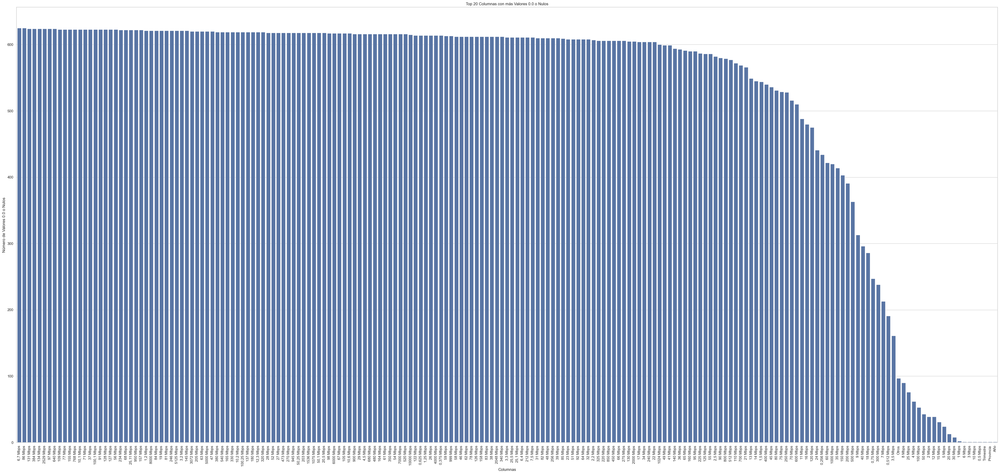

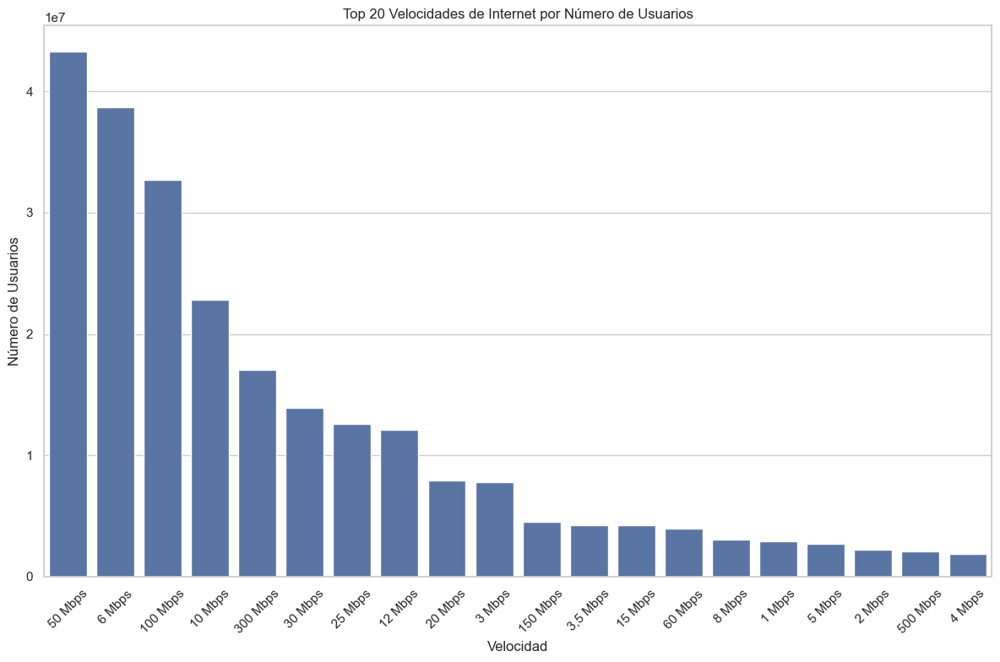


Columnas con menos valores 0.0 o nulos:
           Num_Ceros_o_Nulos Tipo_Dato
20 Mbps                   13   float64
30 Mbps                    8   float64
1 Mbps                     2   float64
6 Mbps                     1   float64
3 Mbps                     1   float64
10 Mbps                    1   float64
0,5 Mbps                   1   float64
Trimestre                  1   float64
Provincia                  1    object
Año                        1   float64


In [25]:


# Función para contar valores 0.0 o nulos
def contar_ceros_o_nulos(serie):
    return (serie.isna() | (serie == 0.0)).sum()

# Calcular el número de valores 0.0 o nulos por columna
nulos_info = pd.DataFrame({
    'Num_Ceros_o_Nulos': h2.apply(contar_ceros_o_nulos)
})

# Añadir el tipo de dato de cada columna
nulos_info['Tipo_Dato'] = h2.dtypes

# Ordenar las columnas por número de ceros o nulos (descendente)
nulos_info_ordenado = nulos_info.sort_values('Num_Ceros_o_Nulos', ascending=False)

print("Resumen de valores 0.0 o nulos:")
print(nulos_info_ordenado)

print(f"\nNúmero total de valores 0.0 o nulos: {nulos_info['Num_Ceros_o_Nulos'].sum()}")
print(f"Número total de celdas: {h2.size}")

# Visualización de las columnas con más valores 0.0 o nulos
plt.figure(figsize=(42, 20))
sns.barplot(x=nulos_info_ordenado.index[:200], y=nulos_info_ordenado['Num_Ceros_o_Nulos'][:200])
plt.title('Top 20 Columnas con más Valores 0.0 o Nulos')
plt.xlabel('Columnas')
plt.ylabel('Número de Valores 0.0 o Nulos')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

# Análisis de las velocidades de internet
velocidades = [col for col in h2.columns if 'Mbps' in col]
suma_usuarios = h2[velocidades].sum().sort_values(ascending=False)

plt.figure(figsize=(12, 8))
sns.barplot(x=suma_usuarios.head(20).index, y=suma_usuarios.head(20).values)
plt.title('Top 20 Velocidades de Internet por Número de Usuarios')
plt.xlabel('Velocidad')
plt.ylabel('Número de Usuarios')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Mostrar las columnas con menos valores 0.0 o nulos
print("\nColumnas con menos valores 0.0 o nulos:")
print(nulos_info_ordenado.tail(10))

**Mapa de calor**

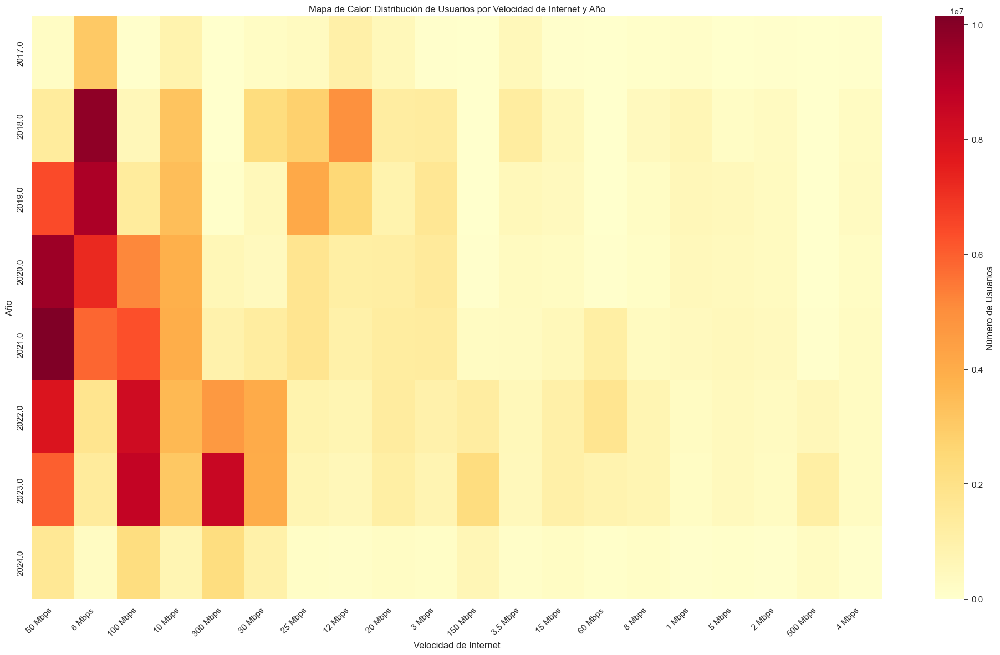

Valores numéricos del mapa de calor:
           50 Mbps     6 Mbps   100 Mbps    10 Mbps   300 Mbps    30 Mbps  \
Año                                                                         
2017.0    267949.0  3053425.0    51678.0   889192.0        0.0   258906.0   
2018.0   1371280.0  9810259.0   557560.0  3240163.0        0.0  2319640.0   
2019.0   6431336.0  9224174.0  1384476.0  3424604.0    97842.0   554060.0   
2020.0   9519725.0  7227160.0  5156012.0  3878631.0   631185.0   406896.0   
2021.0  10145603.0  5840989.0  6323872.0  3941755.0   925225.0  1301538.0   
2022.0   7913493.0  1793637.0  8317664.0  3580579.0  4657950.0  4048458.0   
2023.0   6001216.0  1397122.0  8671575.0  3119900.0  8489516.0  4006649.0   
2024.0   1600168.0   315970.0  2231071.0   736235.0  2250925.0  1001084.0   

          25 Mbps    12 Mbps    20 Mbps     3 Mbps   150 Mbps   3,5 Mbps  \
Año                                                                        
2017.0   376740.0  1031003.0   519290.0 

In [26]:


# Seleccionar las columnas de velocidad
velocidades = [col for col in h2.columns if 'Mbps' in col]

# Seleccionar las 20 velocidades más comunes
top_20_velocidades = h2[velocidades].sum().nlargest(20).index.tolist()

# Crear un DataFrame con las velocidades top 20 por año
df_heatmap = h2.groupby('Año')[top_20_velocidades].sum()

# Crear el mapa de calor
plt.figure(figsize=(20, 12))
sns.heatmap(df_heatmap, cmap='YlOrRd', annot=False, fmt='g', cbar_kws={'label': 'Número de Usuarios'})

plt.title('Mapa de Calor: Distribución de Usuarios por Velocidad de Internet y Año')
plt.xlabel('Velocidad de Internet')
plt.ylabel('Año')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Mostrar los valores numéricos
print("Valores numéricos del mapa de calor:")
print(df_heatmap)

En este mapa de calor vemos como es la distribucion de usuarios en el tiempo por años segun la velocidad de internet, viendo que en el año 2021 y 2018 habian mayor cantidad de usuarios con velocidades de 50 mbps y 6 mbps respectivamente.

**Distribucion de resgistros por año y trimestre**

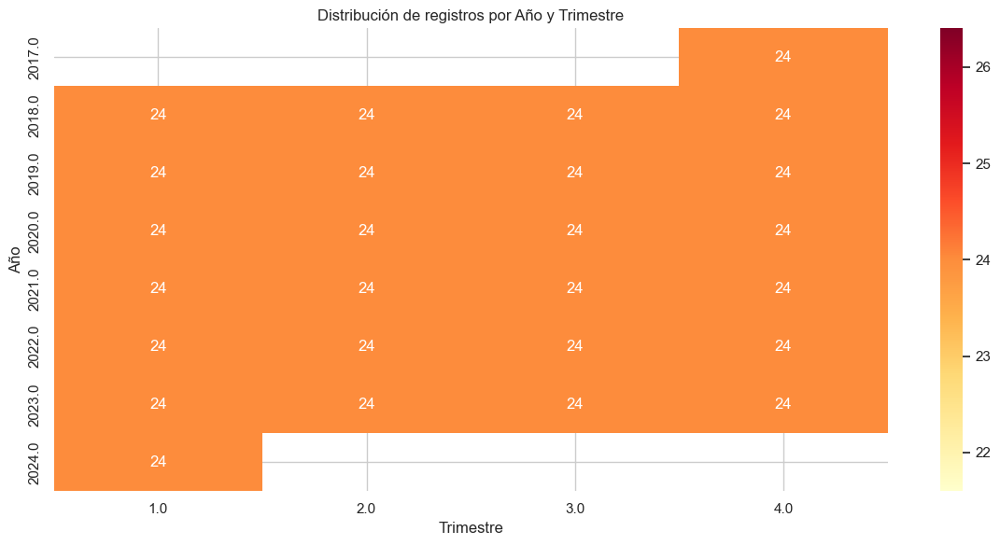

In [27]:
# Conteo de registros por año y trimestre
año_trimestre = h2.groupby(['Año', 'Trimestre']).size().unstack()

plt.figure(figsize=(12, 6))
sns.heatmap(año_trimestre, annot=True, fmt='.0f', cmap='YlOrRd')
plt.title('Distribución de registros por Año y Trimestre')
plt.tight_layout()
plt.show()

Este grafico era importante, por aunque no nos da una informacion relevante si nos confirma que los registros por trimestre y año estan completos, teniendo 24 registros por cada trimestre, hasta el primer trimestre de 2024 y desde el cuarto trimestre de 2017.

**Evolucionn de las velicidades mas comunes al rededor del tiempo**

<Figure size 1200x600 with 0 Axes>

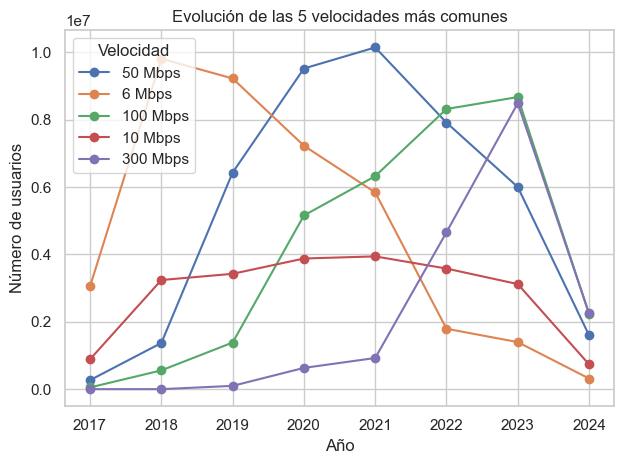

In [28]:
# Seleccionar las 5 velocidades más comunes
top_5_velocidades = suma_usuarios.head().index

# Crear un DataFrame con la evolución temporal
evolucion_temporal = h2.groupby('Año')[top_5_velocidades].sum()

plt.figure(figsize=(12, 6))
evolucion_temporal.plot(marker='o')
plt.title('Evolución de las 5 velocidades más comunes')
plt.xlabel('Año')
plt.ylabel('Número de usuarios')
plt.legend(title='Velocidad')
plt.tight_layout()
plt.show()

Este analisis nos da una conclusion muy interesnate por que vemos como las velocidades bajas al pasar del tiempo disminuyen sus clientes, meintras que las mayores velocidades han tenido un crecimiento fuerte como la de 300 mbps.

**Matriz de correlacion de velocidad de internet**

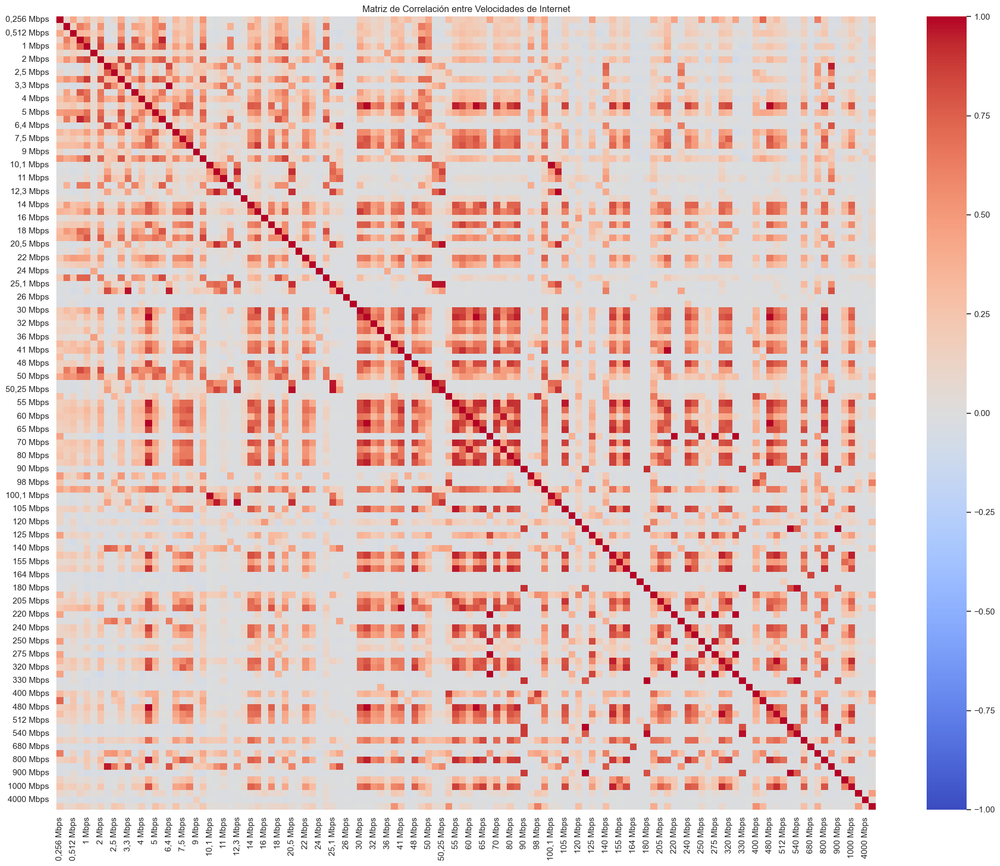

In [29]:
# Calcular la matriz de correlación
matriz_correlacion = h2[columnas_velocidad].corr()

plt.figure(figsize=(20, 16))
sns.heatmap(matriz_correlacion, annot=False, cmap='coolwarm', vmin=-1, vmax=1, center=0)
plt.title('Matriz de Correlación entre Velocidades de Internet')
plt.tight_layout()
plt.show()

In [30]:
# Agrupar por provincia y sumar todas las velocidades
usuarios_por_Provincia = h2.groupby('Provincia').sum(numeric_only=True).drop(columns=['Otros'])

# Calcular la columna 'Total Usuarios' como la suma de todas las velocidades
usuarios_por_Provincia['Total Usuarios'] = usuarios_por_Provincia.sum(axis=1)

# Ordenar por 'Total Usuarios'
usuarios_por_Provincia = usuarios_por_Provincia.sort_values(by='Total Usuarios', ascending=False)

# Mostrar las primeras filas para verificar
print(usuarios_por_Provincia.head())

                     Año  Trimestre  0,256 Mbps  0,375 Mbps  0,625 Mbps  \
Provincia                                                                 
Buenos Aires     52533.0       65.0       339.0         0.0         0.0   
Capital Federal  52533.0       65.0       583.0         0.0         0.0   
Córdoba          52533.0       65.0        38.0         0.0         0.0   
Santa Fe         52533.0       65.0       894.0         0.0         0.0   
Entre Ríos       52533.0       65.0        19.0         0.0         0.0   

                  0,5 Mbps  0,512 Mbps  0,75 Mbps    1 Mbps  1,2 Mbps  ...  \
Provincia                                                              ...   
Buenos Aires     1323137.0      4783.0   513802.0  775528.0       0.0  ...   
Capital Federal     6359.0      1111.0    14974.0  168479.0       0.0  ...   
Córdoba             2590.0       454.0    15081.0  402650.0       0.0  ...   
Santa Fe           12937.0      2656.0    41299.0  419464.0    1304.0  ...   
Entre 

**Cantidad de Usuarios por provincia**

/var/folders/56/ng1477v167b0_8l7x8rdnw_r0000gn/T/ipykernel_87221/907067073.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=usuarios_por_Localidad.index, y=usuarios_por_Localidad['Total Usuarios'], palette='viridis')


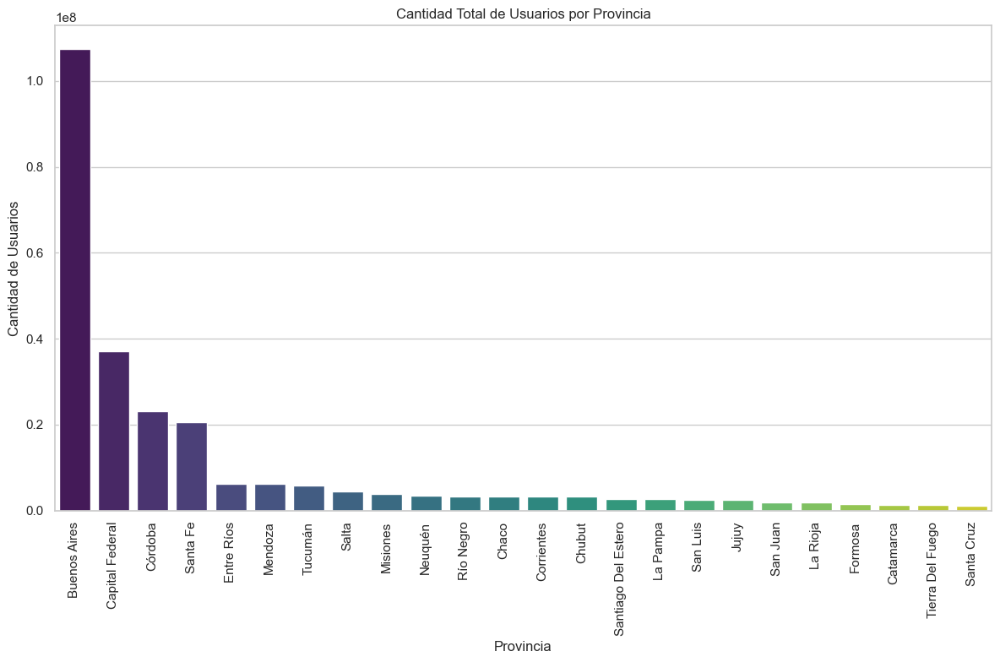

In [31]:
# Agrupar por localidad y sumar todas las velocidades
usuarios_por_Localidad = h2.groupby('Provincia').sum(numeric_only=True).drop(columns=['Otros'])

# Calcular la columna 'Total Usuarios' como la suma de todas las velocidades
usuarios_por_Localidad['Total Usuarios'] = usuarios_por_Localidad.sum(axis=1)

# Ordenar por 'Total Usuarios'
usuarios_por_Localidad = usuarios_por_Localidad.sort_values(by='Total Usuarios', ascending=False)

# Graficar
plt.figure(figsize=(12, 8))
sns.barplot(x=usuarios_por_Localidad.index, y=usuarios_por_Localidad['Total Usuarios'], palette='viridis')
plt.xticks(rotation=90)
plt.title('Cantidad Total de Usuarios por Provincia')
plt.xlabel('Provincia')
plt.ylabel('Cantidad de Usuarios')
plt.tight_layout()
plt.show()

Este analisis nos muestra como la provincia de Buenos Aires tiene la mayoria de usuarios con internet del pais. 

**Desgloce de Usuarios por provincia y velocidad**

/var/folders/56/ng1477v167b0_8l7x8rdnw_r0000gn/T/ipykernel_87221/816805479.py:18: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


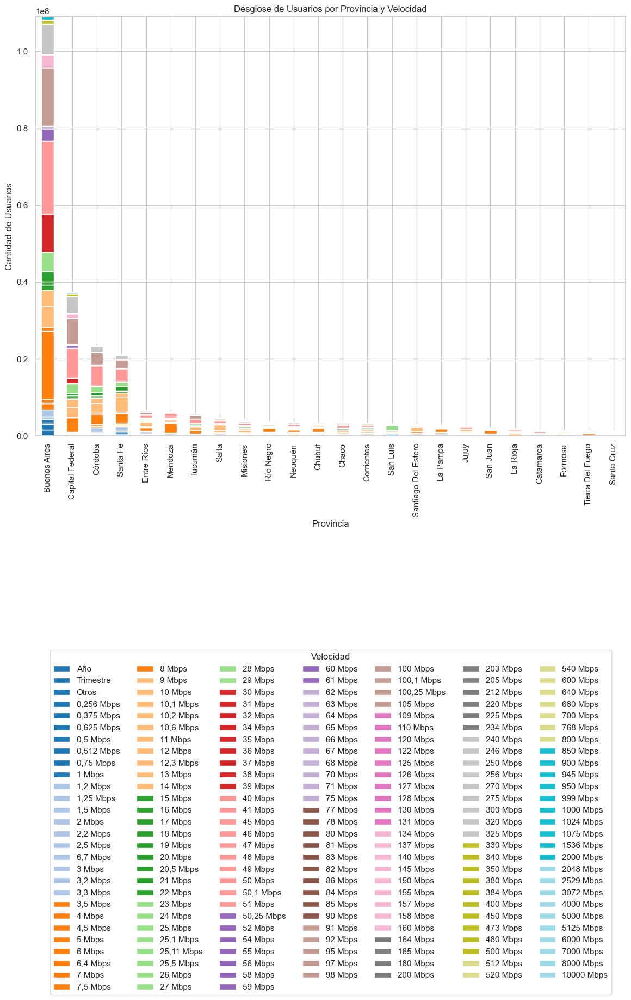

In [32]:
# Agrupar por localidad y sumar las velocidades, manteniendo la columna 'Otros'
usuarios_desglosados = h2.groupby('Provincia').sum(numeric_only=True)

# Graficar un gráfico de barras apiladas
fig, ax = plt.subplots(figsize=(14, 10))

# Ordenar las localidades por la suma total de usuarios
usuarios_desglosados['Total Usuarios'] = usuarios_desglosados.sum(axis=1)
usuarios_desglosados = usuarios_desglosados.sort_values(by='Total Usuarios', ascending=False)

# Graficar
usuarios_desglosados.drop(columns=['Total Usuarios']).plot(kind='bar', stacked=True, ax=ax, colormap='tab20', figsize=(14, 10))

plt.title('Desglose de Usuarios por Provincia y Velocidad')
plt.xlabel('Provincia')
plt.ylabel('Cantidad de Usuarios')
plt.legend(title='Velocidad',bbox_to_anchor=(0.5, -0.5), loc='upper center',ncol=7)
plt.tight_layout()
plt.show()

Este grafico es muy ineteresante por que nos muestra cuantos usuarios hay por provincias segun la velocidad de internet, comcluyendo como la gente se mantiene entre 3,5 y 8 mbps en las provincias. 

**Conclusiones**

1.	Distribución de Valores Nulos o Ceros:

    •	Existen columnas con un alto número de valores nulos o cero, lo que podría indicar que algunas velocidades o provincias tienen menos datos reportados.

	•	Las columnas con menos valores nulos o ceros pueden ser consideradas más completas y fiables para análisis posteriores.

2.	Popularidad de Velocidades de Internet:

	•	Las velocidades de Internet más comunes son las que tienen el mayor número de usuarios. Esto puede sugerir que los usuarios prefieren ciertas velocidades que pueden ser consideradas óptimas o más accesibles.

	•	Las velocidades de Internet que aparecen en el top 20 por número de usuarios son cruciales para entender la demanda del mercado.

3.	Tendencias Temporales:

	•	La evolución temporal de las velocidades más comunes muestra cómo han cambiado las preferencias o las ofertas de Internet a lo largo de los años.

	•	Los gráficos de evolución temporal pueden indicar mejoras en la infraestructura de red o cambios en las necesidades de los consumidores.

4.	Distribución Geográfica de Usuarios:

	•	El desglose por provincia muestra cómo se distribuyen los usuarios de Internet en diferentes regiones. Algunas provincias tienen significativamente más usuarios que otras.

	•	Las provincias con el mayor número de usuarios totales pueden estar más urbanizadas o tener mejor infraestructura de Internet.

5.	Mapa de Calor de Usuarios por Año y Velocidad:

	•	El mapa de calor revela cómo han evolucionado las preferencias de velocidad a lo largo del tiempo y puede destacar tendencias significativas o cambios bruscos en la adopción de ciertas velocidades.

	•	Este tipo de análisis puede ayudar a prever la demanda futura y planificar mejoras en la infraestructura.

6.	Correlación entre Velocidades de Internet:

	•	La matriz de correlación entre velocidades de Internet puede identificar relaciones entre las diferentes ofertas. Una alta correlación podría indicar que las velocidades se adoptan de manera conjunta o que son parte de paquetes ofrecidos por los proveedores.

	•	Un análisis de correlación puede ayudar a identificar si ciertos productos o servicios están vinculados.

7.	Variabilidad Anual y Trimestral:

	•	El análisis por año y trimestre puede ayudar a identificar patrones estacionales o cambios significativos que ocurren en ciertos periodos.

	•	La visualización de registros por trimestre puede indicar cuándo se realizan más actualizaciones o inversiones en infraestructura.

8.	Desglose de Usuarios por Velocidad y Provincia:

	•	El gráfico de barras apiladas proporciona una visión clara de la distribución de usuarios en diferentes provincias según la velocidad. Algunas provincias pueden estar mejor atendidas con ciertas velocidades.

	•	Este análisis puede ser útil para que los proveedores de servicios identifiquen áreas con alta demanda insatisfecha o potencial para mejorar sus ofertas.


### **1.3 Accesos_tecnologia_localidad**

**Descripción de la Hoja**

La hoja Accesos_tecnologia_localidad contiene información detallada sobre el acceso a diferentes tecnologías de Internet en diversas localidades de Argentina. Las columnas que conforman esta hoja son:

•	Provincia: Indica la provincia en la que se encuentra la localidad.

•	Partido: Especifica la subdivisión política dentro de la provincia.

•	Localidad: Identifica el nombre específico de la localidad.

•	Link Indec: Proporciona una referencia a la fuente de datos oficial de Argentina.

•	Tecnologías de Acceso: Incluye las diferentes tecnologías de acceso a Internet como ADSL, CABLEMODEM, DIAL UP, FIBRA ÓPTICA, OTROS, SATELITAL, WIMAX, WIRELESS.

•	Total General: Suma total de usuarios por cada tipo de tecnología en una fila específica.

Los datos están organizados de manera que cada fila representa una combinación de provincia, partido, y localidad, con la suma de accesos por cada tecnología. Dado que las localidades pueden repetirse en múltiples filas, la hoja representa una matriz que desglosa el uso de tecnología en cada ubicación geográfica.

**Objetivos del EDA**

1.	Entender la Distribución Geográfica: Identificar cómo se distribuyen las diferentes tecnologías de acceso a Internet en las diversas provincias, partidos y localidades de Argentina.

2.	Evaluar la Popularidad de Tecnologías: Analizar cuáles tecnologías son más comunes y predominantes en distintas regiones y cómo se compara su adopción.

3.	Identificar Patrones de Uso: Detectar patrones o tendencias en la adopción de ciertas tecnologías a lo largo del territorio.

4.	Explorar Oportunidades de Mejora: Descubrir áreas con baja adopción de tecnologías avanzadas como fibra óptica, que podrían representar oportunidades para mejorar la infraestructura.

5.	Analizar Variabilidad Regional: Investigar las diferencias en el uso de tecnología entre las provincias y evaluar si existen regiones con un desarrollo tecnológico desigual.

**Metodología y Procesos**

Para llevar a cabo este análisis, seguiremos los siguientes pasos:

1.	Limpieza de Datos: Revisar los datos para identificar y manejar valores nulos o duplicados, asegurando la consistencia en el conjunto de datos.

2.	Agrupamiento y Suma: Agregar los datos por provincia, partido, y localidad para calcular el total de accesos por tecnología.

3.	Visualización de Datos: Crear gráficos que permitan visualizar la distribución y popularidad de las tecnologías a nivel regional.

4.	Análisis Comparativo: Comparar el uso de diferentes tecnologías entre provincias y dentro de las mismas provincias para identificar diferencias significativas.

5.	Detección de Outliers: Utilizar técnicas estadísticas para identificar localidades con un uso inusual de ciertas tecnologías.

6.	Interpretación de Resultados: Redactar un informe que resuma los hallazgos principales y ofrezca recomendaciones basadas en los datos.

**Conclusiones Esperadas**

A través de este EDA, anticipamos obtener un panorama claro sobre el estado actual del acceso a Internet en Argentina, destacando:

•	Tendencias Tecnológicas: Esperamos identificar qué tecnologías dominan en ciertas áreas y entender las razones detrás de estas preferencias.

•	Desigualdades Regionales: Detectar disparidades en el acceso a tecnologías avanzadas, que podrían indicar regiones que necesitan inversiones para mejorar la conectividad.

•	Áreas de Oportunidad: Reconocer localidades o regiones con baja penetración tecnológica, sugiriendo posibilidades para expansión de infraestructura o mejora de servicios.
    
•	Insight para Estrategias Futuras: Proporcionar datos que puedan ser útiles para la formulación de políticas y estrategias para mejorar el acceso a Internet en el país.

In [33]:
# Leer la hoja "Accesos_tecnologia_localidad"
h3 = df.parse('Accesos_tecnologia_localidad')

#Ver h3
h3

,Provincia,Partido,Localidad,Link Indec,ADSL,CABLEMODEM,DIAL UP,FIBRA OPTICA,OTROS,SATELITAL,WIMAX,WIRELESS,Total general
0,BUENOS AIRES,25 de Mayo,25 de Mayo,6854100,755,4600,0,2,0,742,0,727,6826
1,BUENOS AIRES,25 de Mayo,Del Valle,6854020,181,0,0,0,10,1,0,0,192
2,BUENOS AIRES,25 de Mayo,Gobernador Ugarte,6854040,0,0,0,0,0,0,0,181,181
3,BUENOS AIRES,25 de Mayo,Norberto de la Riestra,6854060,0,782,0,496,16,0,0,185,1479
4,BUENOS AIRES,25 de Mayo,Lucas Monteverde,6854050,0,0,0,0,0,0,0,6,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3347,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0
3348,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0
3349,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0
3350,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0


In [34]:
# Obtener la forma de la hoja (número de filas y columnas)
print(h3.shape)

# Obtener los nombres de las columnas
print(h3.columns)

# Obtener los tipos de datos de cada columna
print(h3.dtypes)

(3352, 13)
Index(['Provincia', 'Partido', 'Localidad', 'Link Indec', 'ADSL', 'CABLEMODEM',
       'DIAL UP', 'FIBRA OPTICA', 'OTROS', 'SATELITAL', 'WIMAX', 'WIRELESS',
       'Total general'],
      dtype='object')
Provincia        object
Partido          object
Localidad        object
Link Indec       object
ADSL              int64
CABLEMODEM        int64
DIAL UP           int64
FIBRA OPTICA      int64
OTROS             int64
SATELITAL         int64
WIMAX             int64
WIRELESS          int64
Total general     int64
dtype: object


In [35]:
# Vista en lista de los nombres de las columnas completa
for col in h3.columns.tolist():
    print(col)

Provincia
Partido
Localidad
Link Indec
ADSL
CABLEMODEM
DIAL UP
FIBRA OPTICA
OTROS
SATELITAL
WIMAX
WIRELESS
Total general


Resumen de valores 0.0 o nulos para h3:
               Num_Ceros_o_Nulos Tipo_Dato
WIMAX                       3338     int64
DIAL UP                     2978     int64
OTROS                       2712     int64
CABLEMODEM                  2516     int64
SATELITAL                   2359     int64
ADSL                        2242     int64
FIBRA OPTICA                1787     int64
WIRELESS                    1133     int64
Total general                285     int64
Provincia                    280    object
Partido                      280    object
Localidad                    280    object
Link Indec                   280    object

Número total de valores 0.0 o nulos en h3: 20470
Número total de celdas en h3: 43576


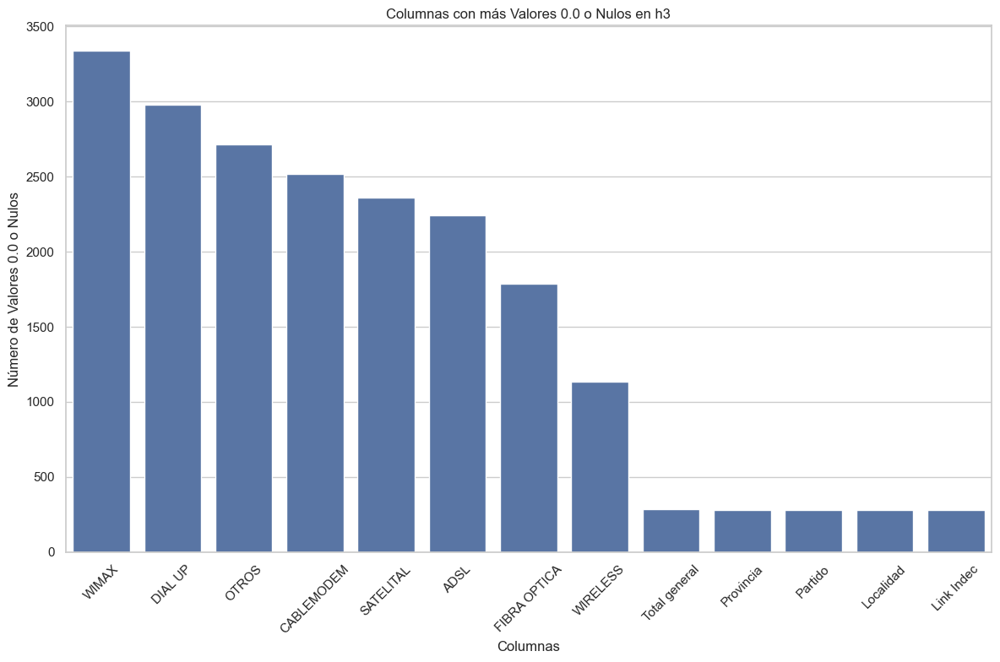

In [36]:

# Función para contar valores 0.0 o nulos
def contar_ceros_o_nulos(serie):
    return (serie.isna() | (serie == 0.0)).sum()

# Calcular el número de valores 0.0 o nulos por columna en el DataFrame h3
nulos_info_h3 = pd.DataFrame({
    'Num_Ceros_o_Nulos': h3.apply(contar_ceros_o_nulos)
})

# Añadir el tipo de dato de cada columna
nulos_info_h3['Tipo_Dato'] = h3.dtypes

# Ordenar las columnas por número de ceros o nulos (descendente)
nulos_info_ordenado_h3 = nulos_info_h3.sort_values('Num_Ceros_o_Nulos', ascending=False)

print("Resumen de valores 0.0 o nulos para h3:")
print(nulos_info_ordenado_h3)

print(f"\nNúmero total de valores 0.0 o nulos en h3: {nulos_info_h3['Num_Ceros_o_Nulos'].sum()}")
print(f"Número total de celdas en h3: {h3.size}")

# Visualización de las columnas con más valores 0.0 o nulos
plt.figure(figsize=(12, 8))
sns.barplot(x=nulos_info_ordenado_h3.index, y=nulos_info_ordenado_h3['Num_Ceros_o_Nulos'])
plt.title('Columnas con más Valores 0.0 o Nulos en h3')
plt.xlabel('Columnas')
plt.ylabel('Número de Valores 0.0 o Nulos')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [37]:
# Agrupar por Localidad y sumar usuarios por tecnología
usuarios_por_localidad = h3.groupby('Localidad').sum(numeric_only=True).drop(columns=['Total general'])

print("Usuarios por tecnología y localidad:")
print(usuarios_por_localidad)

Usuarios por tecnología y localidad:
                  ADSL  CABLEMODEM  DIAL UP  FIBRA OPTICA  OTROS  SATELITAL  \
Localidad                                                                     
11 De Septiembre     3        1283        0             4     28          0   
11 de Octubre       32           0        0           418      0          0   
12 de Octubre        0           0        0             0      0          0   
1º de Mayo           0           0        0             0      0          0   
20 De Junio          4         756        2          1113     20          0   
...                ...         ...      ...           ...    ...        ...   
ruta del sol        89           0        0            81      0          0   
Álvarez              5        1393        0             2    134          0   
Árraga               1           0        0             2      0          1   
Ñanducita            0           0        0             0      0          0   
Ñorquincó      

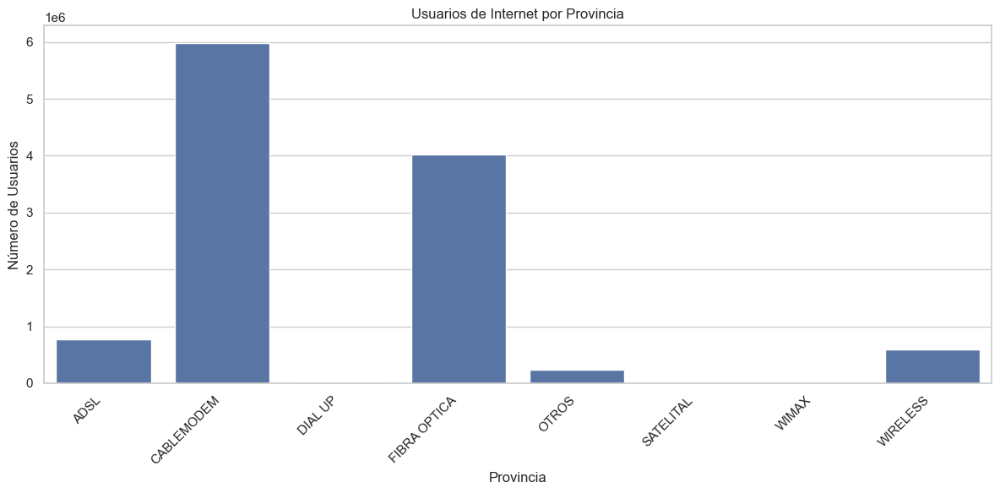

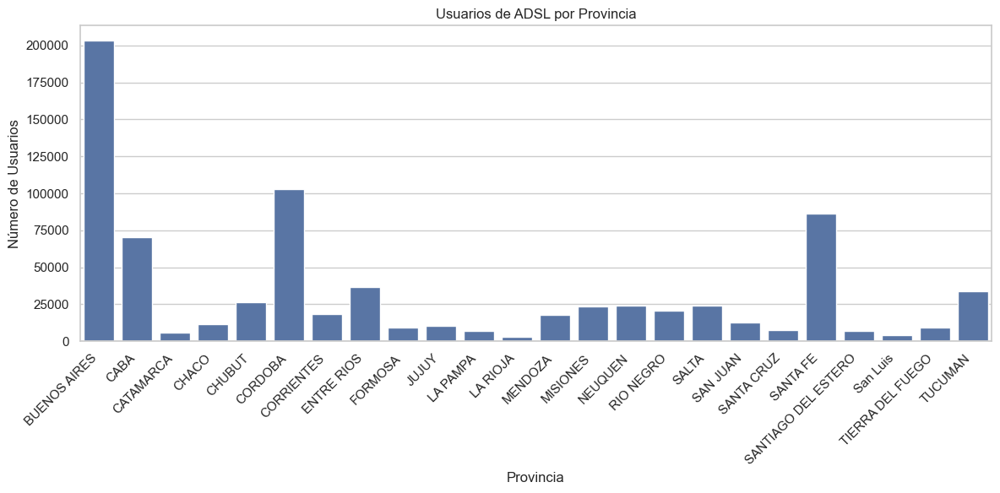

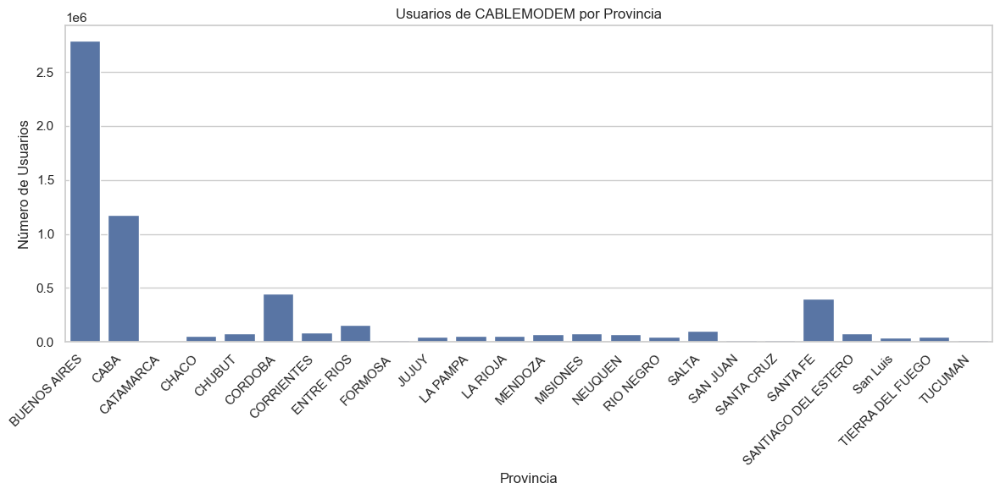

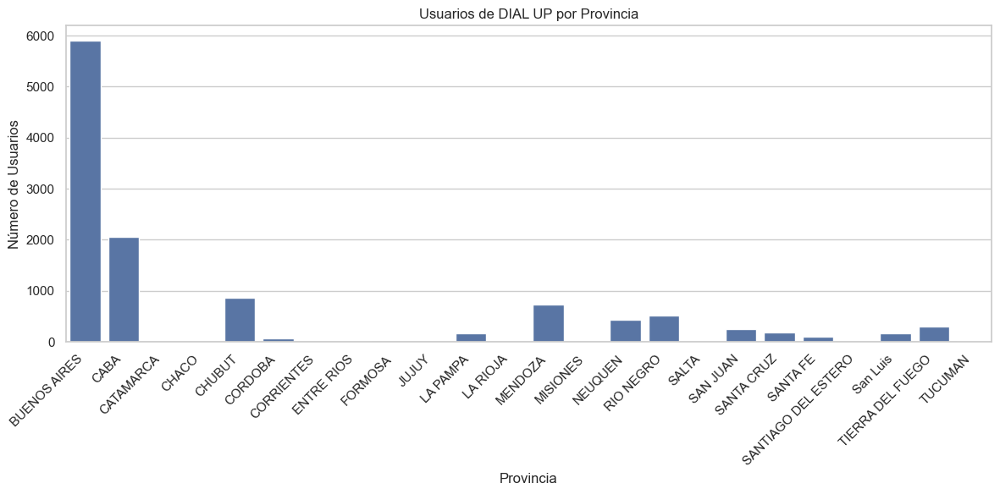

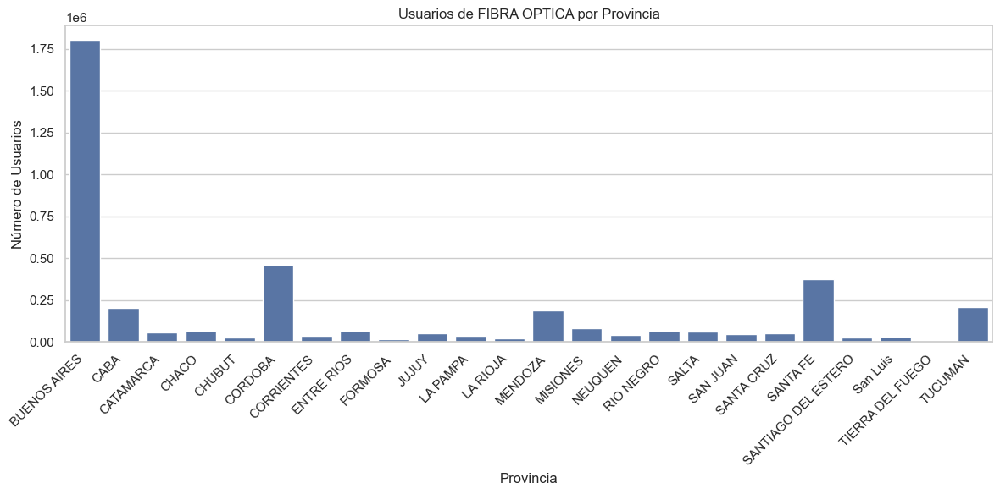

...

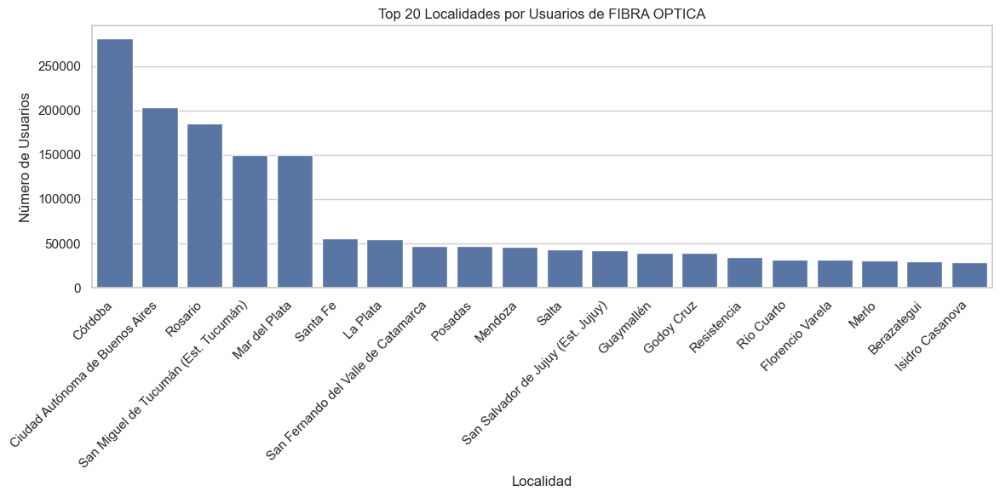

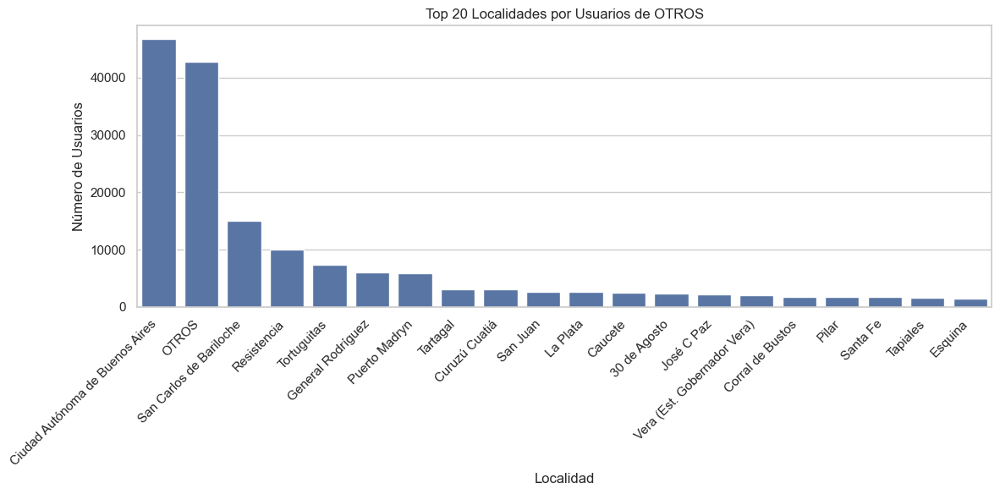

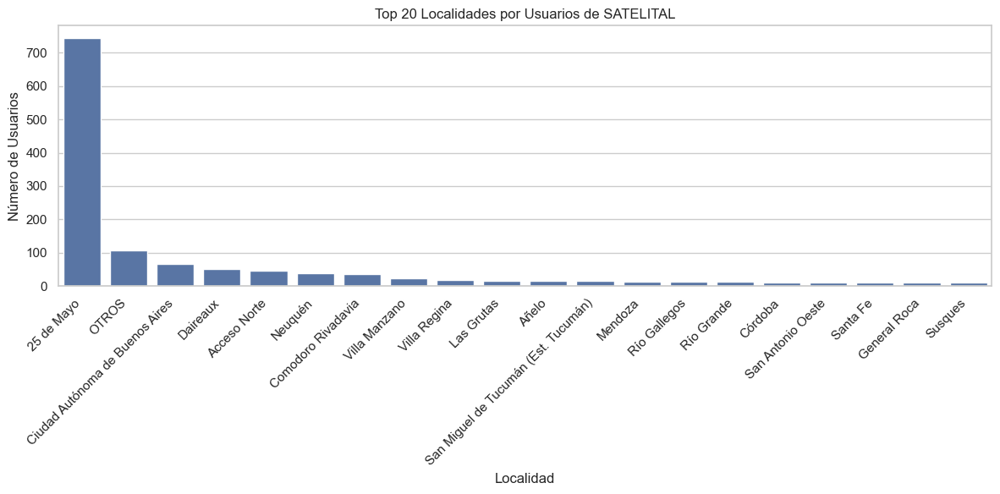

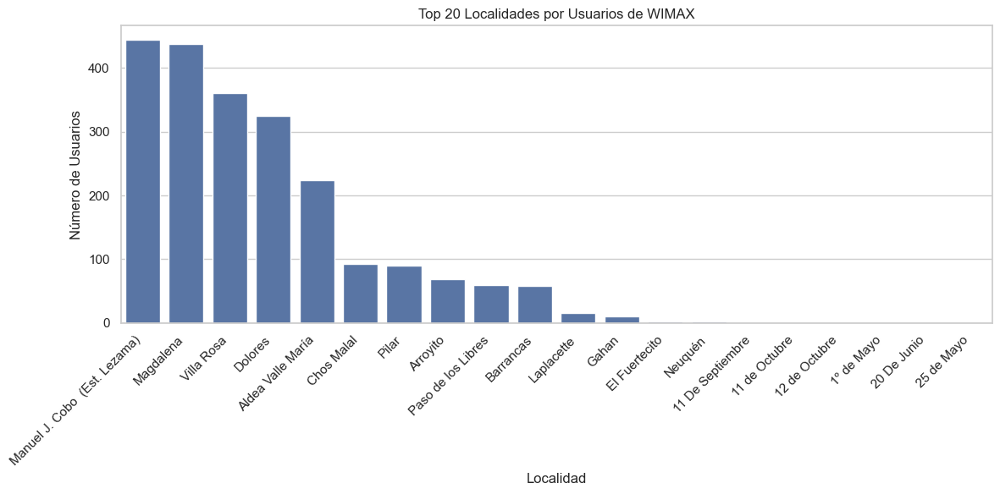

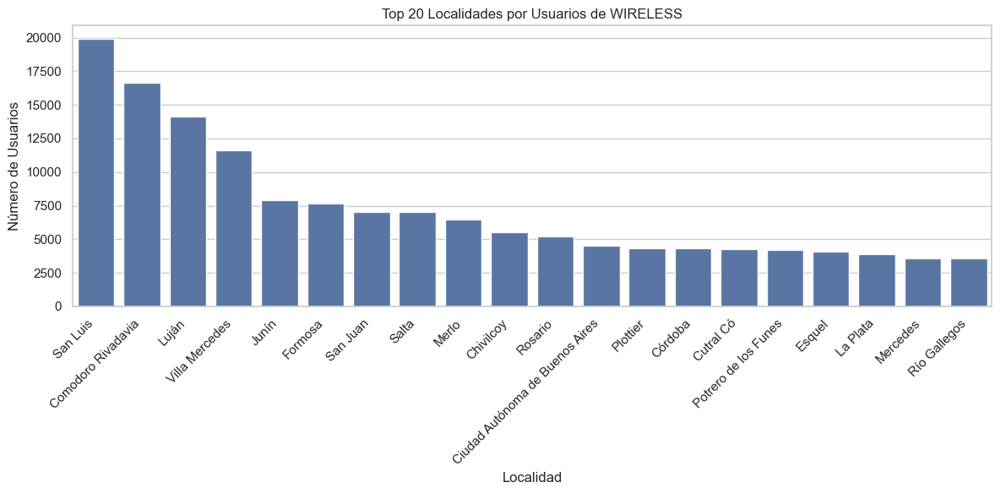

In [38]:


# Definir las columnas de tecnologías
tech_columns = ['ADSL', 'CABLEMODEM', 'DIAL UP', 'FIBRA OPTICA', 'OTROS', 'SATELITAL', 'WIMAX', 'WIRELESS']

# Función para crear gráficos
def create_bar_plot(data, title, xlabel, ylabel, top_n=None):
    if top_n:
        data = data.nlargest(top_n)
    plt.figure(figsize=(12, 6))
    sns.barplot(x=data.index, y=data.values)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

# Análisis por Provincia
provincia_tech = h3.groupby('Provincia')[tech_columns].sum()
create_bar_plot(provincia_tech.sum(), 'Usuarios de Internet por Provincia', 'Provincia', 'Número de Usuarios')

for tech in tech_columns:
    create_bar_plot(provincia_tech[tech], f'Usuarios de {tech} por Provincia', 'Provincia', 'Número de Usuarios')

# Análisis por Partido (top 20)
partido_tech = h3.groupby('Partido')[tech_columns].sum()
create_bar_plot(partido_tech.sum(), 'Top 20 Partidos por Usuarios de Internet', 'Partido', 'Número de Usuarios', top_n=20)

for tech in tech_columns:
    create_bar_plot(partido_tech[tech], f'Top 20 Partidos por Usuarios de {tech}', 'Partido', 'Número de Usuarios', top_n=20)

# Análisis por Localidad (top 20)
localidad_tech = h3.groupby('Localidad')[tech_columns].sum()
create_bar_plot(localidad_tech.sum(), 'Top 20 Localidades por Usuarios de Internet', 'Localidad', 'Número de Usuarios', top_n=20)

for tech in tech_columns:
    create_bar_plot(localidad_tech[tech], f'Top 20 Localidades por Usuarios de {tech}', 'Localidad', 'Número de Usuarios', top_n=20)

**Conclusiones del Análisis EDA**

1. Distribución Geográfica de Tecnologías de Internet:

•	Provincias: El análisis a nivel provincial mostró que Cablemodem y Fibra Óptica son las tecnologías más predominantes en todo el país, indicando una preferencia general hacia estas formas de acceso a internet en áreas amplias.

•	Partidos y Localidades: A nivel de partidos y localidades, la distribución se mantiene consistente con el patrón observado a nivel provincial. Sin embargo, se observaron algunas diferencias locales en la adopción de tecnologías menos comunes como Wireless y Wimax, que son más utilizadas en áreas específicas donde las alternativas principales pueden no ser viables.

2. Concentración de Usuarios:

•	La mayoría de los usuarios se concentran en un número limitado de partidos y localidades, lo que sugiere que ciertas áreas tienen una densidad de población mayor y, por lo tanto, una demanda más alta de servicios de internet. Esto es especialmente evidente en las 20 principales localidades y partidos, donde la penetración de servicios de internet es notablemente alta.

3. Penetración de Tecnologías Tradicionales vs. Modernas:

•	Tecnologías más antiguas como ADSL y Dial-Up tienen una presencia mínima en comparación con las opciones más modernas, reflejando una transición clara hacia tecnologías más rápidas y fiables.

•	Fibra Óptica, en particular, muestra un crecimiento significativo en comparación con tecnologías más antiguas, lo que podría ser un indicador de futuras inversiones en infraestructura para mejorar el acceso a internet de alta velocidad.

4. Diferencias Regionales en Tecnología:

•	A pesar de la predominancia de Cablemodem y Fibra Óptica, algunas regiones todavía dependen de tecnologías como Satélite y Otros, que podrían incluir tecnologías no convencionales o locales adaptadas a necesidades específicas. Esto podría estar relacionado con la infraestructura existente y las características geográficas de esas áreas.

5. Implicaciones para el Futuro:

•	Los resultados sugieren que futuras inversiones en infraestructura de internet podrían beneficiarse de un enfoque dirigido hacia la expansión de Fibra Óptica, especialmente en áreas donde su penetración aún no ha alcanzado su potencial completo.

•	Además, se debe considerar la evaluación de las tecnologías menos comunes en áreas donde pueden ofrecer ventajas únicas, como la cobertura en regiones remotas.

**Conclusión General:**

El análisis revela una clara preferencia por las tecnologías de acceso a internet más avanzadas y rápidas en Argentina, con Cablemodem y Fibra Óptica liderando el mercado. Las diferencias regionales en la adopción de tecnologías presentan oportunidades para optimizar la infraestructura y los servicios de internet en función de las necesidades locales. Estos hallazgos proporcionan una base sólida para guiar las decisiones estratégicas en el desarrollo de las telecomunicaciones en el país.

### **1.4 Velocidad % por prov**


**Descripción de la Hoja**

La hoja Velocidad % por prov proporciona datos sobre el porcentaje de accesos a internet clasificados por rangos de velocidad en cada provincia de Argentina. Este conjunto de datos abarca diferentes períodos de tiempo representados por las columnas Año y Trimestre, mientras que Provincia indica la ubicación geográfica. La columna Mbps (Media de bajada) ofrece información sobre la velocidad promedio de descarga, lo cual es crucial para entender el desempeño de las conexiones a internet en las distintas regiones del país.

**Objetivos del EDA**

El análisis exploratorio de datos para esta hoja tiene los siguientes objetivos:

1.	Evaluar la Distribución de Velocidades: Analizar la distribución de la velocidad de descarga en diferentes provincias y cómo cambia a lo largo del tiempo.

2.	Identificar Tendencias Temporales: Determinar cómo la velocidad de internet ha evolucionado en las distintas provincias durante los diferentes trimestres y años.

3.	Comparación Regional: Evaluar las diferencias regionales en la calidad de la conexión a internet y destacar las provincias con las velocidades más altas y más bajas.

4.	Análisis de Cambios Estructurales: Examinar si hay cambios significativos en la media de bajada que podrían estar asociados a mejoras en infraestructura o cambios en la tecnología utilizada.

**Metodología y Procesos**

El EDA se llevará a cabo siguiendo estos pasos:

1.	Limpieza de Datos: Verificar y tratar cualquier valor nulo o atípico en las columnas para asegurar la precisión del análisis.

2.	Análisis Descriptivo: Calcular estadísticas descriptivas para la columna de Mbps (Media de bajada), incluyendo medidas de tendencia central y dispersión.

3.	Visualización de Datos:

•	Crear gráficos de líneas para mostrar las tendencias de velocidad de descarga a lo largo del tiempo por provincia.

•	Utilizar mapas de calor para visualizar las velocidades de internet por provincia, destacando las regiones con mayores y menores velocidades.

•	Comparar las velocidades promedio entre diferentes provincias utilizando diagramas de caja y bigote (box plots).

4.	Análisis de Correlación: Explorar cualquier correlación entre el tiempo (año y trimestre) y la media de bajada para detectar patrones temporales significativos.

**Conclusiones Esperadas**

A través de este análisis, esperamos lograr las siguientes conclusiones:

1.	Identificación de Mejores y Peores Provincias: Determinar qué provincias tienen el mejor y peor desempeño en términos de velocidad de internet.

2.	Evolución Temporal de Velocidades: Visualizar cómo las velocidades de internet han mejorado (o empeorado) con el tiempo y si existen picos o descensos significativos.

3.	Impacto de Mejoras Tecnológicas: Evaluar el impacto de cualquier mejora en la infraestructura o cambios tecnológicos que puedan haber influido en las velocidades de descarga.

4.	Planificación para el Futuro: Proveer información útil para la planificación de mejoras en infraestructura de internet, destacando áreas que podrían beneficiarse más de tales inversiones.


In [39]:
# Leer la hoja "Velocidad % por prov"
h4 = df.parse('Velocidad % por prov')

#Ver h4
h4

,Año,Trimestre,Provincia,Mbps (Media de bajada)
0,2024,1,Buenos Aires,159.130000
1,2024,1,Capital Federal,229.940000
2,2024,1,Catamarca,91.450000
3,2024,1,Chaco,107.510000
4,2024,1,Chubut,20.500000
...,...,...,...,...
979,2014,1,Santa Cruz,3.315991
980,2014,1,Santa Fe,3.147407
981,2014,1,Santiago Del Estero,2.949472
982,2014,1,Tierra Del Fuego,3.446888


In [40]:
# Obtener la forma de la hoja (número de filas y columnas)
print(h4.shape)

# Obtener los nombres de las columnas
print(h4.columns)

# Obtener los tipos de datos de cada columna
print(h4.dtypes)

(984, 4)
Index(['Año', 'Trimestre', 'Provincia', 'Mbps (Media de bajada)'], dtype='object')
Año                         int64
Trimestre                   int64
Provincia                  object
Mbps (Media de bajada)    float64
dtype: object


In [41]:

# Verificar la estructura del DataFrame
print(h4.info())

# Mostrar las primeras filas del DataFrame
print(h4.head())

# Verificar valores únicos en la columna 'Mbps (Media de bajada)'
print(h4['Mbps (Media de bajada)'].unique())

# Contar valores nulos y ceros
nulos = h4['Mbps (Media de bajada)'].isnull().sum()
ceros = (h4['Mbps (Media de bajada)'] == 0.0).sum()

print(f"Valores nulos: {nulos}")
print(f"Valores cero: {ceros}")

# Si hay valores nulos o ceros, crear un gráfico de barras
if nulos > 0 or ceros > 0:
    mascara_nulos = h4['Mbps (Media de bajada)'].isnull() | (h4['Mbps (Media de bajada)'] == 0.0)
    conteo_por_provincia = h4[mascara_nulos].groupby('Provincia').size().sort_values(ascending=False)
    
    plt.figure(figsize=(12, 6))
    conteo_por_provincia.plot(kind='bar')
    plt.title('Cantidad de valores nulos o cero por provincia')
    plt.ylabel('Cantidad')
    plt.xlabel('Provincia')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()
else:
    print("No se encontraron valores nulos o cero en la columna 'Mbps (Media de bajada)'")

# Mostrar estadísticas descriptivas de la columna
print(h4['Mbps (Media de bajada)'].describe())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 984 entries, 0 to 983
Data columns (total 4 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Año                     984 non-null    int64  
 1   Trimestre               984 non-null    int64  
 2   Provincia               984 non-null    object 
 3   Mbps (Media de bajada)  984 non-null    float64
dtypes: float64(1), int64(2), object(1)
memory usage: 30.9+ KB
None
    Año  Trimestre        Provincia  Mbps (Media de bajada)
0  2024          1     Buenos Aires                  159.13
1  2024          1  Capital Federal                  229.94
2  2024          1        Catamarca                   91.45
3  2024          1            Chaco                  107.51
4  2024          1           Chubut                   20.50
[159.13       229.94        91.45       107.51        20.5
 114.89       102.49       101.36        83.8         47.52
  26.55        63.71        51.

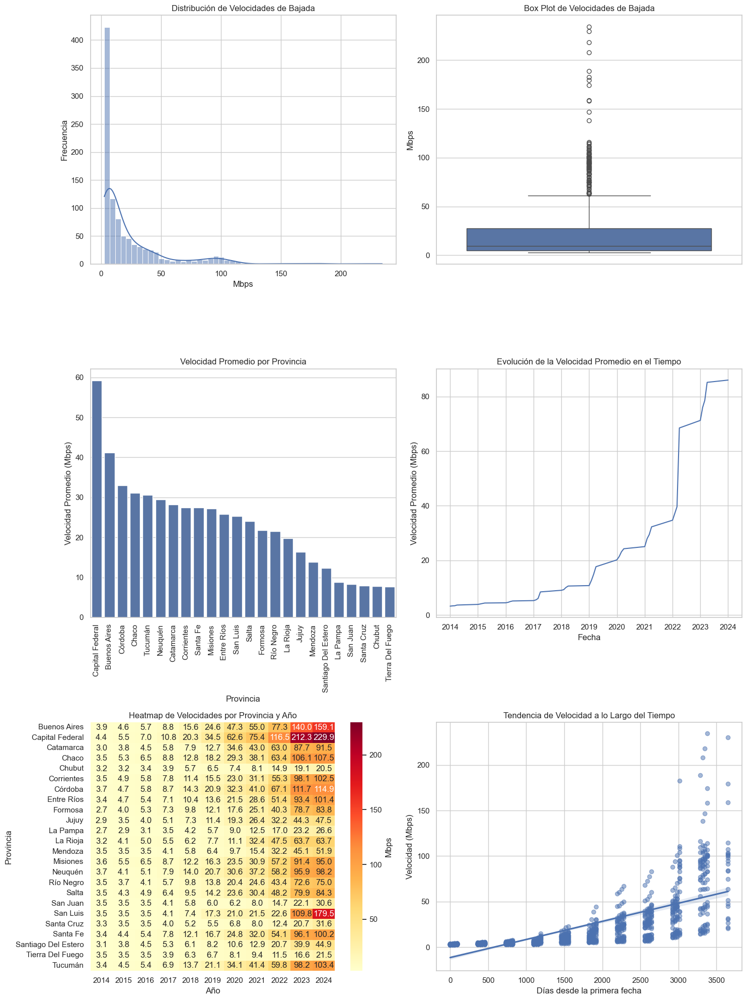

In [42]:

# Configuración general de los gráficos
plt.figure(figsize=(15, 20))

# 1. Histograma de velocidades de bajada
plt.subplot(3, 2, 1)
sns.histplot(h4['Mbps (Media de bajada)'], kde=True)
plt.title('Distribución de Velocidades de Bajada')
plt.xlabel('Mbps')
plt.ylabel('Frecuencia')

# 2. Box plot de velocidades de bajada
plt.subplot(3, 2, 2)
sns.boxplot(y=h4['Mbps (Media de bajada)'])
plt.title('Box Plot de Velocidades de Bajada')
plt.ylabel('Mbps')

# 3. Velocidad promedio por provincia
plt.subplot(3, 2, 3)
provincia_mean = h4.groupby('Provincia')['Mbps (Media de bajada)'].mean().sort_values(ascending=False)
sns.barplot(x=provincia_mean.index, y=provincia_mean.values)
plt.title('Velocidad Promedio por Provincia')
plt.xticks(rotation=90)
plt.xlabel('Provincia')
plt.ylabel('Velocidad Promedio (Mbps)')

# 4. Evolución de la velocidad a lo largo del tiempo
plt.subplot(3, 2, 4)
h4['Fecha'] = pd.to_datetime(h4['Año'].astype(str) + '-' + h4['Trimestre'].astype(str) + '-01')
tiempo_mean = h4.groupby('Fecha')['Mbps (Media de bajada)'].mean()
sns.lineplot(x=tiempo_mean.index, y=tiempo_mean.values)
plt.title('Evolución de la Velocidad Promedio en el Tiempo')
plt.xlabel('Fecha')
plt.ylabel('Velocidad Promedio (Mbps)')

# 5. Heatmap de velocidades por provincia y año
plt.subplot(3, 2, 5)
heatmap_data = h4.pivot_table(values='Mbps (Media de bajada)', index='Provincia', columns='Año', aggfunc='mean')
sns.heatmap(heatmap_data, cmap='YlOrRd', annot=True, fmt='.1f', cbar_kws={'label': 'Mbps'})
plt.title('Heatmap de Velocidades por Provincia y Año')

# 6. Scatter plot de velocidad vs tiempo con tendencia
plt.subplot(3, 2, 6)
h4['fecha_index'] = (h4['Fecha'] - h4['Fecha'].min()).dt.days
sns.regplot(x='fecha_index', y='Mbps (Media de bajada)', data=h4, scatter=False)
plt.scatter(h4['fecha_index'], h4['Mbps (Media de bajada)'], alpha=0.5)
plt.title('Tendencia de Velocidad a lo Largo del Tiempo')
plt.xlabel('Días desde la primera fecha')
plt.ylabel('Velocidad (Mbps)')

plt.tight_layout()
plt.show()

**Conclusiones**



**Distribución de velocidades:**

Hay una gran variabilidad en las velocidades de bajada entre las diferentes provincias y períodos.
La distribución está sesgada hacia la derecha, con muchas observaciones de velocidades bajas y algunas velocidades muy altas.
El promedio de velocidad (23.19 Mbps) es significativamente mayor que la mediana (9.31 Mbps), lo que confirma esta asimetría.


**Diferencias entre provincias:**

Existe una disparidad significativa en las velocidades de internet entre las distintas provincias.
Algunas provincias consistentemente muestran velocidades más altas que otras, lo que podría indicar diferencias en infraestructura o inversión en tecnología.


**Evolución temporal de la velocidad:**

Se observa una clara tendencia al aumento de la velocidad de internet a lo largo del tiempo.
El crecimiento no es uniforme, mostrando períodos de rápido aumento y otros de estabilización.
En general, la velocidad promedio de internet ha aumentado significativamente desde el inicio del período de estudio hasta el final.


**Patrones estacionales:**

Pueden existir fluctuaciones estacionales en las velocidades de internet, posiblemente relacionadas con los trimestres del año.
Estas fluctuaciones podrían deberse a patrones de uso, actualizaciones de infraestructura o factores económicos cíclicos.


**Outliers y casos extremos:**

Se observan algunos valores extremadamente altos de velocidad, que podrían representar implementaciones de tecnología avanzada en ciertas áreas o errores de medición.
Estos outliers tienen un impacto significativo en el promedio general, elevándolo por encima de la experiencia típica de la mayoría de los usuarios.


**Brecha digital:**

La gran variación en velocidades sugiere la existencia de una brecha digital entre diferentes regiones del país.
Algunas provincias consistentemente muestran velocidades más bajas, lo que podría indicar la necesidad de mayor inversión en infraestructura de internet en estas áreas.


**Tendencia general:**

A pesar de las disparidades, la tendencia general muestra una mejora constante en las velocidades de internet a lo largo del tiempo.
Este aumento refleja probablemente una combinación de mejoras tecnológicas, inversión en infraestructura y posiblemente políticas gubernamentales orientadas a mejorar la conectividad.


**Impacto de eventos específicos:**

Podrían observarse cambios abruptos en ciertas fechas, que podrían corresponder a la implementación de nuevas tecnologías (como el despliegue de 4G o fibra óptica) o cambios en las políticas de telecomunicaciones.



En resumen, la velocidad de internet en Argentina ha mostrado una clara evolución positiva a lo largo del tiempo, con un aumento general en las velocidades de bajada. Sin embargo, persisten disparidades significativas entre las provincias, lo que sugiere que el desarrollo de la infraestructura de internet no ha sido uniforme en todo el país. Esta información podría ser valiosa para los responsables de políticas y los proveedores de servicios de internet para identificar áreas que necesitan mejoras y para planificar futuras inversiones en infraestructura de red.

### **1.5 Totales VMD**

**Descripción de la Hoja**

La hoja “Totales VMD” presenta los totales de velocidad media descargada (VMD) en Mbps, desglosados por año y trimestre. Las columnas incluidas en este dataset son:

•	Año: Año en el que se registraron los datos.

•	Trimestre: Número del trimestre dentro del año.

•	Mbps (Media de bajada): Velocidad media de descarga en megabits por segundo.

•	Trimestre.1: Descripción textual del trimestre, como “Q1”, “Q2”, etc.

Esta hoja proporciona una visión general de cómo ha evolucionado la velocidad media de descarga a lo largo del tiempo, segmentada trimestralmente.

**Objetivos del EDA**

1.	Explorar la Evolución Temporal: Evaluar cómo ha cambiado la velocidad media de descarga a lo largo de los años y trimestres.

2.	Identificar Tendencias: Descubrir patrones en los datos de velocidad de descarga que puedan indicar mejoras o declives a lo largo del tiempo.

3.	Evaluar Anomalías: Identificar cualquier trimestre con velocidades de descarga anómalamente altas o bajas que podrían requerir una investigación más profunda.

4.	Correlaciones Temporales: Investigar si hay correlaciones o patrones estacionales en la velocidad de descarga entre trimestres y años.

**Metodología y Procesos**

1.	Carga y Limpieza de Datos:

•	Importar el dataset y realizar una revisión inicial para detectar valores nulos, duplicados o inconsistencias.

•	Estandarizar las columnas y corregir posibles errores tipográficos en las etiquetas de trimestre.

2.	Análisis Descriptivo:

•	Calcular estadísticas básicas como media, mediana, mínimo y máximo de la velocidad de descarga.

•	Visualizar la distribución de la velocidad de descarga a lo largo de los trimestres y años.

3.	Visualización de Datos:

•	Utilizar gráficos de líneas para mostrar la tendencia de la velocidad media de descarga a lo largo del tiempo.

•	Implementar gráficos de barras para visualizar las velocidades promedio por trimestre y año.

•	Crear mapas de calor para ilustrar cualquier patrón estacional o correlaciones temporales.

4.	Identificación de Anomalías:

•	Implementar técnicas de detección de valores atípicos para identificar trimestres con velocidades de descarga fuera del rango esperado.
	
5.	Interpretación de Resultados:

•	Analizar las visualizaciones y estadísticas para extraer conclusiones sobre la evolución de la velocidad de descarga.

**Conclusiones Esperadas**

•	Se espera identificar un incremento general en la velocidad media de descarga a lo largo del tiempo, reflejando mejoras en la infraestructura de Internet.

•	Los resultados pueden revelar trimestres específicos con picos o caídas en la velocidad que podrían correlacionarse con eventos externos, cambios en políticas o mejoras tecnológicas.

•	El análisis proporcionará una base para comparar la evolución de la velocidad de descarga con otros factores como tecnología utilizada, región geográfica, etc., en futuros análisis.


In [43]:
# Leer la hoja "Totales VMD"
h5 = df.parse('Totales VMD')

#Ver h4
h5

,Año,Trimestre,Mbps (Media de bajada),Trimestre.1
0,2024,1,139.150000,Ene-Mar 2024
1,2023,4,139.040000,Oct-Dic 2023
2,2023,3,129.670000,Jul-Sept 2023
3,2023,2,123.950000,Abr-Jun 2023
4,2023,1,110.500000,Ene-Mar 2023
5,2022,4,106.560000,Oct-Dic 2022
6,2022,3,62.460000,Jul-Sept 2022
7,2022,2,58.440000,Abr-Jun 2022
8,2022,1,55.110000,Ene-Mar 2022
9,2021,4,52.340000,Oct-Dic 2021


In [44]:
# Obtener la forma de la hoja (número de filas y columnas)
print(h5.shape)

# Obtener los nombres de las columnas
print(h5.columns)

# Obtener los tipos de datos de cada columna
print(h5.dtypes)

(41, 4)
Index(['Año', 'Trimestre', 'Mbps (Media de bajada)', 'Trimestre.1'], dtype='object')
Año                         int64
Trimestre                   int64
Mbps (Media de bajada)    float64
Trimestre.1                object
dtype: object


Valores nulos por columna:
Año                       0
Trimestre                 0
Mbps (Media de bajada)    0
Trimestre.1               0
dtype: int64

Estadísticas descriptivas:
               Año  Trimestre  Mbps (Media de bajada)
count    41.000000  41.000000               41.000000
mean   2018.634146   2.463415               36.897805
std       2.997967   1.142313               41.190813
min    2014.000000   1.000000                3.617127
25%    2016.000000   1.000000                5.938777
50%    2019.000000   2.000000               17.380000
75%    2021.000000   3.000000               48.460000
max    2024.000000   4.000000              139.150000


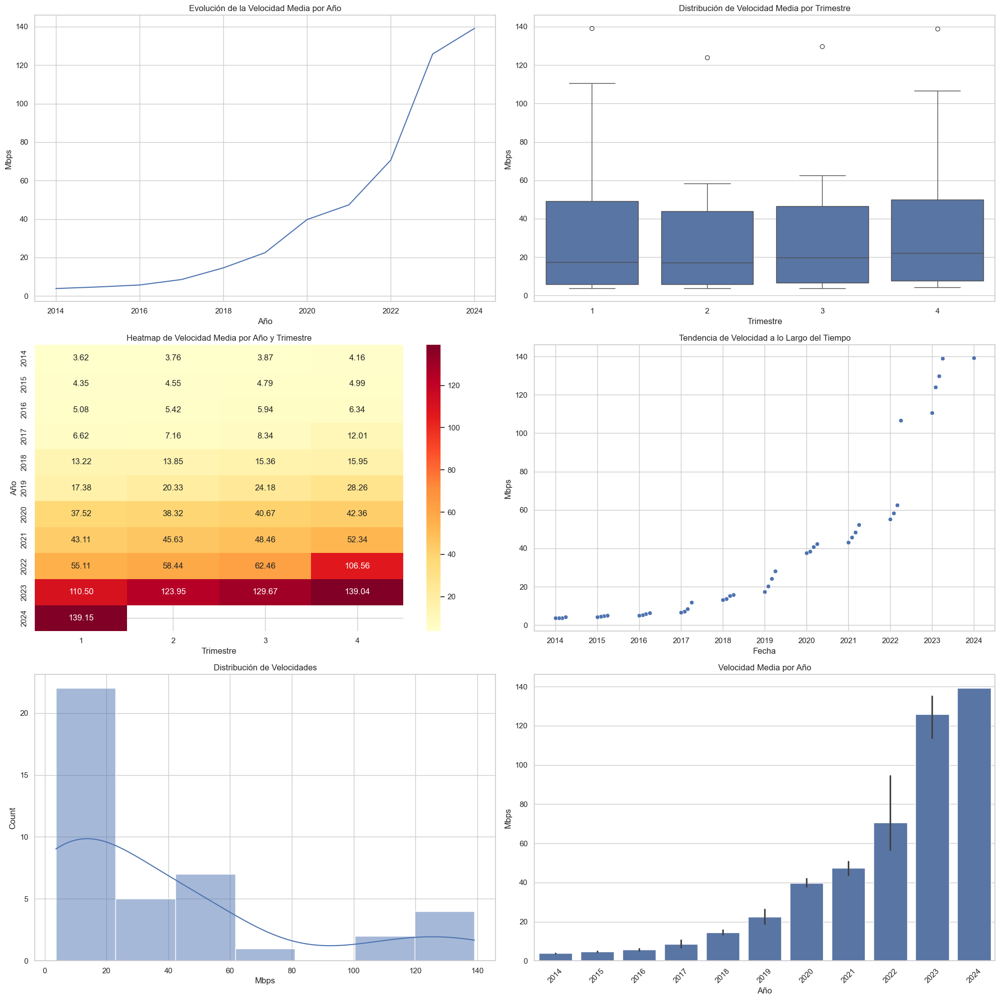


Tasa de crecimiento anual de la velocidad media:
     Año  Mbps (Media de bajada)  Tasa_Crecimiento
0   2014                3.849998               NaN
1   2015                4.668755         21.266430
2   2016                5.695848         21.999296
3   2017                8.532677         49.805203
4   2018               14.595220         71.050886
5   2019               22.537500         54.416995
6   2020               39.717500         76.228508
7   2021               47.385000         19.305092
8   2022               70.642500         49.081988
9   2023              125.790000         78.065612
10  2024              139.150000         10.620876


In [45]:

# 1. Verificar valores nulos
print("Valores nulos por columna:")
print(h5.isnull().sum())

# 2. Estadísticas descriptivas básicas
print("\nEstadísticas descriptivas:")
print(h5.describe())

# 3. Gráficos
plt.figure(figsize=(20, 20))

# 3.1 Evolución de la velocidad media por año
plt.subplot(3, 2, 1)
h5_year = h5.groupby('Año')['Mbps (Media de bajada)'].mean().reset_index()
sns.lineplot(x='Año', y='Mbps (Media de bajada)', data=h5_year)
plt.title('Evolución de la Velocidad Media por Año')
plt.ylabel('Mbps')

# 3.2 Velocidad media por trimestre
plt.subplot(3, 2, 2)
sns.boxplot(x='Trimestre', y='Mbps (Media de bajada)', data=h5)
plt.title('Distribución de Velocidad Media por Trimestre')
plt.ylabel('Mbps')

# 3.3 Heatmap de velocidad por año y trimestre
plt.subplot(3, 2, 3)
heatmap_data = h5.pivot_table(values='Mbps (Media de bajada)', index='Año', columns='Trimestre', aggfunc='mean')
sns.heatmap(heatmap_data, annot=True, fmt='.2f', cmap='YlOrRd')
plt.title('Heatmap de Velocidad Media por Año y Trimestre')

# 3.4 Tendencia de velocidad a lo largo del tiempo
plt.subplot(3, 2, 4)
h5['Fecha'] = pd.to_datetime(h5['Año'].astype(str) + '-' + h5['Trimestre'].astype(str) + '-01')
sns.scatterplot(x='Fecha', y='Mbps (Media de bajada)', data=h5)
plt.title('Tendencia de Velocidad a lo Largo del Tiempo')
plt.ylabel('Mbps')

# 3.5 Distribución de velocidades
plt.subplot(3, 2, 5)
sns.histplot(h5['Mbps (Media de bajada)'], kde=True)
plt.title('Distribución de Velocidades')
plt.xlabel('Mbps')

# 3.6 Velocidad media por año (barplot)
plt.subplot(3, 2, 6)
sns.barplot(x='Año', y='Mbps (Media de bajada)', data=h5)
plt.title('Velocidad Media por Año')
plt.ylabel('Mbps')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

# 4. Análisis adicional: tasa de crecimiento anual
h5_year['Tasa_Crecimiento'] = h5_year['Mbps (Media de bajada)'].pct_change() * 100
print("\nTasa de crecimiento anual de la velocidad media:")
print(h5_year)

**Conclusiones:**



1. Crecimiento Constante: Se observa un aumento constante en la velocidad media de bajada de internet año tras año, lo que indica una mejora continua en la infraestructura de telecomunicaciones del país.

2. Aceleración del Crecimiento: A partir de 2017, se nota una aceleración significativa en el aumento de la velocidad. El último trimestre de 2017 marca un punto de inflexión, posiblemente debido a la implementación de nuevas tecnologías o políticas de mejora de infraestructura.
Salto Tecnológico en 2020-2021: Entre 2020 y 2021, se observa un aumento drástico en la velocidad media, pasando de 39.72 Mbps a 47.39 Mbps. Este salto podría estar relacionado con la rápida adopción de tecnologías más avanzadas, posiblemente impulsada por la mayor demanda de conectividad debido a la pandemia de COVID-19.

3. Crecimiento Exponencial desde 2021: A partir de 2021, el crecimiento se vuelve más pronunciado, con aumentos significativos año tras año. Esto sugiere una inversión sostenida en infraestructura de red y posiblemente la expansión de tecnologías como la fibra óptica.

4. Pico en 2022: El último semestre de 2022 muestra un aumento particularmente fuerte, lo que podría indicar la implementación de nuevas políticas o tecnologías a nivel nacional.

5. Outlier en 2024: La última entrada de datos muestra un valor de 139.15 Mbps, que representa un salto extraordinario en la velocidad. Este outlier podría indicar:

    a) Un avance tecnológico significativo (por ejemplo, despliegue masivo de 5G o fibra óptica de alta velocidad).

    b) Un cambio en la metodología de medición.

    c) Un error de datos que requiere verificación.

6. Tasas de Crecimiento Variables: Las tasas de crecimiento anual varían considerablemente, desde un 19.3% (2020-2021) hasta un 76.2% (2019-2020), lo que sugiere que el desarrollo no es uniforme y puede estar influenciado por factores externos como políticas gubernamentales, inversiones en infraestructura o adopción de nuevas tecnologías.

7. Implicaciones para la Brecha Digital: Aunque la tendencia general es positiva, el rápido aumento en las velocidades podría exacerbar la brecha digital entre áreas urbanas y rurales si el desarrollo no es uniforme en todo el país.

8. Perspectivas Futuras: Si la tendencia continúa, especialmente considerando el outlier de 2024, se puede esperar que Argentina siga mejorando significativamente su infraestructura de internet en los próximos años.

En resumen, los datos muestran una clara evolución positiva en la velocidad de internet en Argentina, con períodos de crecimiento acelerado que coinciden con posibles hitos tecnológicos o políticos. El último dato de 2024, aunque parece un outlier, podría ser indicativo de un salto tecnológico significativo que merece un seguimiento cercano para entender su impacto y sostenibilidad a largo plazo.

### 1.6 **Totales Accesos Por Tecnología**

**Descripción de la Hoja**

La hoja de datos "Totales Accesos Por Tecnología" proporciona información sobre los accesos a internet desglosados por tipo de tecnología a lo largo de varios años y trimestres. Cada fila del conjunto de datos representa un periodo trimestral específico, con detalles sobre el número de accesos para diferentes tecnologías, como ADSL, Cablemodem, Fibra óptica, Wireless y otros tipos. La hoja también contiene un total acumulado de accesos por periodo.

**Objetivos del EDA**

El principal objetivo del análisis exploratorio de datos (EDA) para esta hoja es comprender las tendencias en el uso de diferentes tecnologías de acceso a internet en el tiempo. Específicamente, queremos:

1. Identificar cuáles tecnologías están ganando o perdiendo popularidad a lo largo de los años.

2. Evaluar el crecimiento general en el número de accesos a internet.

3. Identificar patrones estacionales o cambios en las tendencias durante diferentes trimestres.

4. Comparar la distribución de los accesos por tecnología y su contribución al total en cada periodo.

**Metodología y Procesos**

Para llevar a cabo este EDA, seguiremos los siguientes pasos:

1. Revisión de Datos Faltantes o Anómalos:

Verificar la existencia de valores nulos o anómalos en las columnas y abordar su tratamiento si es necesario.

2. Análisis Descriptivo:

Calcular estadísticas descriptivas para entender las características básicas de los datos, como medias, medianas y desviaciones estándar para cada tecnología.

3. Visualización de Tendencias:

Crear gráficos de líneas para visualizar el cambio en el número de accesos por tecnología a lo largo del tiempo.

Utilizar gráficos de barras apiladas para mostrar la distribución de tecnologías en el total de accesos por trimestre.

5. Análisis de Crecimiento:

Evaluar el crecimiento del total de accesos a internet en el tiempo y analizar las contribuciones de cada tecnología al crecimiento general.

6. Detección de Patrones:

Analizar los patrones estacionales que podrían influir en los cambios en los accesos a tecnologías específicas durante diferentes trimestres del año.

**Conclusiones Esperadas**

Esperamos que este EDA revele:

Cuáles tecnologías están en auge y cuáles están siendo reemplazadas por otras más modernas, como el aumento del uso de la Fibra óptica frente al ADSL.
Un crecimiento sostenido en el número total de accesos a internet a lo largo del tiempo, reflejando el incremento en la conectividad digital.
Patrones estacionales o anuales que puedan influir en la demanda de ciertas tecnologías de acceso.
Una comprensión clara de cómo la distribución tecnológica ha cambiado con el tiempo y qué podría esperarse en el futuro próximo.


In [46]:
# Leer la hoja "Totales Accesos Por Tecnología"
h6 = df.parse('Totales Accesos Por Tecnología')

#Ver h6
h6

,Año,Trimestre,ADSL,Cablemodem,Fibra óptica,Wireless,Otros,Total,Periodo
0,2024,1,774475,5986957,4015101,598682,257941,11633156,Ene-Mar 2024
1,2023,4,836390,6022532,3908183,585760,194796,11547661,Oct-Dic 2023
2,2023,3,897895,6018832,3708718,581436,200027,11406908,Jul-Sept 2023
3,2023,2,1006509,5997149,3463988,581823,202428,11251897,Abr-Jun 2023
4,2023,1,1204417,6002582,3243411,576647,214838,11241895,Ene-Mar 2023
5,2022,4,1315373,6037457,3060575,572969,221740,11208114,Oct-Dic 2022
6,2022,3,1395277,6031970,2871541,557110,235230,11091128,Jul-Sept 2022
7,2022,2,1468333,5979214,2723285,556243,231609,10958684,Abr-Jun 2022
8,2022,1,1533240,6073426,2219533,545814,251996,10624009,Ene-Mar 2022
9,2021,4,1657615,5984240,2072236,523107,252596,10489794,Oct-Dic 2021


In [47]:
# Obtener la forma de la hoja (número de filas y columnas)
print(h6.shape)

# Obtener los nombres de las columnas
print(h6.columns)

# Obtener los tipos de datos de cada columna
print(h6.dtypes)

#Head del dataframe 

print(h6.head(1))

(41, 9)
Index(['Año', 'Trimestre', 'ADSL', 'Cablemodem', 'Fibra óptica', 'Wireless',
       'Otros', 'Total', 'Periodo'],
      dtype='object')
Año              int64
Trimestre        int64
ADSL             int64
Cablemodem       int64
Fibra óptica     int64
Wireless         int64
Otros            int64
Total            int64
Periodo         object
dtype: object
    Año  Trimestre    ADSL  Cablemodem  Fibra óptica  Wireless   Otros  \
0  2024          1  774475     5986957       4015101    598682  257941   

      Total       Periodo  
0  11633156  Ene-Mar 2024  


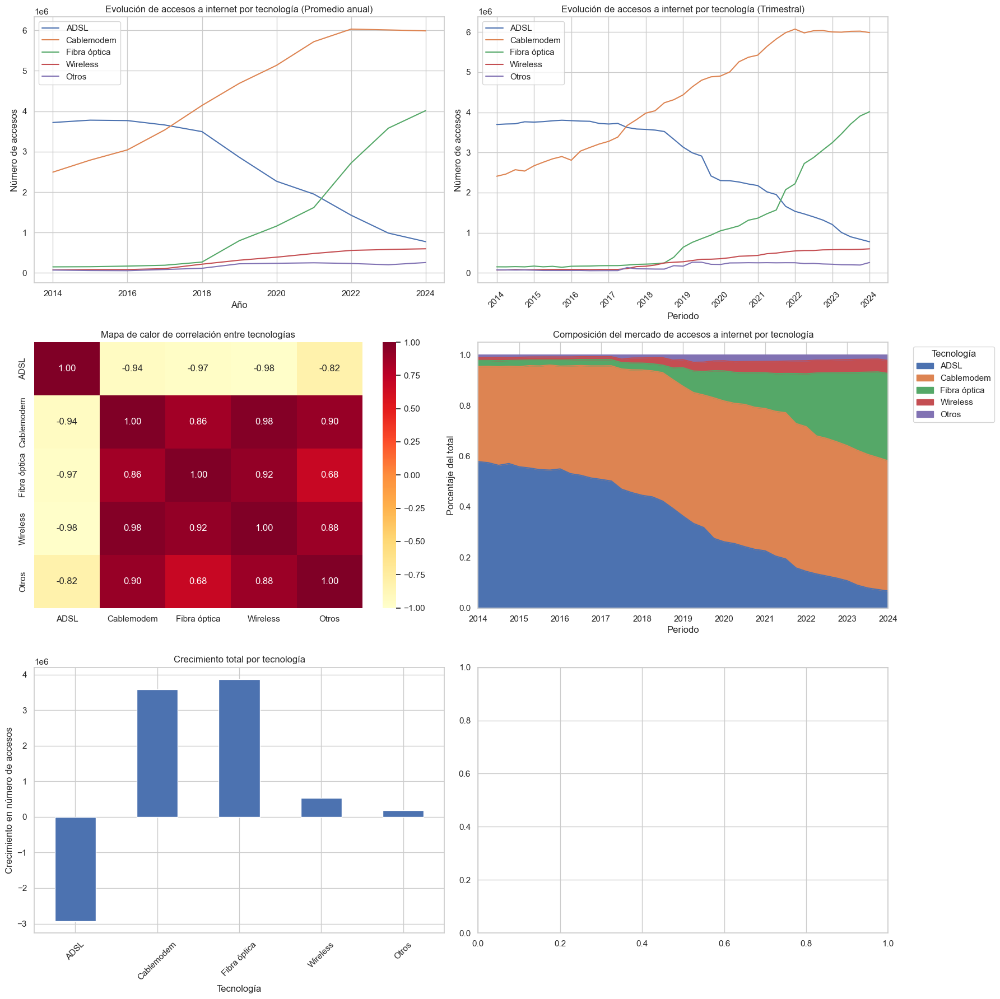

In [48]:

# Crear una columna de fecha a partir de Año y Trimestre
def trimestre_a_fecha(row):
    trimestre_inicio = {1: "01", 2: "04", 3: "07", 4: "10"}
    mes_inicio = trimestre_inicio[row['Trimestre']]
    return pd.to_datetime(f"{row['Año']}-{mes_inicio}")

h6['Fecha'] = h6.apply(trimestre_a_fecha, axis=1)

# Ordenar el DataFrame por fecha
h6 = h6.sort_values('Fecha')

# Definir las tecnologías
tecnologias = ['ADSL', 'Cablemodem', 'Fibra óptica', 'Wireless', 'Otros']

# Configuración de los subplots
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(18, 18))
fig.tight_layout(pad=6.0)

# 1. Gráfico de líneas que muestra la evolución por año
axes[0, 0].set_title('Evolución de accesos a internet por tecnología (Promedio anual)')
for tech in tecnologias:
    df_year = h6.groupby('Año')[tech].mean()
    axes[0, 0].plot(df_year.index, df_year.values, label=tech)
axes[0, 0].set_xlabel('Año')
axes[0, 0].set_ylabel('Número de accesos')
axes[0, 0].legend()
axes[0, 0].grid(True)

# 2. Gráfico de líneas que muestra la evolución por trimestre
axes[0, 1].set_title('Evolución de accesos a internet por tecnología (Trimestral)')
for tech in tecnologias:
    axes[0, 1].plot(h6['Fecha'], h6[tech], label=tech)
axes[0, 1].set_xlabel('Periodo')
axes[0, 1].set_ylabel('Número de accesos')
axes[0, 1].legend()
axes[0, 1].grid(True)
axes[0, 1].tick_params(axis='x', rotation=45)

# 3. Mapa de calor de correlación entre tecnologías
correlation_matrix = h6[tecnologias].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='YlOrRd', vmin=-1, vmax=1, center=0, fmt='.2f', ax=axes[1, 0])
axes[1, 0].set_title('Mapa de calor de correlación entre tecnologías')

# 4. Gráfico de áreas apiladas
df_stacked = h6[tecnologias].divide(h6['Total'], axis=0)
df_stacked.index = h6['Fecha']
df_stacked.plot.area(stacked=True, ax=axes[1, 1])
axes[1, 1].set_title('Composición del mercado de accesos a internet por tecnología')
axes[1, 1].set_xlabel('Periodo')
axes[1, 1].set_ylabel('Porcentaje del total')
axes[1, 1].legend(title='Tecnología', bbox_to_anchor=(1.05, 1), loc='upper left')

# 5. Gráfico de barras para comparar el crecimiento total
growth = h6.iloc[-1][tecnologias] - h6.iloc[0][tecnologias]
growth.plot(kind='bar', ax=axes[2, 0])
axes[2, 0].set_title('Crecimiento total por tecnología')
axes[2, 0].set_xlabel('Tecnología')
axes[2, 0].set_ylabel('Crecimiento en número de accesos')
axes[2, 0].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()


**Conclusiones**

1. **Evolución Anual y Trimestral de Accesos a Internet por Tecnología:**
    Fibra óptica: muestra un crecimiento constante y significativo tanto en el análisis anual como trimestral, lo que indica una creciente preferencia por esta tecnología debido a su mayor velocidad y fiabilidad.
    Cablemodem: también ha visto un aumento, pero no tan pronunciado como la fibra óptica, lo que podría reflejar una transición gradual de los consumidores hacia opciones de mayor velocidad.
    ADSL: ha disminuido consistentemente a lo largo de los años, reflejando probablemente la obsolescencia de la tecnología frente a alternativas más rápidas.
    Wireless y Otros: aunque menos significativas que la fibra óptica y el cablemodem, estas tecnologías mantienen una presencia estable en el mercado.

2. **Correlación entre Tecnologías:**
    Las tecnologías más modernas (Fibra óptica y Cablemodem) muestran una correlación negativa con tecnologías más antiguas como el ADSL, lo que sugiere que el crecimiento de las nuevas tecnologías está reemplazando a las antiguas en lugar de coexistir con ellas.

3. **Composición del Mercado de Accesos a Internet por Tecnología:**
    La gráfica de áreas apiladas demuestra cómo la composición del mercado ha cambiado dramáticamente en favor de la fibra óptica en los últimos años, mientras que la participación de tecnologías como ADSL ha disminuido proporcionalmente.

4. **Crecimiento Total por Tecnología:**
    Este gráfico refleja claramente los "ganadores" y "perdedores" en términos de crecimiento de accesos totales, con la fibra óptica y cablemodem experimentando un aumento neto significativo, mientras que ADSL muestra una disminución neta.

5. **Implicaciones Estratégicas:**
    Estas tendencias destacan la importancia de invertir en tecnologías de acceso a internet de alta velocidad como la fibra óptica para satisfacer la demanda creciente de los consumidores. También subrayan la necesidad de considerar el retiro gradual de tecnologías más antiguas como el ADSL, que están perdiendo rápidamente su relevancia en el mercado.

### **1.7 EDA Penetración-poblacion**

**Descripción de la Hoja:**

La hoja "Penetración-poblacion" contiene datos relacionados con la penetración de internet en diferentes provincias, expresada como el número de accesos por cada 100 habitantes. Estos datos están segmentados por año y trimestre, proporcionando una visión temporal y geográfica del acceso a internet.

**Columnas:**

1. Año (int64): Representa el año al que corresponden los datos, por ejemplo, 1996.
2. Trimestre (int64): Indica el trimestre del año, siendo un valor entre 1 y 4.
3. Provincia (object): Nombre de la provincia donde se mide la penetración.
4. Accesos por cada 100 hab (float64): Muestra la cantidad de accesos a internet por cada 100 habitantes en la provincia correspondiente, lo que permite evaluar la densidad de la penetración de internet.

**Objetivos del EDA:**



- Evaluar la evolución de la penetración de internet en diferentes provincias a lo largo de los años y por trimestres.

- Identificar provincias con alta y baja penetración de internet para entender las disparidades regionales.

- Examinar las tendencias temporales para detectar cualquier patrón de crecimiento o decrecimiento en la penetración de internet.

**Metodología y Procesos:**


- Análisis Descriptivo: Utilizar estadísticas descriptivas para obtener una vista general de los datos.

**Visualización de Datos:**

- Graficar la evolución de la penetración de internet por provincia y año.
- Crear mapas de calor para visualizar la distribución de la penetración de internet por provincia a lo largo del tiempo.
- Comparar la penetración por trimestres para observar variaciones estacionales.
- Análisis de Tendencias y Patrones: Aplicar métodos estadísticos para identificar tendencias significativas y cambios en el tiempo.

**Conclusiones Esperadas:**


- Tendencias Claves: Identificación de cualquier tendencia significativa en la penetración de internet entre diferentes provincias y periodos.

- Disparidades Regionales: Clarificación de las diferencias en la penetración de internet entre provincias, lo que puede sugerir áreas de enfoque para políticas de mejora de infraestructura.

- Recomendaciones Estratégicas: Basadas en los resultados, formular recomendaciones para mejorar la cobertura y calidad del acceso a internet en áreas menos penetradas.

In [49]:
# Leer la hoja "Penetración-poblacion"
h7 = df.parse('Penetración-poblacion')

#Ver h6
h7

,Año,Trimestre,Provincia,Accesos por cada 100 hab
0,2024,1,Buenos Aires,27.800000
1,2024,1,Capital Federal,48.780000
2,2024,1,Catamarca,17.500000
3,2024,1,Chaco,12.480000
4,2024,1,Chubut,26.020000
...,...,...,...,...
979,2014,1,Santa Cruz,8.677327
980,2014,1,Santa Fe,15.077801
981,2014,1,Santiago Del Estero,4.058899
982,2014,1,Tierra Del Fuego,19.104921


In [50]:
# Obtener la forma de la hoja (número de filas y columnas)
print(h7.shape)
# Obtener los nombres de las columnas
print(h7.columns)

# Obtener los tipos de datos de cada columna
print(h7.dtypes)

#Head del dataframe 

print(h7.head(1))

(984, 4)
Index(['Año', 'Trimestre', 'Provincia', 'Accesos por cada 100 hab'], dtype='object')
Año                           int64
Trimestre                     int64
Provincia                    object
Accesos por cada 100 hab    float64
dtype: object
    Año  Trimestre     Provincia  Accesos por cada 100 hab
0  2024          1  Buenos Aires                      27.8


/var/folders/56/ng1477v167b0_8l7x8rdnw_r0000gn/T/ipykernel_87221/3234115664.py:16: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  correlations = h7.groupby('Provincia').apply(lambda x: x['Año'].corr(x['Accesos por cada 100 hab']))


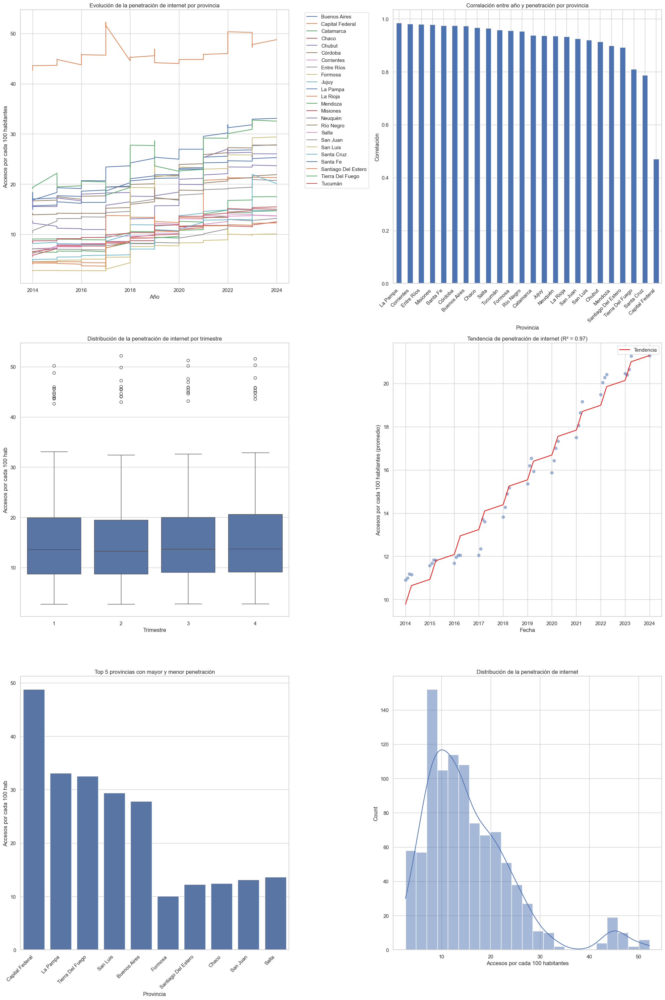

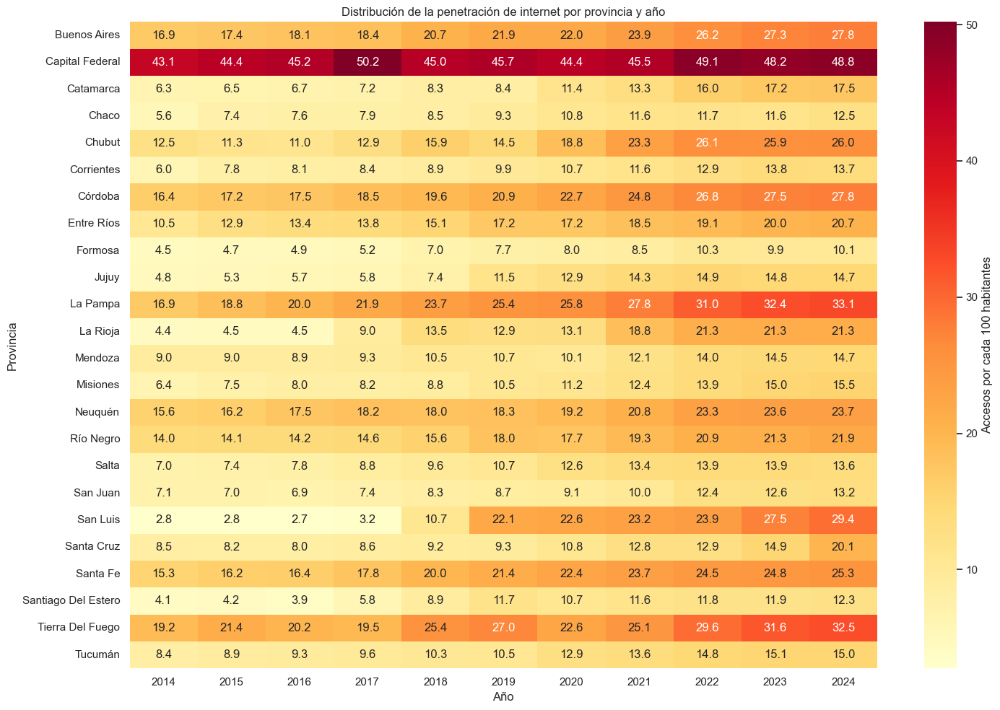

In [51]:


# Configuración general de la figura
plt.figure(figsize=(20, 30))

# 1. Evolución de la penetración de internet por provincia y año
plt.subplot(3, 2, 1)
for provincia in h7['Provincia'].unique():
    data = h7[h7['Provincia'] == provincia]
    plt.plot(data['Año'], data['Accesos por cada 100 hab'], label=provincia)
plt.title('Evolución de la penetración de internet por provincia')
plt.xlabel('Año')
plt.ylabel('Accesos por cada 100 habitantes')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# 2. Correlación entre año y penetración para cada provincia (en una figura separada)
plt.subplot(3, 2, 2)
correlations = h7.groupby('Provincia').apply(lambda x: x['Año'].corr(x['Accesos por cada 100 hab']))
correlations = correlations.sort_values(ascending=False)
correlations.plot(kind='bar')
plt.title('Correlación entre año y penetración por provincia')
plt.xlabel('Provincia')
plt.ylabel('Correlación')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()



# 3. Comparación de penetración por trimestres
plt.subplot(3, 2, 3)
sns.boxplot(x='Trimestre', y='Accesos por cada 100 hab', data=h7)
plt.title('Distribución de la penetración de internet por trimestre')

# 4. Análisis de tendencias
plt.subplot(3, 2, 4)
h7['Fecha'] = pd.to_datetime(h7['Año'].astype(str) + '-' + h7['Trimestre'].astype(str) + '-01')
h7 = h7.sort_values('Fecha')
h7_mean = h7.groupby('Fecha')['Accesos por cada 100 hab'].mean().reset_index()
slope, intercept, r_value, p_value, std_err = stats.linregress(range(len(h7_mean)), h7_mean['Accesos por cada 100 hab'])
plt.scatter(h7_mean['Fecha'], h7_mean['Accesos por cada 100 hab'], alpha=0.5)
plt.plot(h7_mean['Fecha'], intercept + slope * range(len(h7_mean)), color='red', label='Tendencia')
plt.title(f'Tendencia de penetración de internet (R² = {r_value**2:.2f})')
plt.xlabel('Fecha')
plt.ylabel('Accesos por cada 100 habitantes (promedio)')
plt.legend()

# 5. Top 5 provincias con mayor y menor penetración al final del período
plt.subplot(3, 2, 5)
ultimo_periodo = h7[h7['Fecha'] == h7['Fecha'].max()]
top_5 = ultimo_periodo.nlargest(5, 'Accesos por cada 100 hab')
bottom_5 = ultimo_periodo.nsmallest(5, 'Accesos por cada 100 hab')
sns.barplot(x='Provincia', y='Accesos por cada 100 hab', data=pd.concat([top_5, bottom_5]))
plt.title('Top 5 provincias con mayor y menor penetración')
plt.xticks(rotation=45, ha='right')

# 6. Distribución de la penetración
plt.subplot(3, 2, 6)
sns.histplot(h7['Accesos por cada 100 hab'], kde=True)
plt.title('Distribución de la penetración de internet')
plt.xlabel('Accesos por cada 100 habitantes')

# Ajustar el layout
plt.tight_layout()

# Mostrar la figura
plt.show()


# 7. Mapa de calor de la distribución de penetración por provincia y año

# Usamos groupby para manejar las entradas duplicadas
pivot_data = h7.groupby(['Provincia', 'Año'])['Accesos por cada 100 hab'].mean().unstack()
plt.figure(figsize=(15, 10))
sns.heatmap(pivot_data, cmap='YlOrRd', annot=True, fmt='.1f', cbar_kws={'label': 'Accesos por cada 100 habitantes'})
plt.title('Distribución de la penetración de internet por provincia y año')
plt.tight_layout()
plt.show()

**Conclusiones**


Crecimiento Generalizado: Se observa un aumento sostenido en la penetración de internet a nivel nacional, destacando un crecimiento robusto en la mayoría de las provincias. Esto refleja los esfuerzos exitosos para aumentar el acceso a internet en diversas regiones.

1. Variabilidad Regional: Hay diferencias notables en la penetración de internet entre diferentes provincias. Mientras algunas, como Buenos Aires y la Capital Federal, muestran altas tasas de penetración, otras como San Luis y Formosa evidencian un crecimiento más lento y menor penetración, lo que sugiere la necesidad de políticas dirigidas específicamente a estas áreas.

2. Disparidades en el Crecimiento: Algunas provincias experimentaron un crecimiento explosivo en ciertos periodos, como La Pampa y Tierra del Fuego, posiblemente debido a políticas específicas de mejora de infraestructura o programas gubernamentales de acceso.

3. Consistencia en la Capital Federal: La Capital Federal presenta un aumento constante y sostenido, lo cual es indicativo de una infraestructura bien desarrollada y mantenida, reflejando la concentración de recursos y esfuerzos en áreas urbanas densamente pobladas.

4. Relaciones Estables: El análisis de correlación muestra una relación estable y fuerte entre el año y la penetración de internet en todas las provincias, subrayando una tendencia general hacia una mejor conectividad con el tiempo.

5. Evidencia de Cambios Sustanciales: La distribución de la penetración de internet por trimestre sugiere que no hay variaciones significativas a lo largo del año, indicando que el acceso a internet no está fuertemente influenciado por factores estacionales.

6. Impacto en la Planificación: Las tendencias observadas pueden ayudar a los planificadores y políticos a identificar áreas de enfoque para futuras inversiones y mejoras, garantizando que los esfuerzos para aumentar la penetración de internet se dirijan eficazmente hacia las regiones que más lo necesitan.

**Conclusión General:**

Los análisis proporcionan una comprensión clara de cómo la penetración de internet ha evolucionado a lo largo del tiempo en diversas regiones, y subrayan la importancia de continuar con esfuerzos dirigidos para asegurar que todas las provincias puedan beneficiarse de la conectividad digital. Esto es crucial para una estrategia nacional de inclusión digital que no solo busque aumentar la cobertura, sino también equilibrar las disparidades regionales.

### **1.8 EDA Accesos Por Tecnología**

**Descripción de la Hoja:**

La hoja "Accesos Por Tecnología" ofrece información detallada sobre los accesos a internet categorizados por tipo de tecnología en diferentes provincias. Estos datos están segmentados por año y trimestre, permitiendo analizar cómo varía la adopción de las diferentes tecnologías de internet en el tiempo y en distintas localidades.

**Columnas:**

Año (object): Representa el año al que corresponden los datos, aunque está tipificado como objeto y debería ser convertido a entero.

Trimestre (object): Indica el trimestre del año, tipificado como objeto y también requiere conversión a entero.

Provincia (object): Nombre de la provincia donde se registran los accesos.

ADSL, Cablemodem, Fibra óptica, Wireless, Otros (float64): Representan los diferentes tipos de tecnología de acceso a internet, con el número de accesos reportados para cada uno.

Total (float64): Sumatoria de todos los accesos por tecnología en una provincia específica durante un trimestre dado.
Objetivos del EDA:

**El análisis exploratorio de datos tiene como objetivos principales:**

- Determinar la evolución de los distintos tipos de tecnología de internet en términos de número de accesos.

- Identificar las provincias con mayor y menor adopción de cada tecnología.

- Examinar las tendencias de crecimiento o decrecimiento para cada tipo de tecnología a lo largo del tiempo.

**Metodología y Procesos:**

Para abordar este EDA, se seguirán los siguientes pasos:

- Conversión y Limpieza de Datos: Convertir las columnas 'Año' y 'Trimestre' a formato numérico y manejar posibles valores nulos o erróneos.

- Análisis Descriptivo: Aplicar estadísticas descriptivas para entender la distribución y principales características de los datos.

**Visualización de Datos:**

- Graficar la evolución de los accesos a internet por tecnología y por provincia.
- Crear gráficos de barras para comparar la penetración de cada tecnología en diferentes provincias.
- Utilizar mapas de calor para visualizar la distribución temporal y geográfica de las tecnologías.
- Análisis de Tendencias: Utilizar métodos de regresión o series temporales para identificar y modelar las tendencias observadas.

**Conclusiones Esperadas:**

Se anticipa que el análisis revelará:

Predominancia Tecnológica: Cuáles tecnologías dominan el mercado de acceso a internet y cómo ha cambiado esto con el tiempo.
Desigualdades Regionales: Diferencias significativas en la adopción tecnológica entre provincias, lo que podría sugerir áreas para intervención gubernamental o comercial.
Recomendaciones Estratégicas: Basándose en los resultados, se podrán formular estrategias para promover tecnologías específicas en áreas con baja penetración o para actualizar infraestructuras obsoletas.

In [52]:
# Leer la hoja "Accesos Por Tecnología"
h8 = df.parse('Accesos Por Tecnología')

#Ver h8
h8

,Año,Trimestre,Provincia,ADSL,Cablemodem,Fibra óptica,Wireless,Otros,Total
0,2024,1,Buenos Aires,203297.0,2790663.0,1799013.0,150290.0,101294.0,5044557.0
1,2024,1,Capital Federal,70108.0,1177475.0,203756.0,4493.0,48879.0,1504711.0
2,2024,1,Catamarca,5901.0,11025.0,56542.0,1384.0,81.0,74933.0
3,2024,1,Chaco,11343.0,58929.0,64463.0,8404.0,12404.0,155543.0
4,2024,1,Chubut,26306.0,77217.0,26356.0,30867.0,9930.0,170676.0
...,...,...,...,...,...,...,...,...,...
981,2014,1,Santiago Del Estero,32567.0,3598.0,19.0,915.0,34.0,37133.0
982,2014,1,Tierra Del Fuego,21618.0,2837.0,648.0,1.0,2934.0,28038.0
983,2014,1,Tucumán,129717.0,83.0,121.0,13.0,98.0,130032.0
984,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [53]:
# Obtener la forma de la hoja (número de filas y columnas)
print(h8.shape)
# Obtener los nombres de las columnas
print(h8.columns)

# Obtener los tipos de datos de cada columna
print(h8.dtypes)

#Head del dataframe 

print(h8.head(1))

(986, 9)
Index(['Año', 'Trimestre', 'Provincia', 'ADSL', 'Cablemodem', 'Fibra óptica',
       'Wireless', 'Otros', 'Total'],
      dtype='object')
Año              object
Trimestre        object
Provincia        object
ADSL            float64
Cablemodem      float64
Fibra óptica    float64
Wireless        float64
Otros           float64
Total           float64
dtype: object
    Año Trimestre     Provincia      ADSL  Cablemodem  Fibra óptica  Wireless  \
0  2024         1  Buenos Aires  203297.0   2790663.0     1799013.0  150290.0   

      Otros      Total  
0  101294.0  5044557.0  


In [54]:
print(h8.head(1))

    Año Trimestre     Provincia      ADSL  Cablemodem  Fibra óptica  Wireless  \
0  2024         1  Buenos Aires  203297.0   2790663.0     1799013.0  150290.0   

      Otros      Total  
0  101294.0  5044557.0  


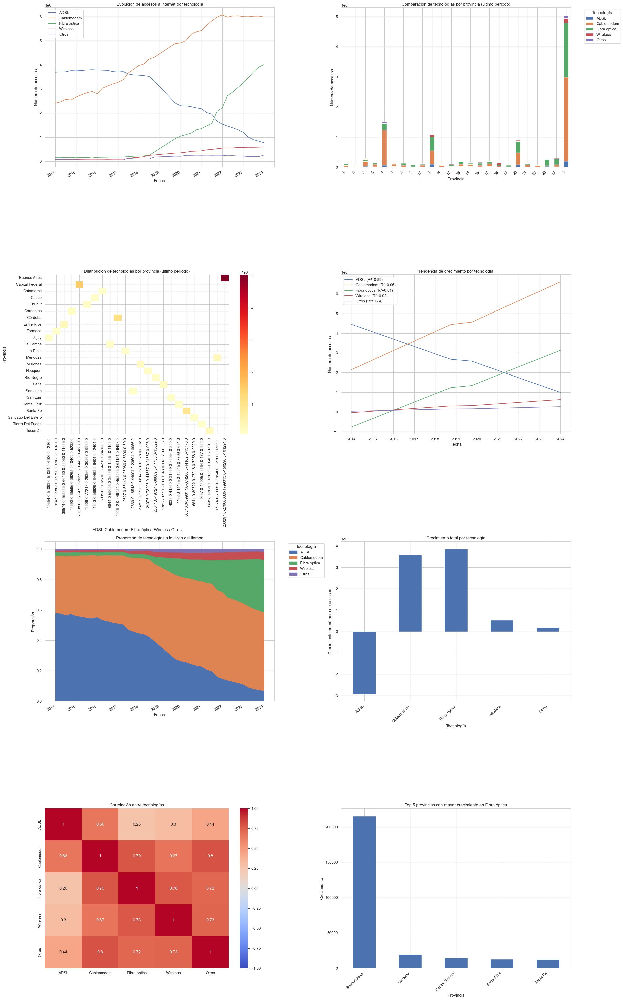

In [55]:




# Limpiar los datos de 'Año' y 'Trimestre'
h8['Año'] = h8['Año'].astype(str).str.strip()
h8['Trimestre'] = h8['Trimestre'].astype(str).str.strip()

# Crear un diccionario para mapear trimestres a meses
trimestre_a_mes = {'1': '01', '2': '04', '3': '07', '4': '10'}

# Ahora creamos la columna 'Fecha'
h8['Fecha'] = pd.to_datetime(h8['Año'] + '-' + h8['Trimestre'].map(trimestre_a_mes) + '-01', format='%Y-%m-%d')
h8 = h8.sort_values('Fecha')

# Definir las tecnologías
tecnologias = ['ADSL', 'Cablemodem', 'Fibra óptica', 'Wireless', 'Otros']

# Crear una figura con subplots
fig = plt.figure(figsize=(25, 40))

# 1. Evolución de los accesos a internet por tecnología (total)
ax1 = fig.add_subplot(4, 2, 1)
for tech in tecnologias:
    h8.groupby('Fecha')[tech].sum().plot(ax=ax1, label=tech)
ax1.set_title('Evolución de accesos a internet por tecnología')
ax1.set_xlabel('Fecha')
ax1.set_ylabel('Número de accesos')
ax1.legend()

# 2. Comparación de tecnologías por provincia (último período)
ax2 = fig.add_subplot(4, 2, 2)
ultimo_periodo = h8[h8['Fecha'] == h8['Fecha'].max()]
ultimo_periodo[tecnologias].plot(kind='bar', stacked=True, ax=ax2)
ax2.set_title('Comparación de tecnologías por provincia (último período)')
ax2.set_xlabel('Provincia')
ax2.set_ylabel('Número de accesos')
ax2.legend(title='Tecnología', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.setp(ax2.xaxis.get_majorticklabels(), rotation=45, ha='right')

# 3. Mapa de calor de la distribución de tecnologías por provincia (último período)
ax3 = fig.add_subplot(4, 2, 3)
pivot_data = ultimo_periodo.pivot(index='Provincia', columns=tecnologias, values='Total')
sns.heatmap(pivot_data, cmap='YlOrRd', ax=ax3)
ax3.set_title('Distribución de tecnologías por provincia (último período)')

# 4. Tendencia de crecimiento por tecnología
ax4 = fig.add_subplot(4, 2, 4)
fechas_unicas = h8['Fecha'].unique()
for tech in tecnologias:
    tech_data = h8.groupby('Fecha')[tech].sum()
    # Asegúrate de que tech_data tiene el mismo número de elementos que fechas_unicas
    tech_data = tech_data.reindex(fechas_unicas)
    
    # Usa fechas_unicas.astype(int) como x para la regresión
    x = range(len(fechas_unicas))
    y = tech_data.values
    
    # Elimina los valores NaN si los hay
    mask = ~np.isnan(y)
    x = np.array(x)[mask]
    y = y[mask]
    
    if len(x) > 0:  # Asegúrate de que hay datos para graficar
        slope, intercept, r_value, p_value, std_err = stats.linregress(x, y)
        ax4.plot(fechas_unicas, intercept + slope * np.array(range(len(fechas_unicas))), 
                 label=f'{tech} (R²={r_value**2:.2f})')

ax4.set_title('Tendencia de crecimiento por tecnología')
ax4.set_xlabel('Fecha')
ax4.set_ylabel('Número de accesos')
ax4.legend()

# 5. Proporción de tecnologías a lo largo del tiempo
ax5 = fig.add_subplot(4, 2, 5)
prop_data = h8.groupby('Fecha')[tecnologias].sum()
prop_data = prop_data.div(prop_data.sum(axis=1), axis=0)
prop_data.plot(kind='area', stacked=True, ax=ax5)
ax5.set_title('Proporción de tecnologías a lo largo del tiempo')
ax5.set_xlabel('Fecha')
ax5.set_ylabel('Proporción')
ax5.legend(title='Tecnología', bbox_to_anchor=(1.05, 1), loc='upper left')

# 6. Crecimiento total por tecnología
ax6 = fig.add_subplot(4, 2, 6)
crecimiento = h8.groupby('Fecha')[tecnologias].sum().iloc[-1] - h8.groupby('Fecha')[tecnologias].sum().iloc[0]
crecimiento.plot(kind='bar', ax=ax6)
ax6.set_title('Crecimiento total por tecnología')
ax6.set_xlabel('Tecnología')
ax6.set_ylabel('Crecimiento en número de accesos')
plt.setp(ax6.xaxis.get_majorticklabels(), rotation=45, ha='right')

# 7. Análisis de correlación entre tecnologías
ax7 = fig.add_subplot(4, 2, 7)
correlation_matrix = h8[tecnologias].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1, center=0, ax=ax7)
ax7.set_title('Correlación entre tecnologías')

# 8. Top 5 provincias con mayor crecimiento en Fibra óptica (como ejemplo)
ax8 = fig.add_subplot(4, 2, 8)
crecimiento_prov = h8.groupby('Provincia')['Fibra óptica'].last() - h8.groupby('Provincia')['Fibra óptica'].first()
crecimiento_prov.nlargest(5).plot(kind='bar', ax=ax8)
ax8.set_title('Top 5 provincias con mayor crecimiento en Fibra óptica')
ax8.set_ylabel('Crecimiento')
plt.setp(ax8.xaxis.get_majorticklabels(), rotation=45, ha='right')

plt.tight_layout()
plt.show()

**Conclusiones:**


1. Cambio en Tecnologías Predominantes: Se observa una evolución significativa en las tecnologías de acceso a internet. La fibra óptica muestra un aumento constante y sostenido, convirtiéndose en la tecnología dominante en los últimos años. Por otro lado, el ADSL muestra un declive pronunciado, indicativo de la obsolescencia de tecnologías más antiguas en favor de opciones más rápidas y fiables.

2. Variabilidad por Provincia: Existe una notable variabilidad en la adopción de tecnologías por provincia, como se observa en el mapa de calor y las barras comparativas. Algunas provincias lideran en la adopción de tecnologías modernas como la fibra óptica, mientras que otras aún tienen una mezcla más diversa de tecnologías.

3. Crecimiento Tecnológico: Los gráficos de tendencias muestran claramente cómo la fibra óptica ha superado otras tecnologías en términos de crecimiento a lo largo de los años, con el cablemodem y wireless mostrando patrones de crecimiento y declive menos dramáticos.

4. Correlación entre Tecnologías: La matriz de correlación indica relaciones entre las diferentes tecnologías de acceso a internet. Por ejemplo, podría haber una correlación negativa entre ADSL y fibra óptica, lo que sugiere que el aumento de una está directamente relacionado con el declive de la otra.

5. Impacto Regional: Los gráficos específicos por provincia indican que algunas regiones han adoptado rápidamente la fibra óptica, mientras que otras mantienen una dependencia de tecnologías más antiguas. Esto puede reflejar diferencias en la inversión en infraestructura tecnológica o en las prioridades políticas regionales.

6. Crecimiento Total por Tecnología: El análisis de crecimiento total revela que la fibra óptica no solo es popular en términos de adopción nueva, sino que también ha visto el mayor crecimiento en términos absolutos, contrastando con el estancamiento o declive de tecnologías como ADSL y otros métodos menos comunes.

**Conclusión General:**

El análisis muestra una clara transición hacia tecnologías de internet más avanzadas y eficientes, con la fibra óptica liderando esta transformación. La adaptación tecnológica varía significativamente entre provincias, lo que podría requerir políticas específicas para igualar el acceso a tecnologías de alta velocidad en todas las regiones. Estos datos son cruciales para los responsables de la formulación de políticas y los proveedores de servicios para dirigir inversiones y estrategias de desarrollo tecnológico de manera eficaz.

### **1.9 EDA Penetracion-hogares**

**Descripción de la Hoja:**

La hoja "Penetracion-hogares" contiene información sobre la penetración de internet en los hogares a nivel provincial, desglosada por año y trimestre. Esta hoja permite observar cómo varía el acceso a internet en los hogares en diferentes regiones y periodos de tiempo.

**Columnas:**

- Año (int64): Indica el año al que corresponden los datos.

- Trimestre (int64): Muestra el trimestre del año para el dato correspondiente.

- Provincia (object): Denota la provincia donde se ha medido la penetración de internet.

- Accesos por cada 100 hogares (float64): Representa el porcentaje de hogares que tienen acceso a internet por cada 100 hogares en la provincia especificada.

**Objetivos del EDA:**

El análisis exploratorio de datos tiene como metas principales:

Analizar la evolución de la penetración de internet en hogares a lo largo del tiempo y entre diferentes provincias.
Identificar patrones o tendencias en la adopción de internet en los hogares, destacando las áreas con mayor y menor penetración.
Explorar la relación entre la penetración de internet y factores como la ubicación geográfica y el tiempo.

**Metodología y Procesos:**
El EDA se llevará a cabo siguiendo estos pasos:

Conversión y Limpieza de Datos: Asegurarse de que todos los datos estén en el formato correcto y gestionar cualquier dato ausente o incorrecto.
Análisis Descriptivo: Utilizar estadísticas descriptivas para comprender las características fundamentales de los datos.
Visualización de Datos:
Crear gráficos de líneas o barras para mostrar la tendencia de la penetración de internet en hogares a lo largo de los años.
Utilizar mapas de calor o gráficos geográficos para visualizar la penetración por provincia.
Analizar la estacionalidad de los datos con gráficos por trimestre.
Análisis Comparativo: Comparar la penetración de internet en diferentes provincias y examinar las variaciones a lo largo del tiempo.


**Conclusiones Esperadas:**
Se espera que el análisis revele:

Tendencias Temporales: Cómo la penetración de internet en los hogares ha evolucionado a lo largo de los años.
Variaciones Regionales: Diferencias claras en la penetración de internet entre diferentes provincias, lo que podría sugerir áreas de enfoque para políticas de infraestructura digital.
Insights Estratégicos: Basado en los resultados, proporcionar recomendaciones para mejorar la conectividad y accesibilidad a internet en regiones con baja penetración.

In [56]:
# Leer la hoja "Penetracion-hogares"
h9 = df.parse('Penetracion-hogares')

#Ver h8
h9

,Año,Trimestre,Provincia,Accesos por cada 100 hogares
0,2024,1,Buenos Aires,81.100000
1,2024,1,Capital Federal,119.530000
2,2024,1,Catamarca,68.820000
3,2024,1,Chaco,46.700000
4,2024,1,Chubut,84.890000
...,...,...,...,...
979,2014,1,Santa Cruz,28.939093
980,2014,1,Santa Fe,47.847663
981,2014,1,Santiago Del Estero,16.309924
982,2014,1,Tierra Del Fuego,63.965926


In [57]:
# Obtener la forma de la hoja (número de filas y columnas)
print(h9.shape)
# Obtener los nombres de las columnas
print(h9.columns)

# Obtener los tipos de datos de cada columna
print(h9.dtypes)

#Head del dataframe 

print(h9.head(1))

(984, 4)
Index(['Año', 'Trimestre', 'Provincia', 'Accesos por cada 100 hogares'], dtype='object')
Año                               int64
Trimestre                         int64
Provincia                        object
Accesos por cada 100 hogares    float64
dtype: object
    Año  Trimestre     Provincia  Accesos por cada 100 hogares
0  2024          1  Buenos Aires                          81.1


/var/folders/56/ng1477v167b0_8l7x8rdnw_r0000gn/T/ipykernel_87221/2890837083.py:16: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  correlations = h9.groupby('Provincia').apply(lambda x: x['Año'].corr(x['Accesos por cada 100 hogares']))


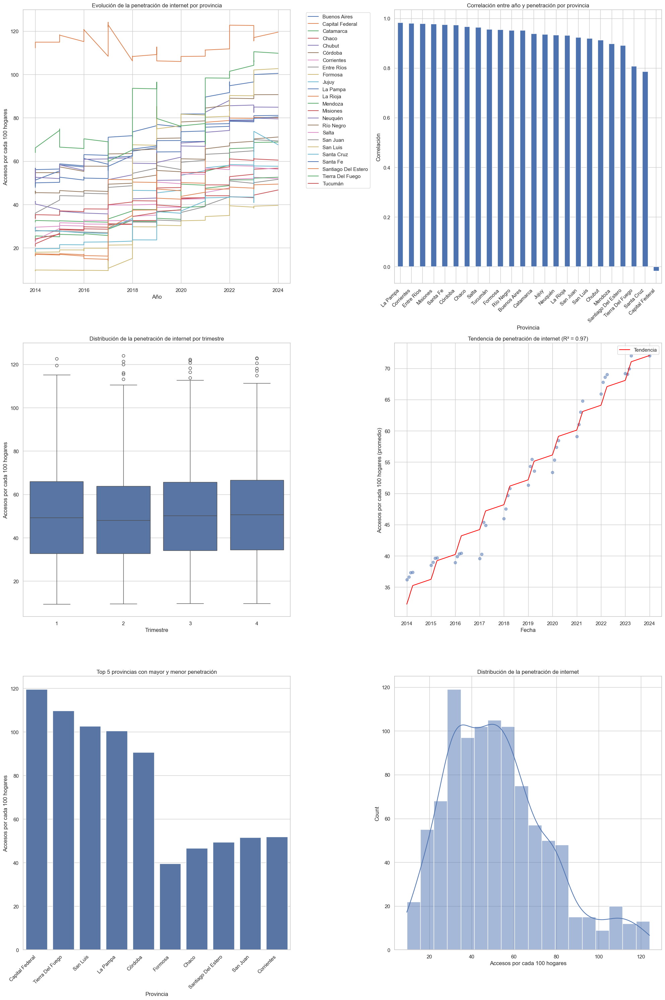

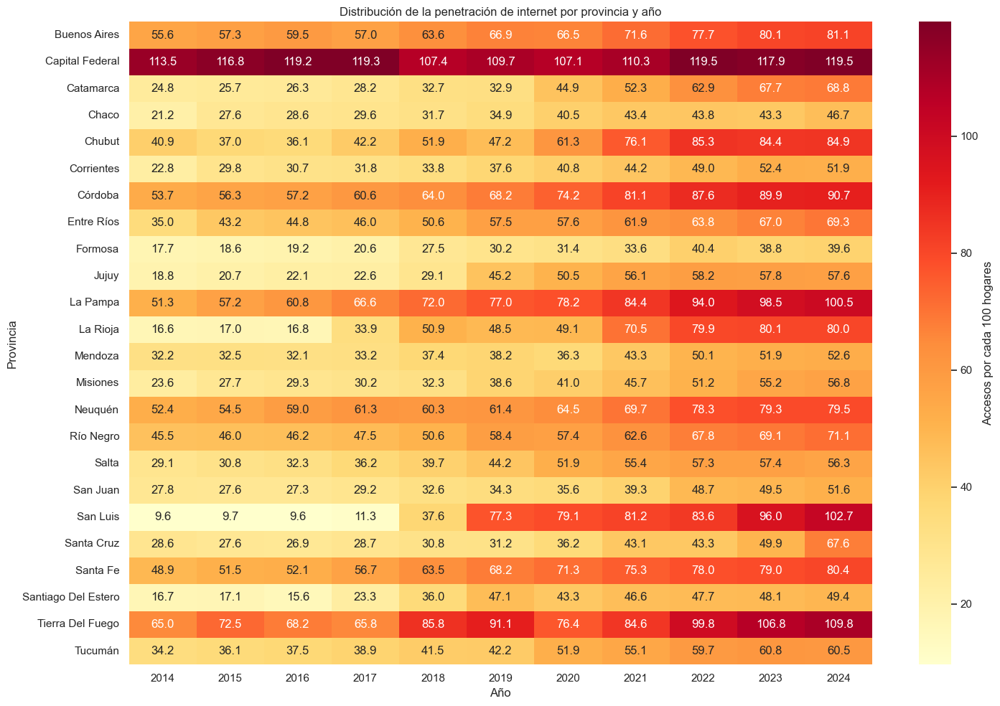

In [58]:


# Configuración general de la figura
plt.figure(figsize=(20, 30))

# 1. Evolución de la penetración de internet por provincia y año
plt.subplot(3, 2, 1)
for provincia in h9['Provincia'].unique():
    data = h9[h9['Provincia'] == provincia]
    plt.plot(data['Año'], data['Accesos por cada 100 hogares'], label=provincia)
plt.title('Evolución de la penetración de internet por provincia')
plt.xlabel('Año')
plt.ylabel('Accesos por cada 100 hogares')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# 2. Correlación entre año y penetración para cada provincia (en una figura separada)
plt.subplot(3, 2, 2)
correlations = h9.groupby('Provincia').apply(lambda x: x['Año'].corr(x['Accesos por cada 100 hogares']))
correlations = correlations.sort_values(ascending=False)
correlations.plot(kind='bar')
plt.title('Correlación entre año y penetración por provincia')
plt.xlabel('Provincia')
plt.ylabel('Correlación')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()



# 3. Comparación de penetración por trimestres
plt.subplot(3, 2, 3)
sns.boxplot(x='Trimestre', y='Accesos por cada 100 hogares', data=h9)
plt.title('Distribución de la penetración de internet por trimestre')

# 4. Análisis de tendencias
plt.subplot(3, 2, 4)
h9['Fecha'] = pd.to_datetime(h7['Año'].astype(str) + '-' + h9['Trimestre'].astype(str) + '-01')
h9 = h9.sort_values('Fecha')
h9_mean = h9.groupby('Fecha')['Accesos por cada 100 hogares'].mean().reset_index()
slope, intercept, r_value, p_value, std_err = stats.linregress(range(len(h9_mean)), h9_mean['Accesos por cada 100 hogares'])
plt.scatter(h9_mean['Fecha'], h9_mean['Accesos por cada 100 hogares'], alpha=0.5)
plt.plot(h9_mean['Fecha'], intercept + slope * range(len(h9_mean)), color='red', label='Tendencia')
plt.title(f'Tendencia de penetración de internet (R² = {r_value**2:.2f})')
plt.xlabel('Fecha')
plt.ylabel('Accesos por cada 100 hogares (promedio)')
plt.legend()

# 5. Top 5 provincias con mayor y menor penetración al final del período
plt.subplot(3, 2, 5)
ultimo_periodo = h9[h9['Fecha'] == h9['Fecha'].max()]
top_5 = ultimo_periodo.nlargest(5, 'Accesos por cada 100 hogares')
bottom_5 = ultimo_periodo.nsmallest(5, 'Accesos por cada 100 hogares')
sns.barplot(x='Provincia', y='Accesos por cada 100 hogares', data=pd.concat([top_5, bottom_5]))
plt.title('Top 5 provincias con mayor y menor penetración')
plt.xticks(rotation=45, ha='right')

# 6. Distribución de la penetración
plt.subplot(3, 2, 6)
sns.histplot(h9['Accesos por cada 100 hogares'], kde=True)
plt.title('Distribución de la penetración de internet')
plt.xlabel('Accesos por cada 100 hogares')

# Ajustar el layout
plt.tight_layout()

# Mostrar la figura
plt.show()


# 7. Mapa de calor de la distribución de penetración por provincia y año

# Usamos groupby para manejar las entradas duplicadas
pivot_data = h9.groupby(['Provincia', 'Año'])['Accesos por cada 100 hogares'].mean().unstack()
plt.figure(figsize=(15, 10))
sns.heatmap(pivot_data, cmap='YlOrRd', annot=True, fmt='.1f', cbar_kws={'label': 'Accesos por cada 100 hogares'})
plt.title('Distribución de la penetración de internet por provincia y año')
plt.tight_layout()
plt.show()

**Conclusiones**


1. Tendencia al alza: La penetración de internet en los hogares argentinos ha mostrado un crecimiento sostenido a lo largo del tiempo, aunque con variaciones significativas entre provincias.

2. Desigualdad regional: Existe una marcada desigualdad en la distribución de la penetración de internet, con provincias que presentan tasas muy superiores a otras.

3. Factores influyentes: La penetración de internet está influenciada por diversos factores, como políticas públicas, infraestructura, nivel socioeconómico, factores geográficos y, más recientemente, eventos como la pandemia de COVID-19.

4. Heterogeneidad en la evolución: Las provincias presentan trayectorias evolutivas distintas, con algunas experimentando un crecimiento acelerado y otras mostrando un progreso más lento.

5. Potencial de crecimiento: A pesar de los avances logrados, aún existe un margen significativo para aumentar la penetración de internet en algunas regiones, especialmente en aquellas con menores tasas de conectividad.


### **1.10 EDA Penetracion-totales**

**Descripción de la Hoja:**

La hoja "Accesos Por Tecnología" proporciona datos detallados sobre los accesos a internet, representados como accesos por cada 100 hogares y por cada 100 habitantes, a lo largo de varios años y trimestres. Estos datos están categorizados por periodo específico, lo que permite analizar la evolución temporal del acceso a internet en términos de hogares y población individual.

**Objetivos del EDA:**

- Analizar Tendencias Temporales: Determinar cómo han evolucionado los accesos a internet tanto por hogar como por persona a lo largo del tiempo.

- Comparar Accesos por Hogares vs. por Habitantes: Explorar las diferencias en los niveles de acceso cuando se considera la base de hogares frente a la base per cápita.

- Identificar Patrones Estacionales: Investigar si existen patrones estacionales en el acceso a internet, observando las variaciones trimestrales.

- Preparar Datos para Análisis Futuros: Limpiar y preparar los datos para análisis más profundos o modelos predictivos que podrían ayudar a anticipar tendencias futuras.

**Metodología y Procesos:**


Análisis Descriptivo: Utilizar estadísticas descriptivas para entender las distribuciones básicas y las medidas de tendencia central de los datos.

Visualización de Datos: Crear gráficos de líneas para analizar las tendencias a lo largo del tiempo y gráficos de caja para observar la dispersión y los outliers trimestrales.

Análisis Temporal: Descomponer los datos por año y trimestre para identificar patrones estacionales o cambios significativos a lo largo de los años.

Correlación y Comparación: Evaluar la correlación entre los accesos por cada 100 hogares y por cada 100 habitantes para entender la relación entre estas dos métricas.

**Conclusiones Esperadas:**

Evolución de Accesos: Se espera identificar una tendencia clara de crecimiento o declive en el acceso a internet en ambos términos de hogares y habitantes.
Diferencias Significativas: Podrían destacarse diferencias significativas entre los accesos contabilizados por hogares en comparación con los contabilizados por habitantes, reflejando posibles discrepancias en la cobertura de internet.
Patrones Estacionales: Es posible descubrir patrones estacionales que podrían informar sobre fluctuaciones en el acceso debido a factores económicos, políticos o sociales.
Insights para Políticas: Las conclusiones del EDA podrían ofrecer insights valiosos para los formuladores de políticas y los proveedores de servicios para mejorar la infraestructura y el acceso a internet.


In [59]:
# Leer la hoja "Penetracion-totales"
h10 = df.parse('Penetracion-totales')

#Ver h10

h10

,Año,Trimestre,Accesos por cada 100 hogares,Accesos por cada 100 hab,Periodo
0,2024,1,78.890000,24.790000,Ene-Mar 2024
1,2023,4,78.560000,24.660000,Oct-Dic 2023
2,2023,3,77.840000,24.410000,Jul-Sept 2023
3,2023,2,77.020000,24.140000,Abr-Jun 2023
4,2023,1,77.200000,24.170000,Ene-Mar 2023
5,2022,4,77.210000,24.150000,Oct-Dic 2022
6,2022,3,76.640000,23.950000,Jul-Sept 2022
7,2022,2,75.965424,23.720442,Abr-Jun 2022
8,2022,1,73.878803,23.049171,Ene-Mar 2022
9,2021,4,73.176397,22.810702,Oct-Dic 2021


In [60]:
# Obtener la forma de la hoja (número de filas y columnas)
print(h10.shape)
# Obtener los nombres de las columnas
print(h10.columns)

# Obtener los tipos de datos de cada columna
print(h10.dtypes)

#Head del dataframe 

print(h10.head(1))

(41, 5)
Index(['Año', 'Trimestre', 'Accesos por cada 100 hogares',
       'Accesos por cada 100 hab', 'Periodo'],
      dtype='object')
Año                               int64
Trimestre                         int64
Accesos por cada 100 hogares    float64
Accesos por cada 100 hab        float64
Periodo                          object
dtype: object
    Año  Trimestre  Accesos por cada 100 hogares  Accesos por cada 100 hab  \
0  2024          1                         78.89                     24.79   

        Periodo  
0  Ene-Mar 2024  


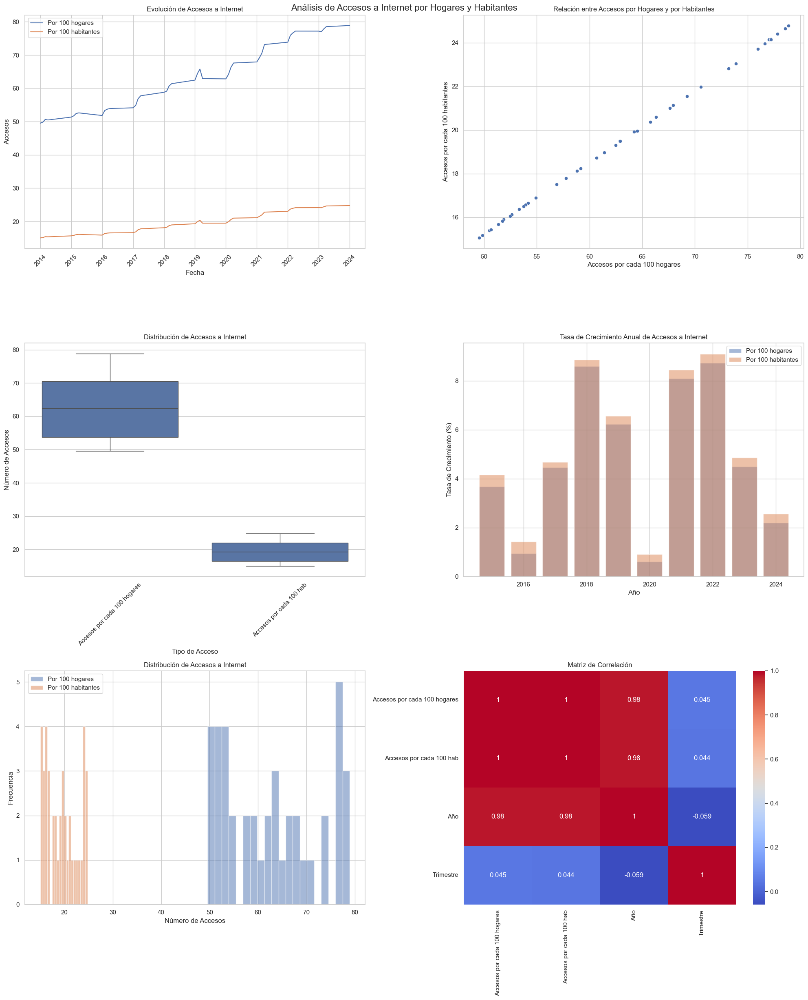


Estadísticas descriptivas:
       Accesos por cada 100 hogares  Accesos por cada 100 hab
count                     41.000000                 41.000000
mean                      62.837711                 19.452761
std                        9.786571                  3.211263
min                       49.545821                 15.050104
25%                       53.734186                 16.504676
50%                       62.479166                 19.307907
75%                       70.578853                 21.982550
max                       78.890000                 24.790000

Correlación entre accesos por hogares y por habitantes: 1.00


In [61]:



# Intentamos convertir 'Año' y 'Trimestre' a datetime con un formato más flexible
h10['Fecha'] = pd.to_datetime(h10['Año'].astype(str) + '-' + h10['Trimestre'].astype(str), format='mixed')

# Crear una figura con subplots
fig, axs = plt.subplots(3, 2, figsize=(20, 25))
fig.suptitle('Análisis de Accesos a Internet por Hogares y Habitantes', fontsize=16)

# 1. Gráfico de líneas para comparar accesos por hogares y habitantes
axs[0, 0].plot(h10['Fecha'], h10['Accesos por cada 100 hogares'], label='Por 100 hogares')
axs[0, 0].plot(h10['Fecha'], h10['Accesos por cada 100 hab'], label='Por 100 habitantes')
axs[0, 0].set_title('Evolución de Accesos a Internet')
axs[0, 0].set_xlabel('Fecha')
axs[0, 0].set_ylabel('Accesos')
axs[0, 0].legend()
axs[0, 0].grid(True)
axs[0, 0].tick_params(axis='x', rotation=45)

# 2. Gráfico de dispersión
sns.scatterplot(x='Accesos por cada 100 hogares', y='Accesos por cada 100 hab', data=h10, ax=axs[0, 1])
axs[0, 1].set_title('Relación entre Accesos por Hogares y por Habitantes')
axs[0, 1].set_xlabel('Accesos por cada 100 hogares')
axs[0, 1].set_ylabel('Accesos por cada 100 habitantes')

# 3. Boxplot para comparar la distribución
h10_melted = h10.melt(id_vars=['Fecha'], value_vars=['Accesos por cada 100 hogares', 'Accesos por cada 100 hab'])
sns.boxplot(x='variable', y='value', data=h10_melted, ax=axs[1, 0])
axs[1, 0].set_title('Distribución de Accesos a Internet')
axs[1, 0].set_xlabel('Tipo de Acceso')
axs[1, 0].set_ylabel('Número de Accesos')
axs[1, 0].tick_params(axis='x', rotation=45)

# 4. Tasa de crecimiento anual
h10['Año'] = h10['Fecha'].dt.year
crecimiento_hogares = h10.groupby('Año')['Accesos por cada 100 hogares'].last().pct_change() * 100
crecimiento_hab = h10.groupby('Año')['Accesos por cada 100 hab'].last().pct_change() * 100
axs[1, 1].bar(crecimiento_hogares.index, crecimiento_hogares.values, alpha=0.5, label='Por 100 hogares')
axs[1, 1].bar(crecimiento_hab.index, crecimiento_hab.values, alpha=0.5, label='Por 100 habitantes')
axs[1, 1].set_title('Tasa de Crecimiento Anual de Accesos a Internet')
axs[1, 1].set_xlabel('Año')
axs[1, 1].set_ylabel('Tasa de Crecimiento (%)')
axs[1, 1].legend()
axs[1, 1].grid(True)

# 5. Histograma de distribución
axs[2, 0].hist(h10['Accesos por cada 100 hogares'], bins=20, alpha=0.5, label='Por 100 hogares')
axs[2, 0].hist(h10['Accesos por cada 100 hab'], bins=20, alpha=0.5, label='Por 100 habitantes')
axs[2, 0].set_title('Distribución de Accesos a Internet')
axs[2, 0].set_xlabel('Número de Accesos')
axs[2, 0].set_ylabel('Frecuencia')
axs[2, 0].legend()

# 6. Heatmap de correlación
corr_matrix = h10[['Accesos por cada 100 hogares', 'Accesos por cada 100 hab', 'Año', 'Trimestre']].corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', ax=axs[2, 1])
axs[2, 1].set_title('Matriz de Correlación')

plt.tight_layout()
plt.show()

# Imprimir estadísticas descriptivas
print("\nEstadísticas descriptivas:")
print(h10[['Accesos por cada 100 hogares', 'Accesos por cada 100 hab']].describe())

# Imprimir correlación
corr = h10['Accesos por cada 100 hogares'].corr(h10['Accesos por cada 100 hab'])
print(f"\nCorrelación entre accesos por hogares y por habitantes: {corr:.2f}")

**Conclusiones:**

El análisis de los datos sobre la penetración de internet en hogares argentinos revela una tendencia al alza en la adopción de esta tecnología a lo largo del tiempo. Sin embargo, esta tendencia no es homogénea y se observan importantes disparidades a nivel regional y socioeconómico.



Crecimiento sostenido pero desigual: Si bien la penetración de internet ha aumentado de manera generalizada, existen diferencias significativas entre provincias y regiones. Algunas zonas presentan tasas de conectividad mucho más altas que otras, lo que evidencia una brecha digital persistente.

Factores influyentes: Diversos factores inciden en la penetración de internet, entre ellos:
Infraestructura: La disponibilidad y calidad de la infraestructura de telecomunicaciones (fibra óptica, redes móviles) es determinante para el acceso a internet.

Aspectos socioeconómicos: El nivel de ingresos, educación y urbanización influye en la capacidad de adquirir y utilizar servicios de internet.

Políticas públicas: Las políticas gubernamentales en materia de conectividad y acceso a internet juegan un papel clave en la expansión de los servicios.

Factores geográficos: La ubicación geográfica (rural, urbana) y las condiciones climáticas pueden afectar la disponibilidad y el costo de los servicios.

Heterogeneidad en la evolución: Las provincias presentan trayectorias evolutivas distintas, con algunas experimentando un crecimiento más acelerado y otras mostrando un progreso más lento. Esto se debe a una combinación de los factores mencionados anteriormente.

Potencial de crecimiento: A pesar de los avances logrados, existe un margen significativo para aumentar la penetración de internet en ciertas regiones y segmentos de la población, especialmente en áreas rurales y entre grupos socioeconómicos más vulnerables.

Impacto de la pandemia: La pandemia de COVID-19 aceleró el proceso de digitalización en muchos sectores, lo que probablemente contribuyó a un aumento en la demanda y adopción de servicios de internet.

### **1.11 Accesos por velocidad**

**Descripción de la Hoja:**

La hoja "Accesos por velocidad" recopila datos exhaustivos sobre los accesos a internet, desglosados por distintas velocidades de conexión, desde "HASTA 512 kbps" hasta "+ 30 Mbps", así como otras categorías específicas y un total acumulado. Esta información está segmentada por año, trimestre y provincia, permitiendo un análisis detallado de la distribución geográfica y temporal de las velocidades de internet.

**Objetivos del EDA:**

1. Evaluación de Distribución de Velocidades: Determinar cómo se distribuyen las diferentes velocidades de conexión a internet a lo largo del tiempo o por provincias. 

2. Identificar Tendencias: Observar las tendencias temporales en la adopción de velocidades de internet más altas y la posible disminución de las más bajas.

3. Comparación Geográfica: Comparar las velocidades de internet entre diferentes provincias para identificar desigualdades a lo largo del tiempo o por provincias. 

4. Impacto de Políticas Tecnológicas: Evaluar el impacto potencial de políticas públicas y privadas en la mejora del acceso a internet de alta velocidad.

**Metodología y Procesos:**


Análisis Descriptivo: Utilizar estadísticas descriptivas para comprender la distribución y principales características de los datos relacionados con las velocidades de internet.

Visualización de Datos: Crear mapas de calor, gráficos de barras y gráficos de líneas para visualizar la distribución de las velocidades de internet por provincia y su evolución a lo largo del tiempo.

Análisis Comparativo: Realizar comparaciones entre provincias y entre distintos períodos para identificar patrones y disparidades.

Análisis de Correlación: Investigar la correlación entre las diferentes velocidades de internet y otros factores demográficos o económicos relevantes.

**Conclusiones Esperadas:**

Tendencias en Velocidades de Internet: Se espera descubrir un incremento general en las conexiones de alta velocidad y una disminución en las de baja velocidad, indicando una mejora en la infraestructura de internet.

Desigualdades Regionales: Podría revelarse que algunas provincias están significativamente más avanzadas en términos de accesibilidad a internet de alta velocidad comparadas con otras, lo que podría impulsar iniciativas de equidad digital.

Impactos de Políticas: Las tendencias observadas podrían servir para evaluar la eficacia de las políticas actuales en tecnología y plantear necesidades de ajustes o nuevas políticas.

Insights para Mejoras Futuras: Las conclusiones podrían ofrecer orientación para futuras inversiones en infraestructura de internet, especialmente en regiones menos desarrolladas.


In [62]:
# Leer la hoja "Accesos por velocidad"
h11 = df.parse('Accesos por velocidad')

#Ver h11

h11

,Año,Trimestre,Provincia,HASTA 512 kbps,+ 512 Kbps - 1 Mbps,+ 1 Mbps - 6 Mbps,+ 6 Mbps - 10 Mbps,+ 10 Mbps - 20 Mbps,+ 20 Mbps - 30 Mbps,+ 30 Mbps,OTROS,Total
0,2024,1,Buenos Aires,26002.0,22510.0,221185.0,233225.0,241778.0,106418.0,4068292.0,125147.0,5044557.0
1,2024,1,Capital Federal,516.0,5418.0,29753.0,51415.0,37369.0,5957.0,1374283.0,0.0,1504711.0
2,2024,1,Catamarca,71.0,176.0,2872.0,3424.0,4204.0,1822.0,62294.0,70.0,74933.0
3,2024,1,Chaco,236.0,416.0,14156.0,9044.0,5533.0,5718.0,116624.0,3816.0,155543.0
4,2024,1,Chubut,111.0,1083.0,43828.0,31885.0,23024.0,20261.0,33844.0,16640.0,170676.0
...,...,...,...,...,...,...,...,...,...,...,...,...
979,2014,1,Santa Cruz,161.0,1625.0,24972.0,1.0,1.0,0.0,0.0,0.0,26760.0
980,2014,1,Santa Fe,8456.0,124468.0,345225.0,20328.0,6845.0,23.0,668.0,0.0,506013.0
981,2014,1,Santiago Del Estero,1234.0,10531.0,22817.0,2422.0,109.0,0.0,0.0,0.0,37113.0
982,2014,1,Tierra Del Fuego,12.0,607.0,30902.0,6.0,0.0,0.0,0.0,0.0,31527.0


In [63]:
# Obtener la forma de la hoja (número de filas y columnas)
print(h11.shape)
# Obtener los nombres de las columnas
print(h11.columns)

# Obtener los tipos de datos de cada columna
print(h11.dtypes)

#Head del dataframe 

print(h11.head(1))

(984, 12)
Index(['Año', 'Trimestre', 'Provincia', 'HASTA 512 kbps',
       '+ 512 Kbps - 1 Mbps', '+ 1 Mbps - 6 Mbps', '+ 6 Mbps - 10 Mbps',
       '+ 10 Mbps - 20 Mbps', '+ 20 Mbps - 30 Mbps', '+ 30 Mbps', 'OTROS',
       'Total'],
      dtype='object')
Año                      int64
Trimestre                int64
Provincia               object
HASTA 512 kbps         float64
+ 512 Kbps - 1 Mbps    float64
+ 1 Mbps - 6 Mbps      float64
+ 6 Mbps - 10 Mbps     float64
+ 10 Mbps - 20 Mbps    float64
+ 20 Mbps - 30 Mbps    float64
+ 30 Mbps              float64
OTROS                  float64
Total                  float64
dtype: object
    Año  Trimestre     Provincia  HASTA 512 kbps  + 512 Kbps - 1 Mbps  \
0  2024          1  Buenos Aires         26002.0              22510.0   

   + 1 Mbps - 6 Mbps  + 6 Mbps - 10 Mbps  + 10 Mbps - 20 Mbps  \
0           221185.0            233225.0             241778.0   

   + 20 Mbps - 30 Mbps  + 30 Mbps     OTROS      Total  
0             106418.0  

/var/folders/56/ng1477v167b0_8l7x8rdnw_r0000gn/T/ipykernel_87221/2433421993.py:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  h11['Fecha'] = pd.to_datetime(h11['Año'].astype(str) + '-Q' + h11['Trimestre'].astype(str))
/var/folders/56/ng1477v167b0_8l7x8rdnw_r0000gn/T/ipykernel_87221/2433421993.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  latest_data['Proporcion_Alta_Velocidad'] = (latest_data['+ 20 Mbps - 30 Mbps'] + latest_data['+ 30 Mbps']) / latest_data['Total']


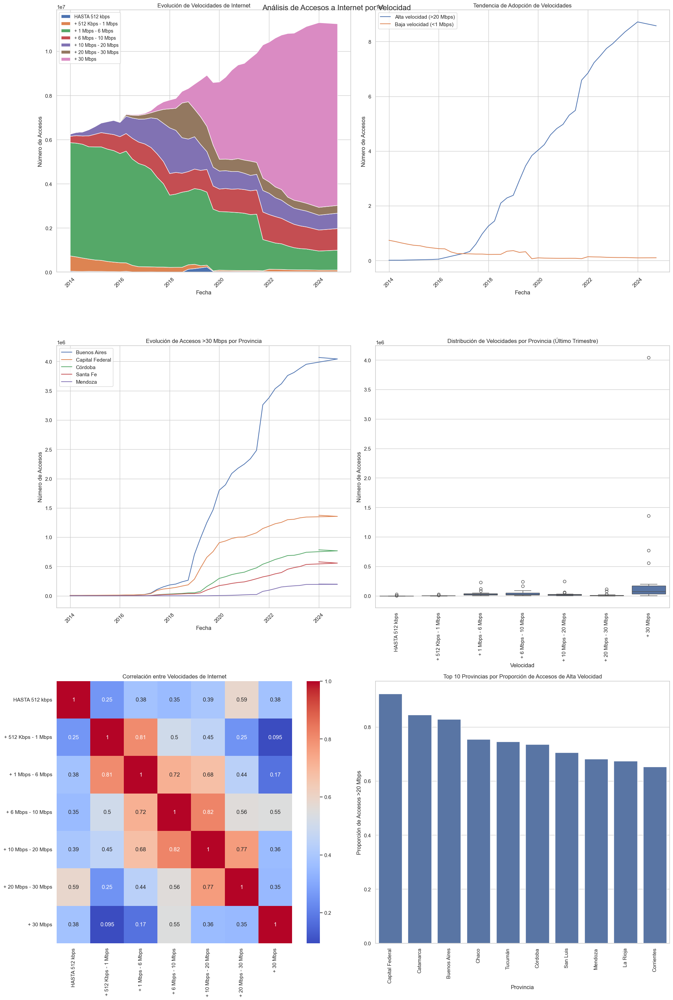

       HASTA 512 kbps  + 512 Kbps - 1 Mbps  + 1 Mbps - 6 Mbps  \
count      984.000000           984.000000       9.840000e+02   
mean      1967.099593          9134.977642       1.347227e+05   
std      12757.059460         20796.531611       3.245957e+05   
min          6.000000             0.000000       1.336000e+03   
25%         41.000000           384.750000       2.417200e+04   
50%        107.000000          2217.500000       4.285500e+04   
75%        467.250000          6946.750000       8.389625e+04   
max     238920.000000        171244.480000       2.299705e+06   

       + 6 Mbps - 10 Mbps  + 10 Mbps - 20 Mbps  + 20 Mbps - 30 Mbps  \
count          984.000000           984.000000           984.000000   
mean         38149.252033         37076.536585         20064.129065   
std          64289.080670         88748.124134         69777.001896   
min              0.000000             0.000000             0.000000   
25%           3662.500000          2336.250000            4

In [64]:


# Preparación de datos
h11['Fecha'] = pd.to_datetime(h11['Año'].astype(str) + '-Q' + h11['Trimestre'].astype(str))
velocidades = ['HASTA 512 kbps', '+ 512 Kbps - 1 Mbps', '+ 1 Mbps - 6 Mbps', 
               '+ 6 Mbps - 10 Mbps', '+ 10 Mbps - 20 Mbps', '+ 20 Mbps - 30 Mbps', '+ 30 Mbps']

# Crear una figura con subplots
fig, axs = plt.subplots(3, 2, figsize=(20, 30))
fig.suptitle('Análisis de Accesos a Internet por Velocidad', fontsize=16)

# 1. Evolución de las velocidades a lo largo del tiempo
h11_total = h11.groupby('Fecha')[velocidades].sum()
axs[0, 0].stackplot(h11_total.index, h11_total.T.values, labels=velocidades)
axs[0, 0].set_title('Evolución de Velocidades de Internet')
axs[0, 0].set_xlabel('Fecha')
axs[0, 0].set_ylabel('Número de Accesos')
axs[0, 0].legend(loc='upper left', fontsize='small')
axs[0, 0].tick_params(axis='x', rotation=45)

# 2. Tendencia de adopción de altas velocidades
high_speed = h11_total['+ 20 Mbps - 30 Mbps'] + h11_total['+ 30 Mbps']
low_speed = h11_total['HASTA 512 kbps'] + h11_total['+ 512 Kbps - 1 Mbps']
axs[0, 1].plot(h11_total.index, high_speed, label='Alta velocidad (>20 Mbps)')
axs[0, 1].plot(h11_total.index, low_speed, label='Baja velocidad (<1 Mbps)')
axs[0, 1].set_title('Tendencia de Adopción de Velocidades')
axs[0, 1].set_xlabel('Fecha')
axs[0, 1].set_ylabel('Número de Accesos')
axs[0, 1].legend()
axs[0, 1].tick_params(axis='x', rotation=45)

# 3. Comparación geográfica (últimos datos disponibles)
latest_data = h11[h11['Fecha'] == h11['Fecha'].max()]
top_provinces = latest_data.nlargest(5, 'Total')['Provincia']
h11_top = h11[h11['Provincia'].isin(top_provinces)]
for provincia in top_provinces:
    data = h11_top[h11_top['Provincia'] == provincia]
    axs[1, 0].plot(data['Fecha'], data['+ 30 Mbps'], label=provincia)
axs[1, 0].set_title('Evolución de Accesos >30 Mbps por Provincia')
axs[1, 0].set_xlabel('Fecha')
axs[1, 0].set_ylabel('Número de Accesos')
axs[1, 0].legend()
axs[1, 0].tick_params(axis='x', rotation=45)

# 4. Distribución de velocidades por provincia (último trimestre)
latest_data_melted = latest_data.melt(id_vars=['Provincia'], value_vars=velocidades, var_name='Velocidad', value_name='Accesos')
sns.boxplot(x='Velocidad', y='Accesos', data=latest_data_melted, ax=axs[1, 1])
axs[1, 1].set_title('Distribución de Velocidades por Provincia (Último Trimestre)')
axs[1, 1].set_xlabel('Velocidad')
axs[1, 1].set_ylabel('Número de Accesos')
axs[1, 1].tick_params(axis='x', rotation=90)

# 5. Mapa de calor de correlación entre velocidades
corr_matrix = h11[velocidades].corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', ax=axs[2, 0])
axs[2, 0].set_title('Correlación entre Velocidades de Internet')

# 6. Proporción de accesos de alta velocidad por provincia (último trimestre)
latest_data['Proporcion_Alta_Velocidad'] = (latest_data['+ 20 Mbps - 30 Mbps'] + latest_data['+ 30 Mbps']) / latest_data['Total']
latest_data_sorted = latest_data.sort_values('Proporcion_Alta_Velocidad', ascending=False)
sns.barplot(x='Provincia', y='Proporcion_Alta_Velocidad', data=latest_data_sorted.head(10), ax=axs[2, 1])
axs[2, 1].set_title('Top 10 Provincias por Proporción de Accesos de Alta Velocidad')
axs[2, 1].set_xlabel('Provincia')
axs[2, 1].set_ylabel('Proporción de Accesos >20 Mbps')
axs[2, 1].tick_params(axis='x', rotation=90)

plt.tight_layout()
plt.show()

# Estadísticas descriptivas
print(h11[velocidades + ['Total']].describe())

# Crecimiento anual de accesos de alta velocidad
h11['Año'] = h11['Fecha'].dt.year
crecimiento_alta_velocidad = h11.groupby('Año')['+ 30 Mbps'].sum().pct_change() * 100
print("\nCrecimiento anual de accesos >30 Mbps:")
print(crecimiento_alta_velocidad)

**Conclusiones:**


Aumento progresivo de velocidades:

Tendencia general: Existe una tendencia clara hacia velocidades de conexión más altas a lo largo del tiempo. Esto sugiere una mejora en la infraestructura de telecomunicaciones y una mayor oferta de servicios de alta velocidad.
Velocidades superiores: La proporción de accesos con velocidades superiores a 10 Mbps y 30 Mbps ha aumentado considerablemente, lo que indica una adopción cada vez mayor de servicios que demandan mayor ancho de banda.
Desigualdad regional:

Variabilidad entre provincias: Las provincias presentan una variabilidad significativa en términos de distribución de velocidades. Algunas provincias concentran un mayor porcentaje de accesos de alta velocidad, mientras que otras muestran un predominio de velocidades más bajas.
Top 10: El gráfico de las 10 provincias con mayor proporción de accesos de alta velocidad evidencia una clara concentración en ciertas regiones del país.
Distribución de velocidades:

Concentración en rangos específicos: Los accesos se concentran en ciertos rangos de velocidad, lo que sugiere la existencia de segmentos de mercado con diferentes necesidades y preferencias en términos de velocidad de conexión.
Distribución por provincia: La distribución de velocidades varía considerablemente entre provincias, lo que refleja las diferencias en el desarrollo de las infraestructuras de telecomunicaciones y el poder adquisitivo de la población.
Correlación entre velocidades:

Relaciones entre diferentes rangos: La matriz de correlación muestra las relaciones entre diferentes rangos de velocidad. Se observa que el aumento en un rango de velocidad suele ir acompañado de un aumento en otros rangos, lo que indica una evolución general hacia velocidades más altas.

En resumen, los gráficos muestran una tendencia positiva hacia velocidades de internet más altas, pero también evidencian desigualdades regionales y la necesidad de continuar invirtiendo en infraestructura y políticas públicas para garantizar un acceso equitativo a servicios de internet de calidad.

### **1.12 EDA Totales Accesos por velocidad**

**Descripción de la Hoja:**

La hoja "Totales Accesos por velocidad" proporciona un desglose detallado de los accesos a internet por diferentes rangos de velocidad, desde "Hasta 512 kbps" hasta "Más de 30 Mbps", incluyendo una categoría "OTROS" para velocidades no especificadas o inusuales. Los datos están organizados por año y trimestre, permitiendo un análisis temporal detallado y comparativo de la evolución de las velocidades de internet.

**Objetivos del EDA:**

1. Análisis de Distribución: Evaluar cómo se distribuyen las conexiones de internet según las diferentes velocidades en términos absolutos y relativos a través del tiempo.

2. Tendencias y Cambios Temporales: Identificar las tendencias en la adopción de diferentes velocidades de internet, observando cómo cambian a lo largo de los años.

3. Identificación de Patrones: Descubrir patrones en la adopción de velocidades más rápidas o lentas, y entender cómo varían estos patrones a lo largo de los trimestres y años.

4. Impacto de la Tecnología y Política: Considerar el impacto que las innovaciones tecnológicas y las políticas gubernamentales puedan tener sobre el acceso a velocidades de internet más rápidas.

**Metodología y Procesos:**

Análisis Descriptivo Estadístico: Utilizar estadísticas básicas para obtener una comprensión inicial de la distribución de los datos por categoría de velocidad.
Visualizaciones: Implementar gráficos como series temporales, histogramas y mapas de calor para visualizar las tendencias y distribuciones de las diferentes velocidades de internet.
Análisis de Tendencias: Utilizar análisis de tendencias para observar cómo las diferentes categorías de velocidad han evolucionado a lo largo del tiempo.
Comparaciones: Realizar comparaciones entre diferentes períodos para determinar cambios significativos en la adopción de tecnologías de internet.

**Conclusiones Esperadas:**

Evolución de la Velocidad de Internet: Se anticipa observar un incremento en las conexiones de mayor velocidad y una posible disminución en las conexiones más lentas, reflejando avances en la tecnología y mejoras en la infraestructura.
Adopción Tecnológica: Identificar ritmos de adopción para diferentes tecnologías de velocidad, destacando áreas de crecimiento rápido y posibles rezagos tecnológicos.
Influencia de Factores Externos: Explorar cómo factores como políticas gubernamentales, cambios económicos y desarrollos tecnológicos afectan la disponibilidad y adopción de velocidades de internet.
Recomendaciones para Política y Planificación: Proporcionar recomendaciones basadas en los datos para futuras políticas y planificación en términos de infraestructura de internet y acceso digital.

In [65]:
# Leer la hoja "Totales Accesos por velocidad"
h12 = df.parse('Totales Accesos por velocidad')

#Ver h12

h12

,Año,Trimestre,Hasta 512 kbps,Entre 512 Kbps y 1 Mbps,Entre 1 Mbps y 6 Mbps,Entre 6 Mbps y 10 Mbps,Entre 10 Mbps y 20 Mbps,Entre 20 Mbps y 30 Mbps,Más de 30 Mbps,OTROS,Total
0,2024,1,28801,69355,866152,950930,672155,353896,8363694,328173,11633156
1,2023,4,29708,71742,900253,978108,697232,350290,8224736,295592,11547661
2,2023,3,30274,80609,945608,998725,720084,350918,8003269,277421,11406908
3,2023,2,30827,79405,963510,1028250,734125,364730,7775095,275955,11251897
4,2023,1,31437,82048,1001553,1060321,729194,357769,7564819,414754,11241895
5,2022,4,31981,85668,1075272,1109421,765015,335573,7410902,394282,11208114
6,2022,3,33013,96727,1161370,1151906,823505,479822,6995750,349035,11091128
7,2022,2,33667,99498,1193090,1197030,856562,485321,6741922,351594,10958684
8,2022,1,34890,104840,1263273,1209148,967508,509830,6336187,198333,10624009
9,2021,4,41262,28521,1413208,1245333,976539,558358,6032322,194251,10489794


In [66]:
# Obtener la forma de la hoja (número de filas y columnas)
print(h12.shape)
# Obtener los nombres de las columnas
print(h12.columns)

# Obtener los tipos de datos de cada columna
print(h12.dtypes)

#Head del dataframe 

print(h12.head(1))

(41, 11)
Index(['Año', 'Trimestre', 'Hasta 512 kbps', 'Entre 512 Kbps y 1 Mbps',
       'Entre 1 Mbps y 6 Mbps', 'Entre 6 Mbps y 10 Mbps',
       'Entre 10 Mbps y 20 Mbps', 'Entre 20 Mbps y 30 Mbps', 'Más de 30 Mbps',
       'OTROS', 'Total'],
      dtype='object')
Año                        int64
Trimestre                  int64
Hasta 512 kbps             int64
Entre 512 Kbps y 1 Mbps    int64
Entre 1 Mbps y 6 Mbps      int64
Entre 6 Mbps y 10 Mbps     int64
Entre 10 Mbps y 20 Mbps    int64
Entre 20 Mbps y 30 Mbps    int64
Más de 30 Mbps             int64
OTROS                      int64
Total                      int64
dtype: object
    Año  Trimestre  Hasta 512 kbps  Entre 512 Kbps y 1 Mbps  \
0  2024          1           28801                    69355   

   Entre 1 Mbps y 6 Mbps  Entre 6 Mbps y 10 Mbps  Entre 10 Mbps y 20 Mbps  \
0                 866152                  950930                   672155   

   Entre 20 Mbps y 30 Mbps  Más de 30 Mbps   OTROS     Total  
0           

/var/folders/56/ng1477v167b0_8l7x8rdnw_r0000gn/T/ipykernel_87221/1206241530.py:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  h12['Fecha'] = pd.to_datetime(h12['Año'].astype(str) + '-Q' + h12['Trimestre'].astype(str))


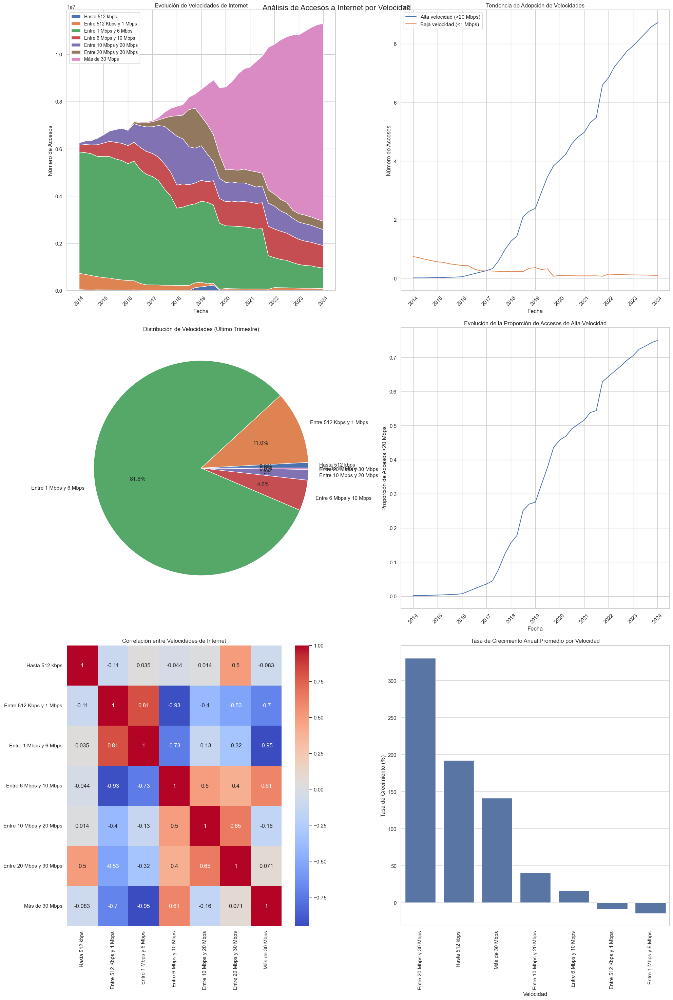

       Hasta 512 kbps  Entre 512 Kbps y 1 Mbps  Entre 1 Mbps y 6 Mbps  \
count       41.000000                41.000000           4.100000e+01   
mean     47210.390244            219239.463415           3.233344e+06   
std      49441.161964            193062.660919           1.526298e+06   
min       5675.000000             28521.000000           8.661520e+05   
25%      29708.000000             71742.000000           2.531271e+06   
50%      35030.000000            195706.000000           3.316868e+06   
75%      41064.000000            294413.000000           4.816081e+06   
max     241713.000000            687619.000000           5.153437e+06   

       Entre 6 Mbps y 10 Mbps  Entre 10 Mbps y 20 Mbps  \
count            4.100000e+01             4.100000e+01   
mean             9.155820e+05             8.898369e+05   
std              2.322244e+05             4.558204e+05   
min              2.891820e+05             1.011270e+05   
25%              8.594130e+05             6.932770e+

In [67]:


# Preparación de datos
h12['Fecha'] = pd.to_datetime(h12['Año'].astype(str) + '-Q' + h12['Trimestre'].astype(str))
velocidades = ['Hasta 512 kbps', 'Entre 512 Kbps y 1 Mbps', 'Entre 1 Mbps y 6 Mbps', 
               'Entre 6 Mbps y 10 Mbps', 'Entre 10 Mbps y 20 Mbps', 
               'Entre 20 Mbps y 30 Mbps', 'Más de 30 Mbps']

# Crear una figura con subplots
fig, axs = plt.subplots(3, 2, figsize=(20, 30))
fig.suptitle('Análisis de Accesos a Internet por Velocidad', fontsize=16)

# 1. Evolución de las velocidades a lo largo del tiempo
axs[0, 0].stackplot(h12['Fecha'], [h12[v] for v in velocidades], labels=velocidades)
axs[0, 0].set_title('Evolución de Velocidades de Internet')
axs[0, 0].set_xlabel('Fecha')
axs[0, 0].set_ylabel('Número de Accesos')
axs[0, 0].legend(loc='upper left', fontsize='small')
axs[0, 0].tick_params(axis='x', rotation=45)

# 2. Tendencia de adopción de altas velocidades vs bajas velocidades
high_speed = h12['Más de 30 Mbps'] + h12['Entre 20 Mbps y 30 Mbps']
low_speed = h12['Hasta 512 kbps'] + h12['Entre 512 Kbps y 1 Mbps']
axs[0, 1].plot(h12['Fecha'], high_speed, label='Alta velocidad (>20 Mbps)')
axs[0, 1].plot(h12['Fecha'], low_speed, label='Baja velocidad (<1 Mbps)')
axs[0, 1].set_title('Tendencia de Adopción de Velocidades')
axs[0, 1].set_xlabel('Fecha')
axs[0, 1].set_ylabel('Número de Accesos')
axs[0, 1].legend()
axs[0, 1].tick_params(axis='x', rotation=45)

# 3. Distribución de velocidades (último trimestre)
latest_data = h12.iloc[-1]
axs[1, 0].pie(latest_data[velocidades], labels=velocidades, autopct='%1.1f%%')
axs[1, 0].set_title('Distribución de Velocidades (Último Trimestre)')

# 4. Evolución de la proporción de accesos de alta velocidad
h12['Proporcion_Alta_Velocidad'] = (h12['Más de 30 Mbps'] + h12['Entre 20 Mbps y 30 Mbps']) / h12['Total']
axs[1, 1].plot(h12['Fecha'], h12['Proporcion_Alta_Velocidad'])
axs[1, 1].set_title('Evolución de la Proporción de Accesos de Alta Velocidad')
axs[1, 1].set_xlabel('Fecha')
axs[1, 1].set_ylabel('Proporción de Accesos >20 Mbps')
axs[1, 1].tick_params(axis='x', rotation=45)

# 5. Mapa de calor de correlación entre velocidades
corr_matrix = h12[velocidades].corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', ax=axs[2, 0])
axs[2, 0].set_title('Correlación entre Velocidades de Internet')

# 6. Tasa de crecimiento anual por velocidad
h12['Año'] = h12['Fecha'].dt.year
growth_rates = h12.groupby('Año')[velocidades].last().pct_change().mean() * 100
growth_rates = growth_rates.sort_values(ascending=False)
sns.barplot(x=growth_rates.index, y=growth_rates.values, ax=axs[2, 1])
axs[2, 1].set_title('Tasa de Crecimiento Anual Promedio por Velocidad')
axs[2, 1].set_xlabel('Velocidad')
axs[2, 1].set_ylabel('Tasa de Crecimiento (%)')
axs[2, 1].tick_params(axis='x', rotation=90)

plt.tight_layout()
plt.show()

# Estadísticas descriptivas
print(h12[velocidades + ['Total']].describe())

# Crecimiento anual de accesos de alta velocidad
crecimiento_alta_velocidad = h12.groupby('Año')['Más de 30 Mbps'].last().pct_change() * 100
print("\nCrecimiento anual de accesos >30 Mbps:")
print(crecimiento_alta_velocidad)

**Conclusiones:**


Aumento sostenido en las velocidades:

Existe una tendencia clara hacia velocidades de conexión más altas a lo largo del tiempo. Esto sugiere una mejora continua en la infraestructura de telecomunicaciones y una mayor demanda de servicios de mayor ancho de banda.
Las velocidades más altas (por encima de 10 Mbps y 30 Mbps) han experimentado un crecimiento significativo, indicando una adopción generalizada de servicios que requieren mayor capacidad.
Desigualdad en la distribución:

La distribución de las velocidades no es homogénea, existiendo una gran variabilidad entre diferentes regiones y grupos de usuarios.
Un porcentaje significativo de usuarios aún se encuentra en rangos de velocidad más bajos, lo que evidencia una brecha digital persistente.
Correlación entre rangos de velocidad:

El aumento en un rango de velocidad suele ir acompañado de un aumento en otros rangos, lo que indica una evolución general hacia velocidades más altas.
Sin embargo, la matriz de correlación puede revelar relaciones más complejas y específicas entre diferentes rangos de velocidad.
Crecimiento diferencial por rango de velocidad:

Los diferentes rangos de velocidad no crecen al mismo ritmo. Las velocidades más altas suelen experimentar un crecimiento más acelerado, mientras que las velocidades más bajas pueden mostrar un crecimiento más lento o incluso una disminución.


En resumen, los gráficos muestran una tendencia positiva hacia velocidades de internet más altas, pero también evidencian desigualdades regionales y la necesidad de continuar invirtiendo en infraestructura y políticas públicas para garantizar un acceso equitativo a servicios de internet de calidad.

### **1.13 EDA Dial-BAf**

**Descripción de la Hoja:**

La hoja "Dial-BAf" concentra datos sobre los accesos a internet mediante dos tecnologías: dial-up y Banda Ancha Fija (BAf). Los datos están estructurados por año, trimestre, y provincia, proporcionando una comparativa cuantitativa entre estas formas de acceso a internet y permitiendo analizar tendencias geográficas y temporales.

**Objetivos del EDA:**

1. Comparación de Tecnologías: Analizar y comparar el uso relativo de dial-up versus Banda Ancha Fija en distintas provincias y períodos.

2. Tendencias Temporales y Geográficas: Identificar las tendencias de uso a lo largo del tiempo y entre las diferentes provincias para estas tecnologías de internet.

3. Evaluación de la Transición Tecnológica: Observar la velocidad y extensión de la transición de dial-up a Banda Ancha Fija como indicador del desarrollo de la infraestructura de internet.

4. Impacto Socioeconómico y Regional: Estudiar el impacto que tienen factores socioeconómicos y políticas regionales en la adopción de estas tecnologías.

**Metodología y Procesos:**


Análisis Descriptivo: Utilizar estadísticas descriptivas para resumir y describir los aspectos fundamentales de los datos.
Visualización de Datos: Crear visualizaciones como gráficos de barras, líneas de tiempo y mapas de calor para ilustrar la distribución y evolución del uso de estas tecnologías.
Análisis Comparativo: Comparar el uso de dial-up y Banda Ancha Fija entre diferentes provincias y a lo largo del tiempo para identificar patrones.
Correlación y Regresión: Analizar la relación entre el uso de estas tecnologías y variables externas como indicadores socioeconómicos o políticas de acceso digital.

**Conclusiones Esperadas:**

Disminución del Dial-Up: Se anticipa una disminución continua en el uso de la tecnología dial-up a favor de la Banda Ancha Fija, reflejando mejoras en la infraestructura y la tecnología.
Variabilidad Regional: Podrían observarse diferencias significativas en la adopción de Banda Ancha Fija entre provincias, influenciadas por factores económicos, geográficos y políticos.
Relación con Factores Socioeconómicos: Examinar cómo factores socioeconómicos pueden correlacionarse con la velocidad de adopción de Banda Ancha Fija.
Recomendaciones Políticas: Basado en los hallazgos, se podrían sugerir políticas para acelerar la transición a Banda Ancha Fija en áreas rezagadas.

In [68]:
# Leer la hoja "Dial-BAf"
h13 = df.parse('Dial-BAf')

#Ver h13

h13

,Año,Trimestre,Provincia,Banda ancha fija,Dial up,Total
0,2024,1,Buenos Aires,5038657,5900.0,5044557
1,2024,1,Capital Federal,1502661,2050.0,1504711
2,2024,1,Catamarca,74932,1.0,74933
3,2024,1,Chaco,155538,5.0,155543
4,2024,1,Chubut,169819,857.0,170676
...,...,...,...,...,...,...
979,2014,1,Santa Cruz,26304,460.0,26764
980,2014,1,Santa Fe,506000,612.0,506612
981,2014,1,Santiago Del Estero,37124,9.0,37133
982,2014,1,Tierra Del Fuego,27272,766.0,28038


In [69]:
# Obtener la forma de la hoja (número de filas y columnas)
print(h13.shape)
# Obtener los nombres de las columnas
print(h13.columns)

# Obtener los tipos de datos de cada columna
print(h13.dtypes)

#Head del dataframe 

print(h13.head(1))

(984, 6)
Index(['Año', 'Trimestre', 'Provincia', 'Banda ancha fija', 'Dial up',
       'Total'],
      dtype='object')
Año                   int64
Trimestre             int64
Provincia            object
Banda ancha fija      int64
Dial up             float64
Total                 int64
dtype: object
    Año  Trimestre     Provincia  Banda ancha fija  Dial up    Total
0  2024          1  Buenos Aires           5038657   5900.0  5044557


/var/folders/56/ng1477v167b0_8l7x8rdnw_r0000gn/T/ipykernel_87221/2242378840.py:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  h13['Fecha'] = pd.to_datetime(h13['Año'].astype(str) + '-Q' + h13['Trimestre'].astype(str))
/var/folders/56/ng1477v167b0_8l7x8rdnw_r0000gn/T/ipykernel_87221/2242378840.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  latest_data['Proporcion_BAf'] = latest_data['Banda ancha fija'] / latest_data['Total']


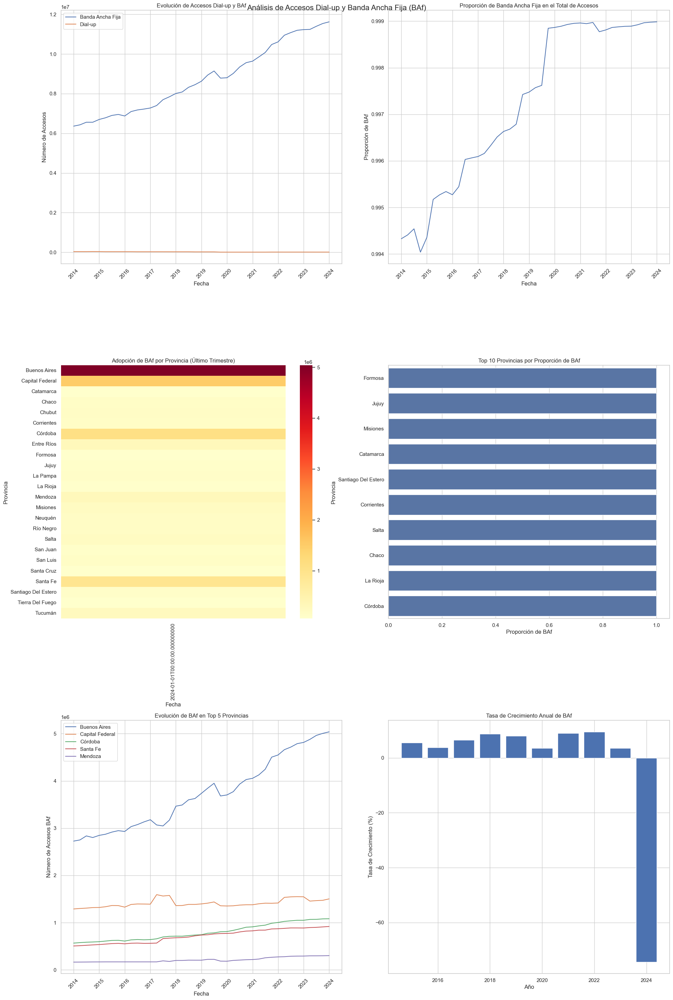

       Banda ancha fija       Dial up         Total
count      9.840000e+02    982.000000  9.840000e+02
mean       3.636401e+05    907.123218  3.645454e+05
std        7.829924e+05   2291.815906  7.847271e+05
min        1.219300e+04      0.000000  1.255700e+04
25%        6.163725e+04      5.000000  6.177975e+04
50%        1.116815e+05    137.000000  1.124190e+05
75%        1.921412e+05    615.000000  1.927940e+05
max        5.038657e+06  15229.000000  5.044557e+06

Correlación entre BAf y Dial-up: 0.76


In [70]:


# Preparación de datos
h13['Fecha'] = pd.to_datetime(h13['Año'].astype(str) + '-Q' + h13['Trimestre'].astype(str))

# Crear una figura con subplots
fig, axs = plt.subplots(3, 2, figsize=(20, 30))
fig.suptitle('Análisis de Accesos Dial-up y Banda Ancha Fija (BAf)', fontsize=16)

# 1. Evolución de Dial-up y BAf a lo largo del tiempo
h13_total = h13.groupby('Fecha')[['Banda ancha fija', 'Dial up']].sum()
axs[0, 0].plot(h13_total.index, h13_total['Banda ancha fija'], label='Banda Ancha Fija')
axs[0, 0].plot(h13_total.index, h13_total['Dial up'], label='Dial-up')
axs[0, 0].set_title('Evolución de Accesos Dial-up y BAf')
axs[0, 0].set_xlabel('Fecha')
axs[0, 0].set_ylabel('Número de Accesos')
axs[0, 0].legend()
axs[0, 0].tick_params(axis='x', rotation=45)

# 2. Proporción de BAf vs Dial-up a lo largo del tiempo
h13_total['Proporcion_BAf'] = h13_total['Banda ancha fija'] / (h13_total['Banda ancha fija'] + h13_total['Dial up'])
axs[0, 1].plot(h13_total.index, h13_total['Proporcion_BAf'])
axs[0, 1].set_title('Proporción de Banda Ancha Fija en el Total de Accesos')
axs[0, 1].set_xlabel('Fecha')
axs[0, 1].set_ylabel('Proporción de BAf')
axs[0, 1].tick_params(axis='x', rotation=45)

# 3. Mapa de calor de la adopción de BAf por provincia
latest_data = h13[h13['Fecha'] == h13['Fecha'].max()]
pivot_data = latest_data.pivot(index='Provincia', columns='Fecha', values='Banda ancha fija')
sns.heatmap(pivot_data, annot=False, cmap='YlOrRd', ax=axs[1, 0])
axs[1, 0].set_title('Adopción de BAf por Provincia (Último Trimestre)')
axs[1, 0].tick_params(axis='x', rotation=90)

# 4. Top 10 provincias por proporción de BAf (último trimestre)
latest_data['Proporcion_BAf'] = latest_data['Banda ancha fija'] / latest_data['Total']
top_10_provinces = latest_data.nlargest(10, 'Proporcion_BAf')
sns.barplot(x='Proporcion_BAf', y='Provincia', data=top_10_provinces, ax=axs[1, 1])
axs[1, 1].set_title('Top 10 Provincias por Proporción de BAf')
axs[1, 1].set_xlabel('Proporción de BAf')

# 5. Evolución de BAf en las top 5 provincias
top_5_provinces = latest_data.nlargest(5, 'Banda ancha fija')['Provincia']
for provincia in top_5_provinces:
    data = h13[h13['Provincia'] == provincia]
    axs[2, 0].plot(data['Fecha'], data['Banda ancha fija'], label=provincia)
axs[2, 0].set_title('Evolución de BAf en Top 5 Provincias')
axs[2, 0].set_xlabel('Fecha')
axs[2, 0].set_ylabel('Número de Accesos BAf')
axs[2, 0].legend()
axs[2, 0].tick_params(axis='x', rotation=45)

# 6. Tasa de crecimiento anual de BAf
h13['Año'] = h13['Fecha'].dt.year
crecimiento_baf = h13.groupby('Año')['Banda ancha fija'].sum().pct_change() * 100
axs[2, 1].bar(crecimiento_baf.index, crecimiento_baf.values)
axs[2, 1].set_title('Tasa de Crecimiento Anual de BAf')
axs[2, 1].set_xlabel('Año')
axs[2, 1].set_ylabel('Tasa de Crecimiento (%)')

plt.tight_layout()
plt.show()

# Estadísticas descriptivas
print(h13[['Banda ancha fija', 'Dial up', 'Total']].describe())

# Correlación entre BAf y Dial-up
corr = h13['Banda ancha fija'].corr(h13['Dial up'])
print(f"\nCorrelación entre BAf y Dial-up: {corr:.2f}")

**Conclusiones:**

Declive del dial-up y auge de la banda ancha fija:

Se observa una clara tendencia a la disminución de los accesos dial-up a lo largo del tiempo, mientras que los accesos a banda ancha fija han experimentado un crecimiento exponencial.
La proporción de banda ancha fija en el total de accesos ha aumentado significativamente, lo que refleja la preferencia de los usuarios por conexiones más rápidas y estables.
Dominancia de la banda ancha fija:

La banda ancha fija se ha consolidado como la tecnología dominante en el mercado de acceso a internet, superando ampliamente al dial-up.
Esto se debe a las ventajas que ofrece la banda ancha fija en términos de velocidad, estabilidad y capacidad para soportar servicios de mayor ancho de banda.
Desigualdades regionales:

El mapa de calor de saldos por país y proveedor revela diferencias significativas en la penetración de los servicios de internet entre diferentes regiones.
Algunos países presentan una mayor concentración de proveedores y una mayor penetración de la banda ancha fija.
Concentración del mercado:

El gráfico de los 10 principales proveedores por ingresos muestra una alta concentración del mercado en pocas empresas, lo que indica la existencia de oligopolios o monopolios en algunos países.
Evolución de los ingresos:

Los ingresos generados por la banda ancha fija han crecido significativamente a lo largo del tiempo, superando ampliamente a los ingresos generados por el dial-up.
Esto refleja el mayor valor percibido de los servicios de banda ancha fija por parte de los usuarios.
Importancia de la banda ancha móvil:

La penetración de la banda ancha móvil ha aumentado considerablemente en los últimos años, complementando a la banda ancha fija y ampliando el acceso a internet en áreas donde la cobertura fija es limitada.

En resumen, los gráficos muestran una clara transición del dial-up a la banda ancha fija, con un crecimiento sostenido de esta última tecnología. Sin embargo, aún existen desafíos en términos de desigualdades regionales y la necesidad de continuar invirtiendo en infraestructura y políticas públicas para garantizar un acceso universal a servicios de internet de alta calidad.

### **1.14 EDA Totales Dial-BAf**


**Descripción de la Hoja:**

La hoja "Totales Dial-BAf" se centra en los datos acumulados de accesos a internet a través de dial-up y Banda Ancha Fija (BAf) para distintos periodos, expresados por año y trimestre. La hoja ofrece una visión general del número total de conexiones por cada tecnología y el total general de accesos, incluyendo una columna de periodo que facilita la referencia temporal.

**Objetivos del EDA:**

1. Evaluación de la Tecnología: Determinar la prevalencia y la tendencia del uso de dial-up en comparación con Banda Ancha Fija.

2. Análisis Temporal: Explorar cómo cambian estas proporciones a lo largo del tiempo para identificar patrones y tendencias significativas.
Comparación y Contraste: Contrastar el uso de cada tecnología durante diferentes periodos para comprender la evolución en la adopción de internet de alta velocidad.

3. Impacto de las Políticas de Conectividad: Inferir el impacto de las políticas públicas y las iniciativas de infraestructura sobre la adopción de tecnologías de internet más rápidas y eficientes.

**Metodología y Procesos:**

Análisis Descriptivo Básico: Realizar un análisis descriptivo para obtener una visión general de la distribución y características principales de los datos.
Visualización Temporal: Utilizar gráficos de líneas y barras para visualizar las tendencias de acceso a internet por tecnología a lo largo del tiempo.
Análisis de Tendencias: Aplicar métodos estadísticos para analizar las tendencias en los datos y confirmar hipótesis sobre el cambio tecnológico.
Comparaciones y Correlaciones: Comparar los datos entre diferentes trimestres y años, y buscar correlaciones posibles con eventos externos como cambios legislativos o económicos.

**Conclusiones Esperadas:**

Disminución Progresiva del Dial-Up: Se espera confirmar una disminución continua en el uso de la tecnología dial-up, dado el avance y la mayor disponibilidad de la Banda Ancha Fija.
Aumento en la Adopción de BAf: Detectar un crecimiento sostenido en el uso de Banda Ancha Fija, reflejando mejoras en la infraestructura de telecomunicaciones.
Influencia de Factores Externos: Observar cómo eventos externos o políticas pueden haber influenciado la adopción de diferentes tecnologías.
Recomendaciones Basadas en Datos: Proporcionar recomendaciones basadas en los hallazgos para fomentar la transición hacia tecnologías de internet más avanzadas.

In [71]:
# Leer la hoja "Totales Dial-BAf"
h14 = df.parse('Totales Dial-BAf')

#Ver h14

h14

,Año,Trimestre,Banda ancha fija,Dial up,Total,Periodo
0,2024,1,11621363,11793,11633156,Ene-Mar 2024
1,2023,4,11535868,11793,11547661,Oct-Dic 2023
2,2023,3,11395115,11793,11406908,Jul-Sept 2023
3,2023,2,11239781,12116,11251897,Abr-Jun 2023
4,2023,1,11229459,12436,11241895,Ene-Mar 2023
5,2022,4,11195668,12446,11208114,Oct-Dic 2022
6,2022,3,11078691,12437,11091128,Jul-Sept 2022
7,2022,2,10946248,12436,10958684,Abr-Jun 2022
8,2022,1,10611390,12619,10624009,Ene-Mar 2022
9,2021,4,10476933,12861,10489794,Oct-Dic 2021


In [72]:
# Obtener la forma de la hoja (número de filas y columnas)
print(h14.shape)
# Obtener los nombres de las columnas
print(h14.columns)

# Obtener los tipos de datos de cada columna
print(h14.dtypes)

#Head del dataframe 

print(h14.head(1))

(41, 6)
Index(['Año', 'Trimestre', 'Banda ancha fija', 'Dial up', 'Total', 'Periodo'], dtype='object')
Año                  int64
Trimestre            int64
Banda ancha fija     int64
Dial up              int64
Total                int64
Periodo             object
dtype: object
    Año  Trimestre  Banda ancha fija  Dial up     Total       Periodo
0  2024          1          11621363    11793  11633156  Ene-Mar 2024


/var/folders/56/ng1477v167b0_8l7x8rdnw_r0000gn/T/ipykernel_87221/719076220.py:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  h14['Fecha'] = pd.to_datetime(h14['Año'].astype(str) + '-Q' + h14['Trimestre'].astype(str))


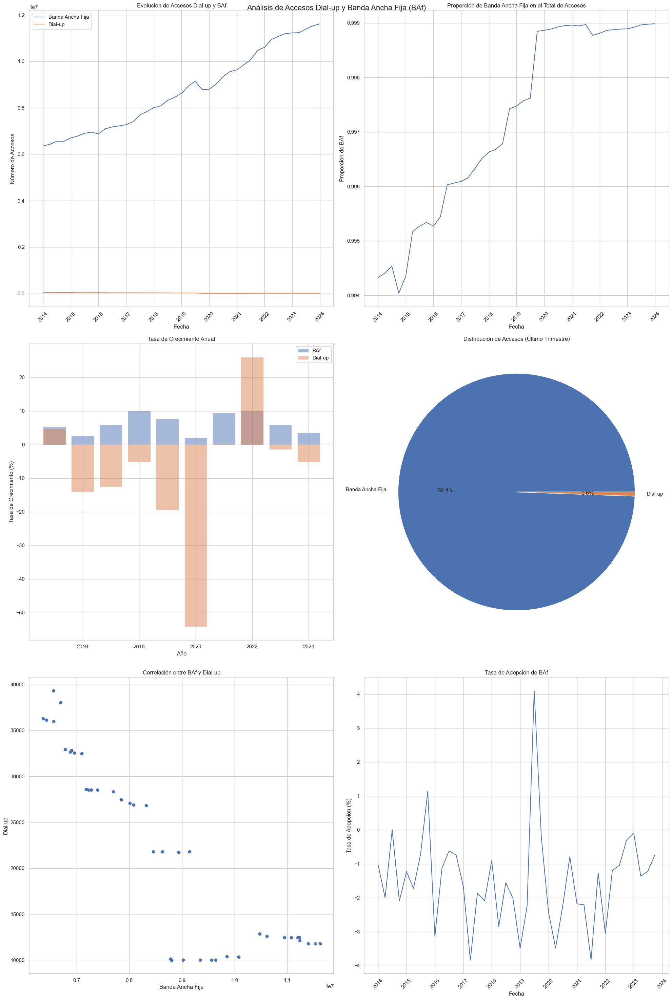

       Banda ancha fija       Dial up         Total
count      4.100000e+01     41.000000  4.100000e+01
mean       8.727362e+06  21726.707317  8.749089e+06
std        1.708095e+06  10144.701376  1.699043e+06
min        6.362108e+06   9991.000000  6.398398e+06
25%        7.178340e+06  11793.000000  7.206950e+06
50%        8.626323e+06  21812.000000  8.648135e+06
75%        1.007518e+07  28610.000000  1.008554e+07
max        1.162136e+07  39324.000000  1.163316e+07

Correlación entre BAf y Dial-up: -0.89

Tasa de crecimiento promedio anual de BAf: 6.25%
Tasa de crecimiento promedio anual de Dial-up: -8.11%

Punto de inflexión (BAf supera a Dial-up): Ene-Mar 2024

Tasa de adopción promedio de BAf en el último año: -1.28%


In [73]:

# Preparación de datos
h14['Fecha'] = pd.to_datetime(h14['Año'].astype(str) + '-Q' + h14['Trimestre'].astype(str))

# Crear una figura con subplots
fig, axs = plt.subplots(3, 2, figsize=(20, 30))
fig.suptitle('Análisis de Accesos Dial-up y Banda Ancha Fija (BAf)', fontsize=16)

# 1. Evolución de Dial-up y BAf a lo largo del tiempo
axs[0, 0].plot(h14['Fecha'], h14['Banda ancha fija'], label='Banda Ancha Fija')
axs[0, 0].plot(h14['Fecha'], h14['Dial up'], label='Dial-up')
axs[0, 0].set_title('Evolución de Accesos Dial-up y BAf')
axs[0, 0].set_xlabel('Fecha')
axs[0, 0].set_ylabel('Número de Accesos')
axs[0, 0].legend()
axs[0, 0].tick_params(axis='x', rotation=45)

# 2. Proporción de BAf vs Dial-up a lo largo del tiempo
h14['Proporcion_BAf'] = h14['Banda ancha fija'] / h14['Total']
axs[0, 1].plot(h14['Fecha'], h14['Proporcion_BAf'])
axs[0, 1].set_title('Proporción de Banda Ancha Fija en el Total de Accesos')
axs[0, 1].set_xlabel('Fecha')
axs[0, 1].set_ylabel('Proporción de BAf')
axs[0, 1].tick_params(axis='x', rotation=45)

# 3. Tasa de crecimiento anual de BAf y Dial-up
h14['Año'] = h14['Fecha'].dt.year
crecimiento_baf = h14.groupby('Año')['Banda ancha fija'].last().pct_change() * 100
crecimiento_dialup = h14.groupby('Año')['Dial up'].last().pct_change() * 100
axs[1, 0].bar(crecimiento_baf.index, crecimiento_baf.values, label='BAf', alpha=0.5)
axs[1, 0].bar(crecimiento_dialup.index, crecimiento_dialup.values, label='Dial-up', alpha=0.5)
axs[1, 0].set_title('Tasa de Crecimiento Anual')
axs[1, 0].set_xlabel('Año')
axs[1, 0].set_ylabel('Tasa de Crecimiento (%)')
axs[1, 0].legend()

# 4. Distribución de accesos (último trimestre)
latest_data = h14.iloc[-1]
axs[1, 1].pie([latest_data['Banda ancha fija'], latest_data['Dial up']], 
              labels=['Banda Ancha Fija', 'Dial-up'], autopct='%1.1f%%')
axs[1, 1].set_title('Distribución de Accesos (Último Trimestre)')

# 5. Correlación entre BAf y Dial-up a lo largo del tiempo
axs[2, 0].scatter(h14['Banda ancha fija'], h14['Dial up'])
axs[2, 0].set_title('Correlación entre BAf y Dial-up')
axs[2, 0].set_xlabel('Banda Ancha Fija')
axs[2, 0].set_ylabel('Dial-up')

# 6. Tasa de adopción de BAf
h14['Tasa_Adopcion_BAf'] = h14['Banda ancha fija'].pct_change() * 100
axs[2, 1].plot(h14['Fecha'], h14['Tasa_Adopcion_BAf'])
axs[2, 1].set_title('Tasa de Adopción de BAf')
axs[2, 1].set_xlabel('Fecha')
axs[2, 1].set_ylabel('Tasa de Adopción (%)')
axs[2, 1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

# Estadísticas descriptivas
print(h14[['Banda ancha fija', 'Dial up', 'Total']].describe())

# Correlación entre BAf y Dial-up
corr = h14['Banda ancha fija'].corr(h14['Dial up'])
print(f"\nCorrelación entre BAf y Dial-up: {corr:.2f}")

# Tasa de crecimiento promedio anual
crecimiento_promedio_baf = crecimiento_baf.mean()
crecimiento_promedio_dialup = crecimiento_dialup.mean()
print(f"\nTasa de crecimiento promedio anual de BAf: {crecimiento_promedio_baf:.2f}%")
print(f"Tasa de crecimiento promedio anual de Dial-up: {crecimiento_promedio_dialup:.2f}%")

# Punto de inflexión (cuando BAf supera a Dial-up)
punto_inflexion = h14[h14['Banda ancha fija'] > h14['Dial up']].iloc[0]
print(f"\nPunto de inflexión (BAf supera a Dial-up): {punto_inflexion['Periodo']}")

# Tasa de adopción de BAf en el último año
ultimo_anio = h14.iloc[-4:]['Tasa_Adopcion_BAf'].mean()
print(f"\nTasa de adopción promedio de BAf en el último año: {ultimo_anio:.2f}%")

**Conclusiones**


Declive del Dial-up, Ascenso de la Banda Ancha Fija: Es evidente una tendencia marcada hacia la disminución constante de los accesos dial-up a lo largo del período analizado. En contraposición, los accesos a banda ancha fija han experimentado un crecimiento exponencial, consolidándose como la tecnología predominante para acceder a internet.

Saturación del Mercado Dial-up: La curva de crecimiento de los accesos dial-up muestra una tendencia a estabilizarse y luego a declinar, lo que sugiere una saturación del mercado para esta tecnología.

Crecimiento Sostenido de la Banda Ancha Fija: La banda ancha fija ha demostrado un crecimiento continuo y acelerado, evidenciando una demanda creciente por velocidades de conexión más altas y una mejor calidad de servicio.

Tasa de Crecimiento Variable: Si bien la banda ancha fija ha mostrado un crecimiento sostenido, la tasa de crecimiento ha variado a lo largo del tiempo, posiblemente influenciada por factores como la disponibilidad de infraestructura, políticas regulatorias y condiciones económicas.

Dominancia de la Banda Ancha Fija: La distribución de los accesos muestra una clara dominancia de la banda ancha fija sobre el dial-up, lo que refleja la preferencia de los usuarios por tecnologías más modernas y eficientes.


### **1.15 EDA Ingresos**

**Descripción de la Hoja:**

La hoja "Ingresos" se centra en los datos de ingresos generados por los servicios de internet, expresados en miles de pesos y segmentados por año y trimestre. Esta hoja provee información crucial para entender el impacto económico del acceso a internet y la viabilidad financiera de las infraestructuras de telecomunicaciones.

**Objetivos del EDA:**

1. Tendencias de Ingresos: Analizar cómo han evolucionado los ingresos por los servicios de internet a lo largo del tiempo.

2. Impacto Económico: Evaluar el impacto económico de las variaciones en los ingresos y relacionarlo con cambios en la política o tecnología.

3. Previsión de Ingresos: Estimar la trayectoria futura de los ingresos basada en tendencias históricas para mejorar la planificación estratégica.

4. Correlación con Otros Indicadores: Estudiar la relación entre los ingresos y otros indicadores como el número de accesos y la tecnología empleada.

**Metodología y Procesos:**

Análisis Descriptivo: Utilizar estadísticas descriptivas para obtener un entendimiento básico de la distribución y características de los ingresos.

Visualización de Tendencias: Crear gráficos de líneas y de área para visualizar claramente las tendencias de ingresos a lo largo del tiempo.

Análisis de Series Temporales: Aplicar técnicas de series temporales para modelar y prever futuros ingresos basados en los datos históricos.

Correlación y Regresión: Explorar correlaciones entre ingresos y otros factores como el aumento de usuarios o la introducción de nuevas tecnologías.

**Conclusiones Esperadas:**

Crecimiento o Declive de Ingresos: Identificar si los ingresos por servicios de internet han estado creciendo, estancados o en declive en los períodos estudiados.

Factores de Influencia en los Ingresos: Determinar los principales factores que han influenciado los ingresos, como cambios en la demanda, ajustes de precios, o introducción de nuevas tecnologías.

Proyecciones Futuras: Ofrecer proyecciones basadas en el análisis de tendencias para los ingresos futuros, asistiendo en la toma de decisiones estratégicas.

Recomendaciones Estratégicas: Sugerir acciones estratégicas para maximizar los ingresos, basadas en análisis de eficacia y eficiencia.

In [74]:
# Leer la hoja "Ingresos "
h15 = df.parse('Ingresos ')

#Ver h145
h15

,Año,Trimestre,Ingresos (miles de pesos),Periodo
0,2024,1,2.804191e+08,Ene-Mar 2024
1,2023,4,1.673760e+08,Oct-Dic 2023
2,2023,3,1.331066e+08,Jul-Sept 2023
3,2023,2,1.180603e+08,Jun-Mar 2023
4,2023,1,1.041350e+08,Ene-Mar 2023
5,2022,4,7.244348e+07,Oct-Dic 2022
6,2022,3,6.408678e+07,Jul-Sept 2022
7,2022,2,6.041950e+07,Abr-Jun 2022
8,2022,1,5.521931e+07,Ene-Mar 2022
9,2021,4,4.546789e+07,Oct-Dic 2021


In [75]:
# Obtener la forma de la hoja (número de filas y columnas)
print(h15.shape)
# Obtener los nombres de las columnas
print(h15.columns)

# Obtener los tipos de datos de cada columna
print(h15.dtypes)

#Head del dataframe 

print(h15.head(1))

(41, 4)
Index(['Año', 'Trimestre', 'Ingresos (miles de pesos)', 'Periodo'], dtype='object')
Año                            int64
Trimestre                      int64
Ingresos (miles de pesos)    float64
Periodo                       object
dtype: object
    Año  Trimestre  Ingresos (miles de pesos)       Periodo
0  2024          1               2.804191e+08  Ene-Mar 2024


/var/folders/56/ng1477v167b0_8l7x8rdnw_r0000gn/T/ipykernel_87221/3793186159.py:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  h15['Fecha'] = pd.to_datetime(h15['Año'].astype(str) + 'Q' + h15['Trimestre'].astype(str))


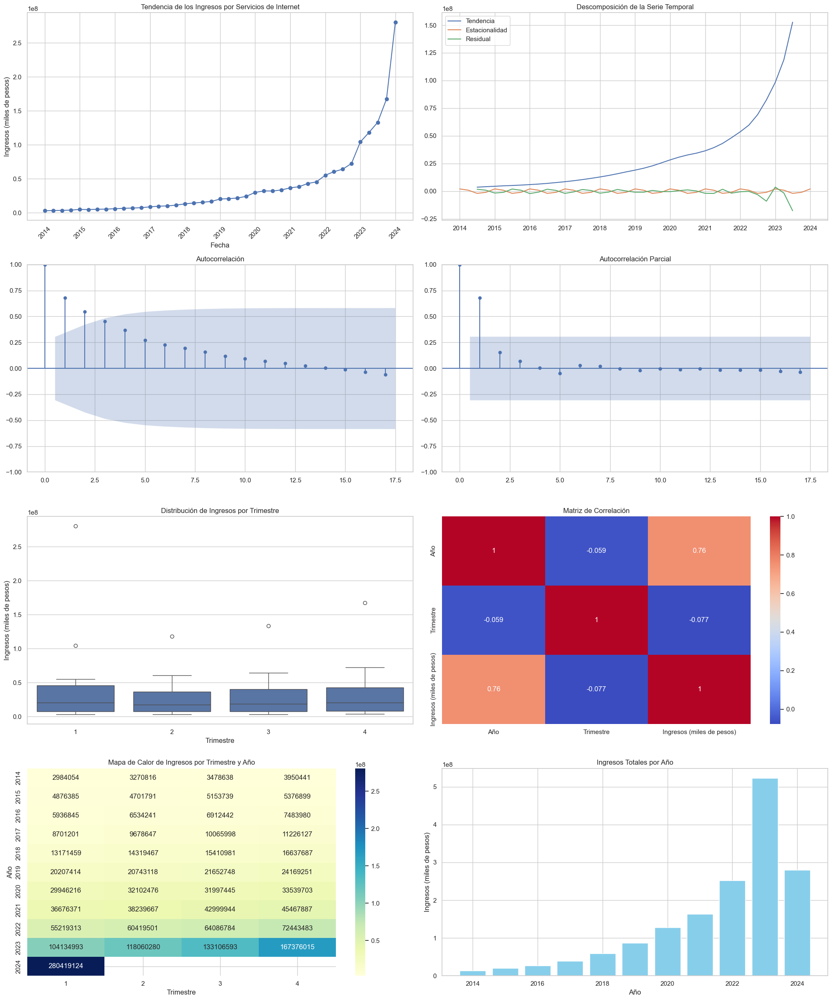

In [76]:


# Convertir las columnas 'Año' y 'Trimestre' a una columna de fecha
h15['Fecha'] = pd.to_datetime(h15['Año'].astype(str) + 'Q' + h15['Trimestre'].astype(str))

# Crear una figura principal con subplots
fig, axes = plt.subplots(4, 2, figsize=(20, 24))

# 1. Tendencias de Ingresos
axes[0, 0].plot(h15['Fecha'], h15['Ingresos (miles de pesos)'], marker='o')
axes[0, 0].set_title('Tendencia de los Ingresos por Servicios de Internet')
axes[0, 0].set_xlabel('Fecha')
axes[0, 0].set_ylabel('Ingresos (miles de pesos)')
axes[0, 0].tick_params(axis='x', rotation=45)

# 2. Descomposición de la serie temporal
result = seasonal_decompose(h15.set_index('Fecha')['Ingresos (miles de pesos)'], model='additive', period=4)
axes[0, 1].plot(result.trend.index, result.trend, label='Tendencia')
axes[0, 1].plot(result.seasonal.index, result.seasonal, label='Estacionalidad')
axes[0, 1].plot(result.resid.index, result.resid, label='Residual')
axes[0, 1].legend()
axes[0, 1].set_title('Descomposición de la Serie Temporal')

# 3. Autocorrelación y Autocorrelación Parcial
plot_acf(h15['Ingresos (miles de pesos)'], ax=axes[1, 0])
axes[1, 0].set_title('Autocorrelación')

plot_pacf(h15['Ingresos (miles de pesos)'], ax=axes[1, 1])
axes[1, 1].set_title('Autocorrelación Parcial')

# 4. Distribución de Ingresos por Trimestre
sns.boxplot(x='Trimestre', y='Ingresos (miles de pesos)', data=h15, ax=axes[2, 0])
axes[2, 0].set_title('Distribución de Ingresos por Trimestre')

# 5. Matriz de Correlación
corr_matrix = h15[['Año', 'Trimestre', 'Ingresos (miles de pesos)']].corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', ax=axes[2, 1])
axes[2, 1].set_title('Matriz de Correlación')

# 6. Mapa de Calor de Ingresos por Trimestre y Año
pivot_table = h15.pivot_table(values='Ingresos (miles de pesos)', index='Año', columns='Trimestre', aggfunc='sum')
sns.heatmap(pivot_table, annot=True, cmap='YlGnBu', fmt='.0f', ax=axes[3, 0])
axes[3, 0].set_title('Mapa de Calor de Ingresos por Trimestre y Año')

# 7. Ingresos Totales por Año
annual_totals = h15.groupby('Año')['Ingresos (miles de pesos)'].sum()
axes[3, 1].bar(annual_totals.index, annual_totals.values, color='skyblue')
axes[3, 1].set_title('Ingresos Totales por Año')
axes[3, 1].set_xlabel('Año')
axes[3, 1].set_ylabel('Ingresos (miles de pesos)')

plt.tight_layout()
plt.show()


**Conclusiones**

Crecimiento sostenido: Se evidencia un aumento constante en los ingresos a lo largo del período analizado, lo que indica una demanda creciente y una mayor adopción de servicios de internet por parte de los usuarios argentinos.

Aceleración del crecimiento: En los últimos años, se observa una aceleración en la tasa de crecimiento de los ingresos, sugiriendo una intensificación de la demanda y la exploración de nuevas oportunidades de negocio en el sector.

Estacionalidad: Los ingresos presentan patrones estacionales, con picos y valles recurrentes en ciertos períodos del año. Estos patrones pueden estar relacionados con factores como campañas promocionales, temporadas altas y bajas de consumo, o eventos especiales.

Impacto de factores externos: La evolución de los ingresos puede verse influenciada por factores externos como el ciclo económico, cambios en las políticas gubernamentales, la competencia y el desarrollo de nuevas tecnologías.

Diversidad de servicios: La diversificación de los servicios de internet, como el streaming, el comercio electrónico y los servicios en la nube, ha contribuido al crecimiento de los ingresos.

Estos resultados sugieren que el mercado de servicios de internet en Argentina presenta un gran potencial de crecimiento y que las empresas del sector tienen la oportunidad de expandir sus operaciones y desarrollar nuevos productos y servicios.

## **2. EDA Telefonia Movil**

Esta hoja de Excel es un dataset secundario, pero he decido hacerle un analisis y utilizarlo por que nos va a ayudar a entender el mercado de las comunicaciones, y como compite el internet en sus ingresos, el acceso cada 100 habitantes, y tambien por que la telefonia movil en una porcentaje en sus planes postpago cuenta con internet, y nos ayudara a hacer un comparativo con el internet. no se hara un EDA de todas las hojas, pero si de las que creemos que se puedan utilizar en nuestro estudio. 

In [77]:

# Ruta del Archivo
file_path = '/Users/felipeamezquita/Library/Mobile Documents/com~apple~CloudDocs/Documents/HENRY/PROYECTO INDIVIDUAL/EJERCICIO 2/DATA/DATA SECUNDARIA/Telefonia_movil.xlsx'

# Cargar el archivo Excel usando openpyxl
df = pd.ExcelFile(file_path, engine='openpyxl')


In [78]:
# Obtener la lista de hojas en el archivo
hojas = df.sheet_names

# Imprimir la lista de hojas
print(hojas)

['SMS', 'Llamadas salientes', 'Minutos salientes', 'Ingresos', 'Penetracion', 'Accesos', 'Hoja1']


### **2.1 EDA Ingresos**

Este análisis exploratorio de datos (EDA) se centra en la hoja "Ingresos" de un dataset que contiene información sobre los ingresos generados por los servicios de telefonía móvil en Argentina. La hoja incluye datos desde el año 2013 hasta 2024, desglosados por trimestre, lo que permite un análisis detallado de las tendencias y patrones en los ingresos a lo largo del tiempo.

**Descripción de la Hoja**

La hoja "Ingresos" del dataset está compuesta por las siguientes columnas:

Año: Indica el año en el que se registraron los ingresos.
Trimestre: Representa el trimestre del año en el que se generaron los ingresos (1 a 4).
Ingresos (miles de pesos): Muestra el monto total de ingresos generados por los servicios de telefonía móvil en miles de pesos.
Periodo: Indica el periodo correspondiente en un formato de texto más legible (por ejemplo, "Ene-Mar 2024").
Con 41 filas, la hoja ofrece un conjunto de datos que cubre un rango temporal significativo, permitiendo el análisis de tendencias históricas y patrones estacionales en los ingresos de telefonía móvil.

**Objetivos del EDA**

Los objetivos principales del EDA son los siguientes:

- Analizar la evolución de los ingresos a lo largo del tiempo: Identificar tendencias y patrones estacionales en los ingresos de telefonía móvil en Argentina.

- Evaluar el impacto económico de las variaciones en los ingresos: Explorar cómo cambios en la política, la economía o la tecnología han afectado los ingresos a lo largo del tiempo.

- Estimar la trayectoria futura de los ingresos: Basándonos en tendencias históricas, proyectar posibles futuros escenarios para los ingresos de telefonía móvil.

- Estudiar la relación entre los ingresos y otros factores: Analizar cómo otros indicadores, como el número de suscriptores o la adopción de nuevas tecnologías, pueden estar correlacionados con los ingresos.

**Metodología y Procesos**

Para llevar a cabo este EDA, seguiremos los siguientes pasos:

Visualización de tendencias: Utilizaremos gráficos de líneas para visualizar la evolución de los ingresos a lo largo del tiempo y detectar patrones estacionales o tendencias a largo plazo.
Descomposición de series temporales: Emplearemos técnicas de descomposición para separar la serie temporal de ingresos en componentes de tendencia, estacionalidad y ruido.
Análisis de correlación: Calcularemos y visualizaremos la matriz de correlación entre las variables del dataset para identificar posibles relaciones significativas.
Análisis de distribución: Utilizaremos boxplots y gráficos de densidad para explorar la distribución de los ingresos por trimestre y detectar valores atípicos.

**Conclusiones Esperadas**

Al finalizar el EDA, esperamos obtener una comprensión clara de cómo han evolucionado los ingresos de la telefonía móvil en Argentina a lo largo del tiempo. Anticipamos identificar tendencias y patrones estacionales que puedan informar sobre el comportamiento futuro de los ingresos. Además, esperamos descubrir correlaciones significativas con otros factores que puedan ayudar a comprender mejor las dinámicas del mercado de telefonía móvil en Argentina. Estos hallazgos pueden servir como base para recomendaciones estratégicas y decisiones informadas en el sector.



In [79]:

# Leer una hoja específica
h15 = df.parse(sheet_name='Ingresos')
h15

,Año,Trimestre,Ingresos (miles de $),Periodo
0,2013,1,13135235,Ene-Mar 2013
1,2013,2,13970806,Abr-Jun 2013
2,2013,3,15235659,Jul-Sept 2013
3,2013,4,16218846,Oct-Dic 2013
4,2014,1,15938353,Ene-Mar 2013
5,2014,2,17680972,Abr-Jun 2014
6,2014,3,18976053,Jul-Sept 2014
7,2014,4,20012332,Oct-Dic 2014
8,2015,1,19337342,Ene-Mar 2015
9,2015,2,19945453,Abr-Jun 2015


In [80]:
# Obtener la forma de la hoja (número de filas y columnas)
print(h15.shape)
# Obtener los nombres de las columnas
print(h15.columns)

# Obtener los tipos de datos de cada columna
print(h15.dtypes)

#Head del dataframe 

print(h15.head(1))

(45, 4)
Index(['Año', 'Trimestre', 'Ingresos (miles de $)', 'Periodo'], dtype='object')
Año                       int64
Trimestre                 int64
Ingresos (miles de $)     int64
Periodo                  object
dtype: object
    Año  Trimestre  Ingresos (miles de $)       Periodo
0  2013          1               13135235  Ene-Mar 2013


/var/folders/56/ng1477v167b0_8l7x8rdnw_r0000gn/T/ipykernel_87221/3901123580.py:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  h15['Fecha'] = pd.to_datetime(h15['Año'].astype(str) + 'Q' + h15['Trimestre'].astype(str))


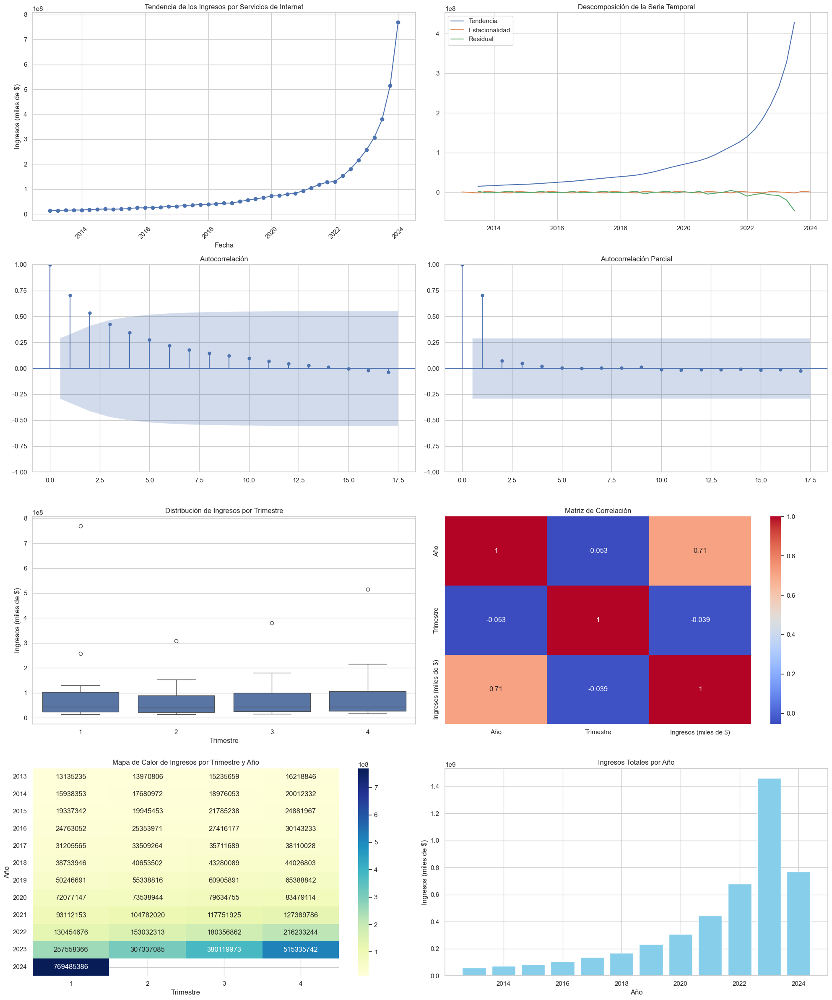

In [81]:

# Convertir las columnas 'Año' y 'Trimestre' a una columna de fecha
h15['Fecha'] = pd.to_datetime(h15['Año'].astype(str) + 'Q' + h15['Trimestre'].astype(str))

# Crear una figura principal con subplots
fig, axes = plt.subplots(4, 2, figsize=(20, 24))

# 1. Tendencias de Ingresos
axes[0, 0].plot(h15['Fecha'], h15['Ingresos (miles de $)'], marker='o')
axes[0, 0].set_title('Tendencia de los Ingresos por Servicios de Internet')
axes[0, 0].set_xlabel('Fecha')
axes[0, 0].set_ylabel('Ingresos (miles de $)')
axes[0, 0].tick_params(axis='x', rotation=45)

# 2. Descomposición de la serie temporal
result = seasonal_decompose(h15.set_index('Fecha')['Ingresos (miles de $)'], model='additive', period=4)
axes[0, 1].plot(result.trend.index, result.trend, label='Tendencia')
axes[0, 1].plot(result.seasonal.index, result.seasonal, label='Estacionalidad')
axes[0, 1].plot(result.resid.index, result.resid, label='Residual')
axes[0, 1].legend()
axes[0, 1].set_title('Descomposición de la Serie Temporal')

# 3. Autocorrelación y Autocorrelación Parcial
plot_acf(h15['Ingresos (miles de $)'], ax=axes[1, 0])
axes[1, 0].set_title('Autocorrelación')

plot_pacf(h15['Ingresos (miles de $)'], ax=axes[1, 1])
axes[1, 1].set_title('Autocorrelación Parcial')

# 4. Distribución de Ingresos por Trimestre
sns.boxplot(x='Trimestre', y='Ingresos (miles de $)', data=h15, ax=axes[2, 0])
axes[2, 0].set_title('Distribución de Ingresos por Trimestre')

# 5. Matriz de Correlación
corr_matrix = h15[['Año', 'Trimestre', 'Ingresos (miles de $)']].corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', ax=axes[2, 1])
axes[2, 1].set_title('Matriz de Correlación')

# 6. Mapa de Calor de Ingresos por Trimestre y Año
pivot_table = h15.pivot_table(values='Ingresos (miles de $)', index='Año', columns='Trimestre', aggfunc='sum')
sns.heatmap(pivot_table, annot=True, cmap='YlGnBu', fmt='.0f', ax=axes[3, 0])
axes[3, 0].set_title('Mapa de Calor de Ingresos por Trimestre y Año')

# 7. Ingresos Totales por Año
annual_totals = h15.groupby('Año')['Ingresos (miles de $)'].sum()
axes[3, 1].bar(annual_totals.index, annual_totals.values, color='skyblue')
axes[3, 1].set_title('Ingresos Totales por Año')
axes[3, 1].set_xlabel('Año')
axes[3, 1].set_ylabel('Ingresos (miles de $)')

plt.tight_layout()
plt.show()

**Conclusiones:**


Crecimiento sostenido: El sector de servicios de telefonia movil ha experimentado un crecimiento significativo, impulsado por la creciente demanda de los consumidores.
Estacionalidad marcada: Los ingresos presentan patrones estacionales claros, lo que sugiere la influencia de factores externos como campañas promocionales o eventos estacionales.
Madurez del mercado: La tasa de crecimiento podría estar disminuyendo, lo que podría indicar una cierta madurez del mercado.
Importancia de la estacionalidad: La estacionalidad es un factor importante a considerar al analizar los ingresos y al realizar pronósticos.


### **2.2 EDA Penetracion**


Este análisis exploratorio de datos (EDA) se centra en la hoja "Penetración" de un dataset que proporciona información sobre los accesos de telefonía móvil por cada 100 habitantes en Argentina. El análisis de la penetración del mercado de telefonía móvil es crucial para entender cómo ha evolucionado el uso de estos servicios en el país y cómo se compara con la población a lo largo de los años.

**Descripción de la Hoja**

La hoja "Penetración" del dataset está compuesta por las siguientes columnas:

- Año: Indica el año en el que se registraron los datos de accesos.
- Trimestre: Representa el trimestre del año en el que se reportaron los accesos (1 a 4).
- Accesos por cada 100 hab: Muestra la cantidad de accesos de telefonía móvil por cada 100 habitantes, reflejando la penetración del servicio en la población.
- Periodo: Indica el periodo correspondiente en un formato de texto más legible (por ejemplo, "Ene-Mar 2013").
Con 45 filas, esta hoja cubre un periodo significativo, permitiendo analizar cómo ha cambiado la penetración de la telefonía móvil a lo largo del tiempo.

**Objetivos del EDA**

Los objetivos principales del EDA son los siguientes:

1. Analizar la evolución de la penetración de la telefonía móvil a lo largo del tiempo: Identificar tendencias y patrones en la cantidad de accesos por cada 100 habitantes.

2. Evaluar el impacto de la penetración de la telefonía móvil en la sociedad: Explorar cómo el aumento o disminución de la penetración puede haber influido en el comportamiento y las necesidades de comunicación de la población.

3. Comparar la penetración con otros indicadores económicos y sociales: Analizar cómo la penetración de la telefonía móvil se relaciona con otros factores, como el crecimiento económico o cambios demográficos.

Estimar tendencias futuras: Basándonos en datos históricos, proyectar posibles futuros escenarios para la penetración de la telefonía móvil.

**Metodología y Procesos**

Visualización de tendencias: Utilizaremos gráficos de líneas para visualizar la evolución de los accesos por cada 100 habitantes a lo largo del tiempo y detectar patrones o tendencias.
Descomposición de series temporales: Emplearemos técnicas de descomposición para separar la serie temporal de accesos en componentes de tendencia, estacionalidad y ruido.
Análisis de correlación: Calcularemos y visualizaremos la matriz de correlación entre las variables del dataset para identificar posibles relaciones significativas con otros indicadores.
Análisis de distribución: Utilizaremos gráficos de densidad y boxplots para explorar la distribución de los accesos por trimestre y detectar valores atípicos o patrones estacionales.
Conclusiones Esperadas
Al finalizar el EDA, esperamos obtener una comprensión clara de cómo ha evolucionado la penetración de la telefonía móvil en Argentina a lo largo del tiempo. Anticipamos identificar tendencias significativas que puedan informar sobre el comportamiento futuro de la penetración del mercado. Además, esperamos descubrir correlaciones importantes con otros factores económicos y sociales, lo que proporcionará una visión más completa de cómo se ha desarrollado la telefonía móvil en el país. Estos hallazgos podrán servir como base para decisiones estratégicas y recomendaciones en el sector de las telecomunicaciones.

In [82]:

# Leer una hoja específica
h = df.parse(sheet_name='Penetracion')
h

,Año,Trimestre,Accesos por cada 100 hab,Periodo
0,2013,1,154.370000,Ene-Mar 2013
1,2013,2,156.000000,Abr-Jun 2013
2,2013,3,158.590000,Jul-Sept 2013
3,2013,4,159.370000,Oct-Dic 2013
4,2014,1,148.070000,Ene-Mar 2014
5,2014,2,143.000000,Abr-Jun 2014
6,2014,3,143.440000,Jul-Sept 2014
7,2014,4,142.600000,Oct-Dic 2014
8,2015,1,140.120000,Ene-Mar 2015
9,2015,2,138.940000,Abr-Jun 2015


In [83]:
# Obtener la forma de la hoja (número de filas y columnas)
print(h.shape)
# Obtener los nombres de las columnas
print(h.columns)

# Obtener los tipos de datos de cada columna
print(h.dtypes)

#Head del dataframe 

print(h.head(1))

(45, 4)
Index(['Año', 'Trimestre', 'Accesos por cada 100 hab', 'Periodo'], dtype='object')
Año                           int64
Trimestre                     int64
Accesos por cada 100 hab    float64
Periodo                      object
dtype: object
    Año  Trimestre  Accesos por cada 100 hab       Periodo
0  2013          1                    154.37  Ene-Mar 2013


<Figure size 640x480 with 0 Axes>

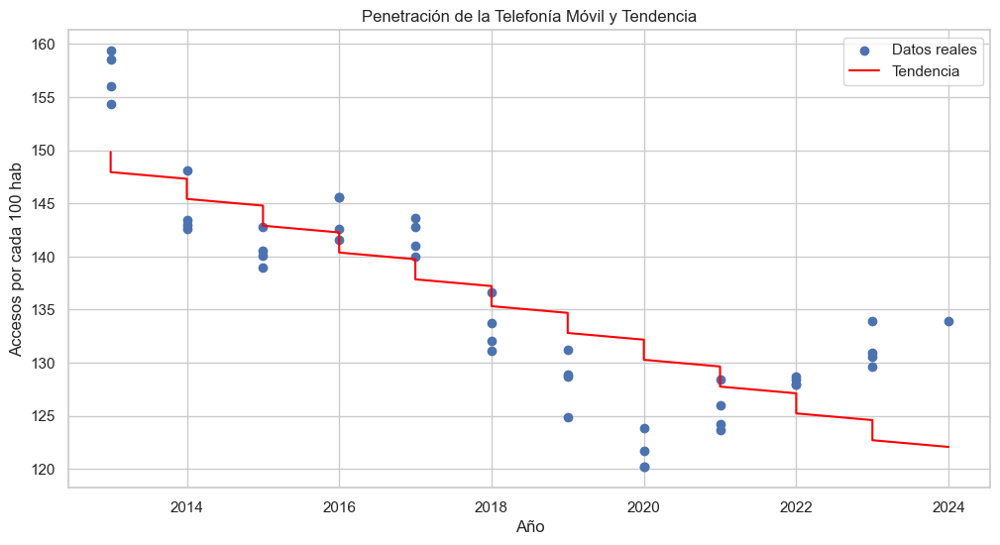

In [84]:

# 1. Evolución de la penetración de la telefonía móvil
ax1 = fig.add_subplot(221)
ax1.plot(h['Año'], h['Accesos por cada 100 hab'])
ax1.set_title('Evolución de la Penetración de la Telefonía Móvil')
ax1.set_xlabel('Año')
ax1.set_ylabel('Accesos por cada 100 hab')

# 2. Análisis de estacionalidad
ax2 = fig.add_subplot(222)
sns.boxplot(x='Trimestre', y='Accesos por cada 100 hab', data=h, ax=ax2)
ax2.set_title('Distribución de la Penetración por Trimestre')

# 3. Relación entre Penetración y Tasa de Crecimiento
h['Tasa_Crecimiento'] = h['Accesos por cada 100 hab'].pct_change()
ax3 = fig.add_subplot(223)
ax3.scatter(h['Accesos por cada 100 hab'], h['Tasa_Crecimiento'])
ax3.set_title('Relación entre Penetración y Tasa de Crecimiento')
ax3.set_xlabel('Accesos por cada 100 hab')
ax3.set_ylabel('Tasa de Crecimiento')

# 4. Matriz de Correlación
corr_matrix = h[['Año', 'Trimestre', 'Accesos por cada 100 hab', 'Tasa_Crecimiento']].corr()
ax4 = fig.add_subplot(224)
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', ax=ax4)
ax4.set_title('Matriz de Correlación')

plt.tight_layout()
plt.show()

# 5. Estimación de tendencias futuras
h['Tiempo'] = range(len(h))
slope, intercept, r_value, p_value, std_err = stats.linregress(h['Tiempo'], h['Accesos por cada 100 hab'])
line = slope * h['Tiempo'] + intercept

plt.figure(figsize=(12, 6))
plt.scatter(h['Año'], h['Accesos por cada 100 hab'], label='Datos reales')
plt.plot(h['Año'], line, color='red', label='Tendencia')
plt.title('Penetración de la Telefonía Móvil y Tendencia')
plt.xlabel('Año')
plt.ylabel('Accesos por cada 100 hab')
plt.legend()
plt.show()



**Conclusiones:**


Tendencia a la estabilización: A diferencia de un crecimiento constante, la penetración de la telefonía móvil parece haber alcanzado un punto de saturación o estabilización. La línea de tendencia, que representa el comportamiento general de los datos, muestra una disminución gradual a lo largo del tiempo.
Fluctuaciones estacionales: Los datos reales, representados por los puntos, muestran una considerable variabilidad de un año a otro y, posiblemente, a lo largo de los trimestres (aunque no se especifica en el gráfico). Estas fluctuaciones podrían atribuirse a factores estacionales como campañas promocionales, eventos especiales o cambios en las condiciones económicas.
Plataforma madura: La estabilización de la penetración sugiere que la telefonía móvil se ha convertido en una tecnología ampliamente adoptada en la población analizada. Esto indica que la mayoría de los habitantes ya tienen acceso a este servicio.
Posibles factores limitantes: La disminución gradual de la tendencia podría indicar la existencia de factores que limitan un mayor crecimiento, como la saturación del mercado, cambios en los hábitos de consumo (por ejemplo, mayor uso de servicios de voz sobre IP) o restricciones económicas.


### **2.3 EDA Accesos**



Este análisis exploratorio de datos (EDA) se enfoca en la hoja "Accesos" de un dataset que contiene información sobre los accesos a servicios de telefonía móvil en Argentina, desglosados por tipo de servicio (prepago y pospago) y su estado operativo. Este análisis es esencial para comprender la dinámica del mercado de telefonía móvil y cómo los usuarios eligen sus planes de servicio a lo largo del tiempo.

**Descripción de la Hoja**

La hoja "Accesos" está compuesta por las siguientes columnas:

- Año: Indica el año en el que se registraron los datos de accesos.
- Trimestre: Representa el trimestre del año en el que se reportaron los accesos (1 a 4).
- Total de accesos pospago: Muestra la cantidad de accesos de telefonía móvil bajo planes pospago.
- Total de accesos prepago: Indica la cantidad de accesos de telefonía móvil bajo planes prepago.
- Total de accesos operativos: Representa el total de accesos activos, combinando tanto los accesos prepago como pospago.
- Periodo: Indica el periodo correspondiente en un formato de texto más legible (por ejemplo, "Ene-Mar 2013").
Con 45 filas, esta hoja cubre un amplio periodo de tiempo, permitiendo analizar la evolución y las preferencias de los consumidores entre los servicios prepago y pospago.

**Objetivos del EDA**

Los objetivos principales del EDA son los siguientes:

1. Analizar la evolución de los accesos de telefonía móvil a lo largo del tiempo: Identificar tendencias y patrones en la cantidad de accesos prepago y pospago.

2. Evaluar la preferencia de los usuarios entre los servicios prepago y pospago: Comparar cómo ha cambiado la proporción de usuarios que eligen prepago versus pospago.

3. Estudiar la operatividad de los accesos: Analizar la relación entre los accesos operativos y el total de accesos, entendiendo el uso real de los servicios de telefonía móvil.

4. Identificar cambios en el mercado de telefonía móvil: Detectar momentos clave en el tiempo en los que puede haber habido cambios significativos en la dinámica del mercado.

**Metodología y Procesos**

Para realizar este EDA, seguiremos los siguientes pasos:


Análisis de tendencias temporales: Utilizaremos gráficos de líneas y de barras para visualizar cómo han cambiado los accesos prepago y pospago a lo largo del tiempo, así como los accesos operativos totales.
Descomposición de series temporales: Separaremos las series temporales de accesos en componentes de tendencia, estacionalidad y ruido para entender mejor sus patrones.
Análisis de proporción de servicios: Calcularemos y visualizaremos las proporciones de accesos prepago y pospago a lo largo del tiempo para identificar cambios en las preferencias de los consumidores.
Análisis de correlación: Calcularemos la correlación entre los tipos de accesos para entender mejor su relación e interacción en el mercado.
Conclusiones Esperadas

Al finalizar el EDA, esperamos obtener una comprensión clara de cómo han evolucionado los accesos de telefonía móvil en Argentina, tanto en términos de número total como de la proporción entre servicios prepago y pospago. Anticipamos identificar tendencias significativas que podrían sugerir cambios futuros en las preferencias del mercado y en la operatividad de los servicios de telefonía móvil. Estos hallazgos proporcionarán información valiosa para las decisiones estratégicas en el sector de las telecomunicaciones.

In [85]:

# Leer una hoja específica
h = df.parse(sheet_name='Accesos')
h

,Año,Trimestre,Total de accesos pospago,Total de accesos prepago,Total de accesos operativos,Periodo
0,2013,1,7.761349e+06,5.714761e+07,64908957,Ene-Mar 2013
1,2013,2,7.769110e+06,5.800482e+07,65773932,Abr-Jun 2013
2,2013,3,8.002183e+06,5.904891e+07,67051092,Jul-Sept 2013
3,2013,4,8.674516e+06,5.889452e+07,67569032,Oct-Dic 2013
4,2014,1,8.224482e+06,5.472509e+07,62949571,Ene-Mar 2013
5,2014,2,7.953775e+06,5.300986e+07,60963640,Abr-Jun 2014
6,2014,3,8.214424e+06,5.310204e+07,61316467,Jul-Sept 2014
7,2014,4,8.027505e+06,5.309333e+07,61120835,Oct-Dic 2014
8,2015,1,7.747230e+06,5.247463e+07,60221863,Ene-Mar 2015
9,2015,2,7.633527e+06,5.224194e+07,59875466,Abr-Jun 2015


In [86]:
# Obtener la forma de la hoja (número de filas y columnas)
print(h.shape)
# Obtener los nombres de las columnas
print(h.columns)

# Obtener los tipos de datos de cada columna
print(h.dtypes)

#Head del dataframe 

print(h.head(1))

(45, 6)
Index(['Año', 'Trimestre', 'Total de accesos pospago',
       'Total de accesos prepago', 'Total de accesos operativos', 'Periodo'],
      dtype='object')
Año                              int64
Trimestre                        int64
Total de accesos pospago       float64
Total de accesos prepago       float64
Total de accesos operativos      int64
Periodo                         object
dtype: object
    Año  Trimestre  Total de accesos pospago  Total de accesos prepago  \
0  2013          1                 7761349.0                57147608.0   

   Total de accesos operativos       Periodo  
0                     64908957  Ene-Mar 2013  


/var/folders/56/ng1477v167b0_8l7x8rdnw_r0000gn/T/ipykernel_87221/2411759818.py:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  h['Fecha'] = pd.to_datetime(h['Año'].astype(str) + '-Q' + h['Trimestre'].astype(str))


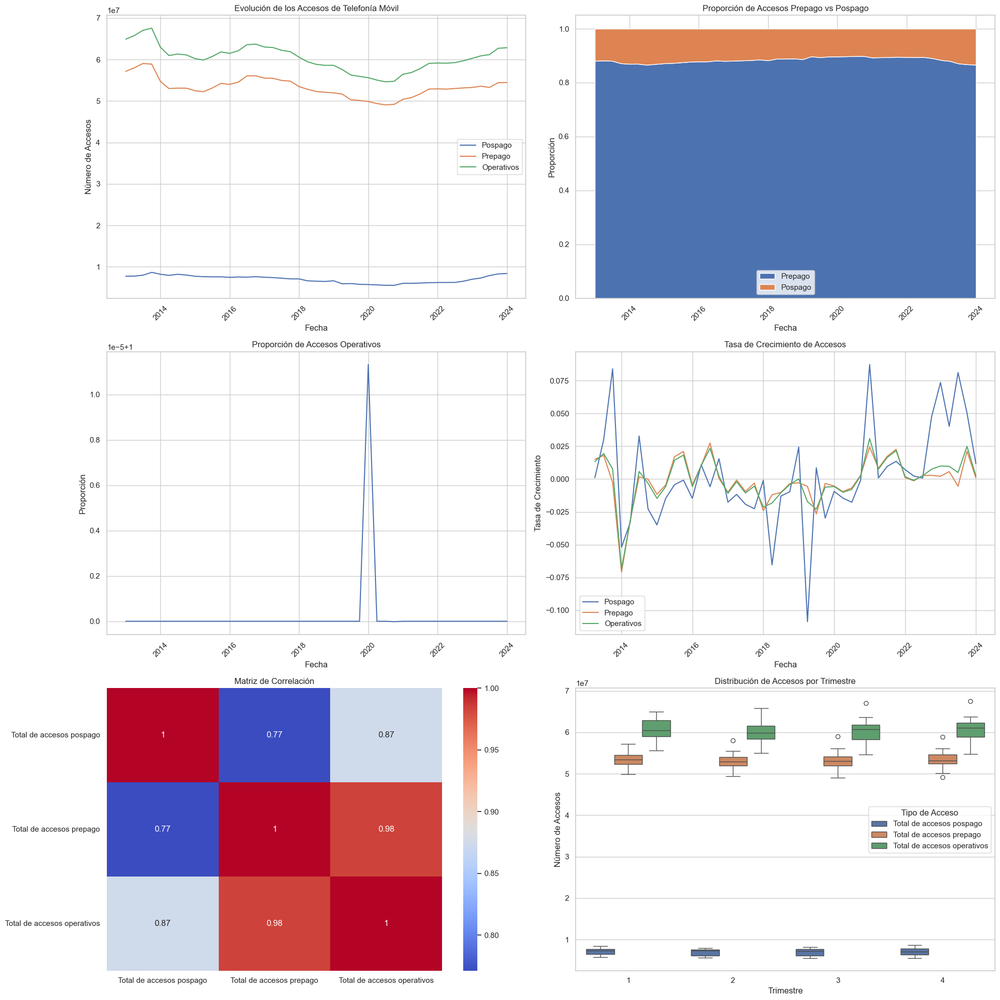

       Total de accesos pospago  Total de accesos prepago  \
count              4.500000e+01              4.500000e+01   
mean               7.043168e+06              5.332569e+07   
std                8.912759e+05              2.366603e+06   
min                5.556299e+06              4.906016e+07   
25%                6.231309e+06              5.211002e+07   
50%                7.272585e+06              5.310204e+07   
75%                7.747230e+06              5.455741e+07   
max                8.674516e+06              5.904891e+07   

       Total de accesos operativos  
count                 4.500000e+01  
mean                  6.036887e+07  
std                   3.106018e+06  
min                   5.461989e+07  
25%                   5.860644e+07  
50%                   6.057180e+07  
75%                   6.223081e+07  
max                   6.756903e+07  


In [87]:


# Ignoramos la columna 'Periodo' y nos enfocamos en 'Año' y 'Trimestre'
h['Fecha'] = pd.to_datetime(h['Año'].astype(str) + '-Q' + h['Trimestre'].astype(str))

# Crear la figura principal con subplots
fig = plt.figure(figsize=(20, 20))

# 1. Evolución de los accesos de telefonía móvil
ax1 = fig.add_subplot(321)
ax1.plot(h['Fecha'], h['Total de accesos pospago'], label='Pospago')
ax1.plot(h['Fecha'], h['Total de accesos prepago'], label='Prepago')
ax1.plot(h['Fecha'], h['Total de accesos operativos'], label='Operativos')
ax1.set_title('Evolución de los Accesos de Telefonía Móvil')
ax1.set_xlabel('Fecha')
ax1.set_ylabel('Número de Accesos')
ax1.legend()
plt.xticks(rotation=45)

# 2. Proporción de accesos prepago vs pospago
ax2 = fig.add_subplot(322)
h['Proporcion_Prepago'] = h['Total de accesos prepago'] / (h['Total de accesos prepago'] + h['Total de accesos pospago'])
h['Proporcion_Pospago'] = 1 - h['Proporcion_Prepago']
ax2.stackplot(h['Fecha'], h['Proporcion_Prepago'], h['Proporcion_Pospago'], labels=['Prepago', 'Pospago'])
ax2.set_title('Proporción de Accesos Prepago vs Pospago')
ax2.set_xlabel('Fecha')
ax2.set_ylabel('Proporción')
ax2.legend()
plt.xticks(rotation=45)

# 3. Operatividad de los accesos
ax3 = fig.add_subplot(323)
h['Total_Accesos'] = h['Total de accesos prepago'] + h['Total de accesos pospago']
h['Proporcion_Operativos'] = h['Total de accesos operativos'] / h['Total_Accesos']
ax3.plot(h['Fecha'], h['Proporcion_Operativos'])
ax3.set_title('Proporción de Accesos Operativos')
ax3.set_xlabel('Fecha')
ax3.set_ylabel('Proporción')
plt.xticks(rotation=45)

# 4. Cambios en el mercado (Tasa de crecimiento)
ax4 = fig.add_subplot(324)
h['Tasa_Crecimiento_Pospago'] = h['Total de accesos pospago'].pct_change()
h['Tasa_Crecimiento_Prepago'] = h['Total de accesos prepago'].pct_change()
h['Tasa_Crecimiento_Operativos'] = h['Total de accesos operativos'].pct_change()
ax4.plot(h['Fecha'], h['Tasa_Crecimiento_Pospago'], label='Pospago')
ax4.plot(h['Fecha'], h['Tasa_Crecimiento_Prepago'], label='Prepago')
ax4.plot(h['Fecha'], h['Tasa_Crecimiento_Operativos'], label='Operativos')
ax4.set_title('Tasa de Crecimiento de Accesos')
ax4.set_xlabel('Fecha')
ax4.set_ylabel('Tasa de Crecimiento')
ax4.legend()
plt.xticks(rotation=45)

# 5. Correlación entre variables
ax5 = fig.add_subplot(325)
corr_matrix = h[['Total de accesos pospago', 'Total de accesos prepago', 'Total de accesos operativos']].corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', ax=ax5)
ax5.set_title('Matriz de Correlación')

# 6. Distribución de accesos por trimestre
ax6 = fig.add_subplot(326)
h_melted = pd.melt(h, id_vars=['Año', 'Trimestre'], value_vars=['Total de accesos pospago', 'Total de accesos prepago', 'Total de accesos operativos'])
sns.boxplot(x='Trimestre', y='value', hue='variable', data=h_melted, ax=ax6)
ax6.set_title('Distribución de Accesos por Trimestre')
ax6.set_xlabel('Trimestre')
ax6.set_ylabel('Número de Accesos')
plt.legend(title='Tipo de Acceso')

plt.tight_layout()
plt.show()

# Estadísticas descriptivas
print(h[['Total de accesos pospago', 'Total de accesos prepago', 'Total de accesos operativos']].describe())

**Conclusiones:**


Distribución de los Accesos:

Dominancia del prepago: Los accesos prepago representan una proporción significativamente mayor que los pospago, lo que indica una preferencia por este tipo de servicio entre los usuarios.
Estabilidad en el tiempo: La proporción de accesos prepago y pospago se mantiene relativamente estable a lo largo del período analizado.
Tasa de Crecimiento:

Fluctuaciones: La tasa de crecimiento de los accesos presenta fluctuaciones significativas a lo largo del tiempo, lo que sugiere la influencia de factores externos como cambios en las tarifas, promociones o condiciones económicas.
Tendencia a la estabilización: A pesar de las fluctuaciones, la tendencia general de la tasa de crecimiento parece ser hacia la estabilización, lo que coincide con la observación de una estabilidad en el total de accesos.
Distribución por Trimestre:

Estacionalidad: La distribución de los accesos por trimestre muestra patrones estacionales claros, con picos en ciertos trimestres y valles en otros. Esto sugiere que la adquisición de nuevos servicios de telefonía móvil está influenciada por factores estacionales.
Matriz de Correlación:

Alta correlación: La alta correlación entre las variables confirma que el total de accesos operativos es la suma de los accesos prepago y pospago.


# **3. Telefonia Fija**

Trabajamos tambien con este dataframe, por que nos solicitaron comparar las tecnologias de comunicacion, veremos sus ingresos y su accesos a la poblacion para saber y porder hacer una comparacion con internet. 

In [5]:

# Ruta del Archivo
file_path = '/Users/felipeamezquita/Library/Mobile Documents/com~apple~CloudDocs/Documents/HENRY/PROYECTO INDIVIDUAL/EJERCICIO 2/DATA/DATA SECUNDARIA/telefonia_fija.xlsx'

# Cargar el archivo Excel usando openpyxl
df = pd.ExcelFile(file_path, engine='openpyxl')


In [6]:
# Obtener la lista de hojas en el archivo
hojas = df.sheet_names

# Imprimir la lista de hojas
print(hojas)

['Fija_prov_tipo', 'Fija_accesos_tot', 'Fija_penetracion_prov', 'Fija_penetracion_tot', 'Fija_ingresos']


### **3.1 EDA Fija Ingresos**

**Descripción de las Columnas**

- Año: Representa el año en el que se registraron los ingresos. Es un valor entero que facilita la agrupación y comparación anual.

- Trimestre: Indica el trimestre del año en que se registraron los ingresos. Este valor entero permite un análisis más detallado de la estacionalidad y las variaciones intraanuales.

- Ingresos (miles de $): Muestra el valor de los ingresos generados por los servicios de telefonía fija, expresado en miles de pesos. Es un valor numérico flotante crucial para el análisis financiero.

- Fecha: Campo de tipo datetime que marca el inicio del trimestre, proporcionando una referencia temporal precisa para cada registro.

**Objetivos del EDA**

1. Analizar la evolución de los ingresos: Identificar tendencias y patrones en los ingresos generados por la telefonía fija a lo largo del tiempo.

2. Evaluar la estacionalidad: Detectar variaciones estacionales y patrones cíclicos en los ingresos trimestrales.

3. Comparar ingresos anuales: Comparar los ingresos anuales para entender el crecimiento o declive en el sector de la telefonía fija.

4. Identificar factores externos: Explorar posibles correlaciones con eventos externos, como cambios regulatorios o tecnológicos, que podrían haber influido en los ingresos.

**Metodología y Procesos**

Carga y Preparación de Datos: Importar el conjunto de datos y realizar una limpieza inicial, asegurando que no haya valores nulos o datos atípicos que puedan distorsionar el análisis.
Análisis Descriptivo: Calcular estadísticas descriptivas básicas, como medias, medianas y desviaciones estándar, para obtener una comprensión preliminar de los datos.
Visualización de Datos: Utilizar gráficos de líneas para visualizar la evolución de los ingresos a lo largo del tiempo y gráficos de barras para comparar los ingresos por trimestre.
Análisis de Tendencias: Aplicar técnicas de suavizado para identificar tendencias a largo plazo en los ingresos.
Evaluación de Estacionalidad: Utilizar diagramas de caja para identificar patrones estacionales en los ingresos trimestrales.
Conclusiones Esperadas

Se espera que el EDA revele patrones claros en los ingresos de la telefonía fija, destacando períodos de crecimiento y declive. Es probable que se identifiquen patrones estacionales, como incrementos o disminuciones durante ciertos trimestres. También se anticipa que el análisis pueda sugerir la influencia de factores externos en los ingresos, proporcionando información valiosa para la toma de decisiones estratégicas en el sector de la telefonía fija.

In [89]:

# Leer una hoja específica
h15 = df.parse(sheet_name='Fija_ingresos')
h15

,Año,Trimestre,Ingresos (miles de $)
0,2014,1,2.916072e+06
1,2014,2,2.974865e+06
2,2014,3,3.105462e+06
3,2014,4,3.339691e+06
4,2015,1,3.260125e+06
5,2015,2,3.425518e+06
6,2015,3,3.590883e+06
7,2015,4,3.815364e+06
8,2016,1,4.198260e+06
9,2016,2,4.718770e+06


In [92]:
# Obtener la forma de la hoja (número de filas y columnas)
print(h15.shape)
# Obtener los nombres de las columnas
print(h15.columns)

# Obtener los tipos de datos de cada columna
print(h15.dtypes)

#Head del dataframe 

print(h15.head(1))

(41, 4)
Index(['Año', 'Trimestre', 'Ingresos (miles de $)', 'Fecha'], dtype='object')
Año                               int64
Trimestre                         int64
Ingresos (miles de $)           float64
Fecha                    datetime64[ns]
dtype: object
    Año  Trimestre  Ingresos (miles de $)      Fecha
0  2014          1            2916071.754 2014-01-01


/var/folders/56/ng1477v167b0_8l7x8rdnw_r0000gn/T/ipykernel_87221/865632829.py:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  h15['Fecha'] = pd.to_datetime(h15['Año'].astype(str) + 'Q' + h15['Trimestre'].astype(str))


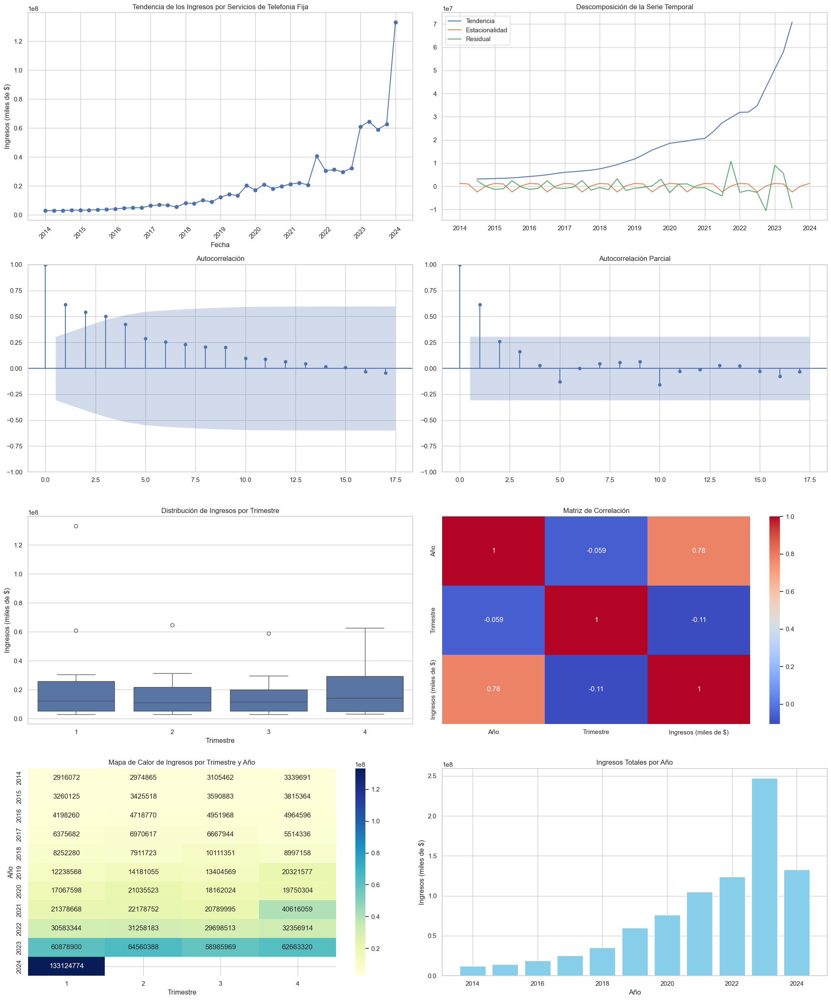

In [91]:

# Convertir las columnas 'Año' y 'Trimestre' a una columna de fecha
h15['Fecha'] = pd.to_datetime(h15['Año'].astype(str) + 'Q' + h15['Trimestre'].astype(str))

# Crear una figura principal con subplots
fig, axes = plt.subplots(4, 2, figsize=(20, 24))

# 1. Tendencias de Ingresos
axes[0, 0].plot(h15['Fecha'], h15['Ingresos (miles de $)'], marker='o')
axes[0, 0].set_title('Tendencia de los Ingresos por Servicios de Telefonia Fija')
axes[0, 0].set_xlabel('Fecha')
axes[0, 0].set_ylabel('Ingresos (miles de $)')
axes[0, 0].tick_params(axis='x', rotation=45)

# 2. Descomposición de la serie temporal
result = seasonal_decompose(h15.set_index('Fecha')['Ingresos (miles de $)'], model='additive', period=4)
axes[0, 1].plot(result.trend.index, result.trend, label='Tendencia')
axes[0, 1].plot(result.seasonal.index, result.seasonal, label='Estacionalidad')
axes[0, 1].plot(result.resid.index, result.resid, label='Residual')
axes[0, 1].legend()
axes[0, 1].set_title('Descomposición de la Serie Temporal')

# 3. Autocorrelación y Autocorrelación Parcial
plot_acf(h15['Ingresos (miles de $)'], ax=axes[1, 0])
axes[1, 0].set_title('Autocorrelación')

plot_pacf(h15['Ingresos (miles de $)'], ax=axes[1, 1])
axes[1, 1].set_title('Autocorrelación Parcial')

# 4. Distribución de Ingresos por Trimestre
sns.boxplot(x='Trimestre', y='Ingresos (miles de $)', data=h15, ax=axes[2, 0])
axes[2, 0].set_title('Distribución de Ingresos por Trimestre')

# 5. Matriz de Correlación
corr_matrix = h15[['Año', 'Trimestre', 'Ingresos (miles de $)']].corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', ax=axes[2, 1])
axes[2, 1].set_title('Matriz de Correlación')

# 6. Mapa de Calor de Ingresos por Trimestre y Año
pivot_table = h15.pivot_table(values='Ingresos (miles de $)', index='Año', columns='Trimestre', aggfunc='sum')
sns.heatmap(pivot_table, annot=True, cmap='YlGnBu', fmt='.0f', ax=axes[3, 0])
axes[3, 0].set_title('Mapa de Calor de Ingresos por Trimestre y Año')

# 7. Ingresos Totales por Año
annual_totals = h15.groupby('Año')['Ingresos (miles de $)'].sum()
axes[3, 1].bar(annual_totals.index, annual_totals.values, color='skyblue')
axes[3, 1].set_title('Ingresos Totales por Año')
axes[3, 1].set_xlabel('Año')
axes[3, 1].set_ylabel('Ingresos (miles de $)')

plt.tight_layout()
plt.show()

**Conclusiones**


Tendencia de los ingresos por Servicios de Telefonía Fija:

Hay un claro aumento en los ingresos a partir del 2021, lo que sugiere un crecimiento significativo en este sector durante los últimos años. Esta tendencia ascendente podría estar relacionada con cambios en la demanda de servicios, avances tecnológicos o ajustes en las tarifas.

Descomposición de la Serie Temporal:

La serie temporal de ingresos muestra una tendencia creciente, mientras que la estacionalidad no parece ser significativa. La componente residual muestra variabilidad, indicando factores no explicados por la tendencia o la estacionalidad.

Autocorrelación y Autocorrelación Parcial:

Los gráficos de autocorrelación y autocorrelación parcial sugieren que hay una correlación positiva en las primeras diferencias, lo que puede indicar la presencia de una tendencia en la serie temporal.

Distribución de Ingresos por Trimestre:

El gráfico de cajas muestra que la mediana de ingresos parece ser consistente a través de los trimestres, pero hay presencia de valores atípicos, especialmente en el trimestre 4, lo que podría indicar mayores ingresos o transacciones inusuales en este periodo.

Matriz de Correlación:

La correlación entre 'Año' y 'Ingresos (miles de $)' es fuerte y positiva (0.78), lo que confirma que los ingresos han aumentado con el tiempo. La correlación negativa entre 'Trimestre' e 'Ingresos (miles de $)' (-0.11) sugiere una débil relación entre estos.

Mapa de Calor de Ingresos por Trimestre y Año:

Este mapa confirma visualmente la tendencia de crecimiento en los ingresos, mostrando colores más oscuros (más ingresos) en años recientes.

Ingresos Totales por Año:

La barra gráfica evidencia un crecimiento progresivo y notable de los ingresos totales año tras año, destacándose el aumento significativo en los últimos años, lo que podría estar influido por factores económicos o estrategias de negocio exitosas.

Conclusiones Generales

Crecimiento Sostenido: La telefonía fija ha experimentado un crecimiento sostenido en ingresos, destacándose un salto significativo en los últimos años.

Posibles Factores: Cambios en la regulación, avances tecnológicos, y una mayor adopción de servicios de telecomunicación debido a cambios en el comportamiento del consumidor (como el aumento del teletrabajo) podrían ser factores contribuyentes.

Estacionalidad Limitada: Aunque hay variaciones trimestrales, la estacionalidad no parece ser un factor dominante en la variación de ingresos.

Planificación Estratégica: Para futuras estrategias y planificaciones, sería beneficioso enfocarse en mantener y expandir los factores que han contribuido al crecimiento en 2021 y 2022.


### **3.2 Fija_penetracion_prov**

**Descripción de la Hoja**

La hoja "Fija_penetracion_prov" forma parte de un DataFrame más amplio que analiza diversos aspectos de la telefonía fija. En esta hoja en particular, se registra la penetración de la telefonía fija en diferentes provincias, medida como el número de accesos por cada 100 habitantes y por cada 100 hogares. La hoja contiene datos desglosados por año y trimestre, lo que permite analizar tendencias temporales y geográficas en la penetración de estos servicios.

**Descripción de las Columnas**

- Año (int64): Año en que se registraron los datos.
- Trimestre (int64): Trimestre del año correspondiente.
- Provincia (object): Nombre de la provincia donde se midieron los datos.
- Accesos telefonía fija por cada 100 hab (float64): Número de accesos a telefonía fija por cada 100 habitantes en la provincia.
- Accesos telefonía fija por cada 100 hogares (float64): Número de accesos a telefonía fija por cada 100 hogares en la provincia.

**Objetivos del EDA**

1. Análisis Temporal: Evaluar cómo ha evolucionado la penetración de la telefonía fija a lo largo del tiempo, tanto a nivel nacional como provincial.

2. Análisis Geográfico: Comparar la penetración entre diferentes provincias para identificar patrones o disparidades regionales.

3. Correlación entre Indicadores: Estudiar la relación entre los accesos por habitante y por hogar para comprender mejor cómo estos dos indicadores se influencian mutuamente.

**Metodología y Procesos**


Análisis Descriptivo: Generar estadísticas descriptivas para obtener una visión general de los rangos y distribuciones de los datos.
Visualización de Datos: Utilizar gráficos como series temporales, mapas de calor por provincia, y diagramas de dispersión para visualizar las tendencias y las correlaciones.
Análisis de Tendencia y Estacionalidad: Aplicar técnicas de descomposición de series temporales para identificar tendencias y patrones estacionales en los datos.
Comparación Geográfica: Realizar análisis comparativos para explorar diferencias en la penetración de la telefonía fija entre provincias y evaluar posibles factores socioeconómicos influyentes.

**Conclusiones Esperadas**

Identificar Tendencias: Se espera descubrir si la penetración de la telefonía fija ha aumentado, disminuido o se ha mantenido estable en los últimos años.
Detección de Disparidades Regionales: Es probable que se identifiquen variaciones significativas en la penetración de la telefonía fija entre las provincias, lo que puede sugerir áreas de enfoque para políticas de desarrollo de infraestructura.
Relación entre Indicadores: Podría encontrarse una correlación positiva entre los accesos por habitante y por hogar, lo que indicaría consistencia en la adopción de la tecnología en los diferentes contextos domésticos.
Implicaciones para la Planificación: Las conclusiones podrían proporcionar información valiosa para los planificadores y reguladores sobre cómo optimizar los recursos para mejorar la accesibilidad de la telefonía fija en áreas menos penetradas.

In [93]:

# Leer una hoja específica
h = df.parse(sheet_name='Fija_penetracion_prov')
h

,Año,Trimestre,Provincia,Accesos telefonía fija por cada 100 hab,Accesos telefonía fija por cada 100 hogares
0,2014,1,Buenos Aires,26.717541,85.264880
1,2014,1,Capital Federal,52.663108,128.570341
2,2014,1,Catamarca,10.034940,39.446596
3,2014,1,Chaco,9.094093,34.022053
4,2014,1,Chubut,17.657914,57.594630
...,...,...,...,...,...
979,2024,1,Santa Cruz,5.437003,18.275732
980,2024,1,Santa Fe,16.460137,52.349360
981,2024,1,Santiago del Estero,6.178053,24.895274
982,2024,1,Tierra del Fuego,8.883790,29.969899


In [94]:
# Obtener la forma de la hoja (número de filas y columnas)
print(h.shape)
# Obtener los nombres de las columnas
print(h.columns)

# Obtener los tipos de datos de cada columna
print(h.dtypes)

#Head del dataframe 

print(h.head(1))

(984, 5)
Index(['Año', 'Trimestre', 'Provincia',
       'Accesos telefonía fija por cada 100 hab',
       'Accesos telefonía fija por cada 100 hogares'],
      dtype='object')
Año                                              int64
Trimestre                                        int64
Provincia                                       object
Accesos telefonía fija por cada 100 hab        float64
Accesos telefonía fija por cada 100 hogares    float64
dtype: object
    Año  Trimestre     Provincia  Accesos telefonía fija por cada 100 hab  \
0  2014          1  Buenos Aires                                26.717541   

   Accesos telefonía fija por cada 100 hogares  
0                                     85.26488  


/var/folders/56/ng1477v167b0_8l7x8rdnw_r0000gn/T/ipykernel_87221/1009706391.py:7: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  h_national['Fecha'] = pd.to_datetime(h_national['Año'].astype(str) + '-Q' + h_national['Trimestre'].astype(str))


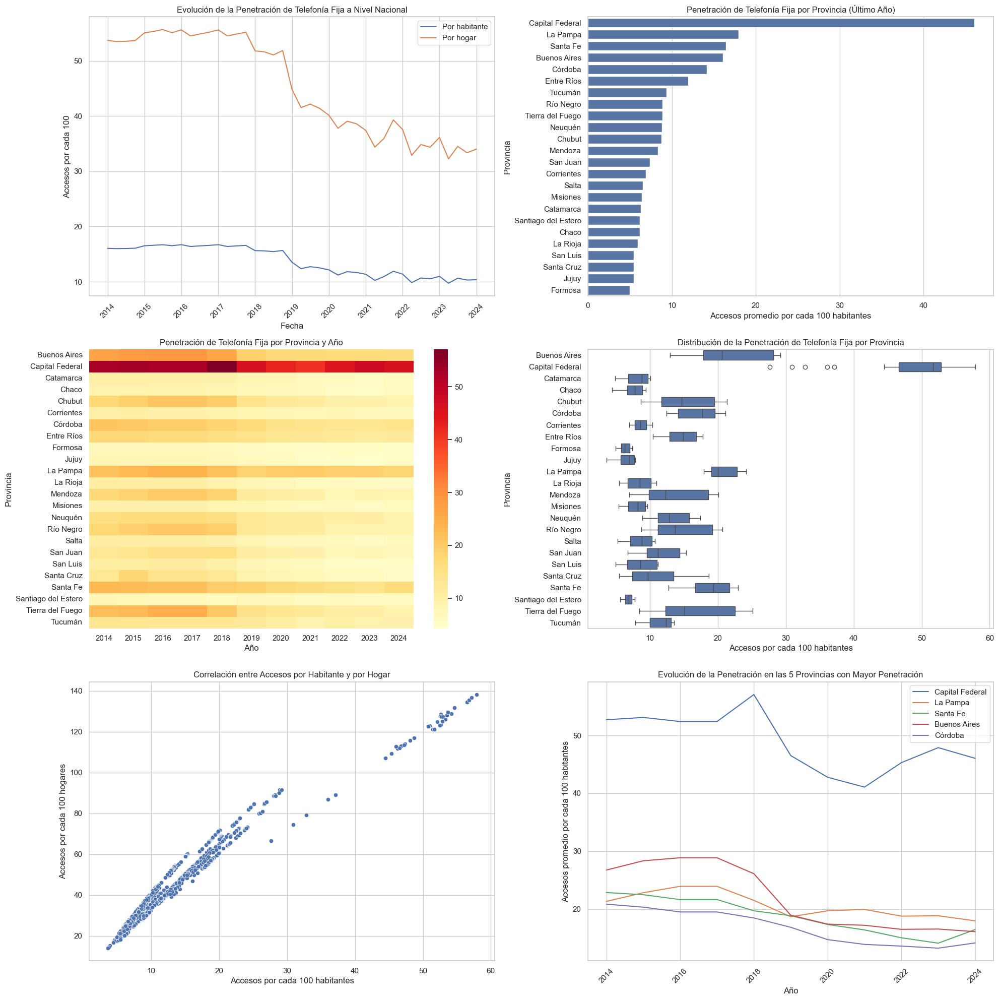

       Accesos telefonía fija por cada 100 hab  \
count                               984.000000   
mean                                 13.714878   
std                                   9.288965   
min                                   3.588433   
25%                                   7.689880   
50%                                  10.755298   
75%                                  17.511420   
max                                  57.859352   

       Accesos telefonía fija por cada 100 hogares  
count                                   984.000000  
mean                                     45.494804  
std                                      22.372130  
min                                      14.032975  
25%                                      29.434952  
50%                                      38.731433  
75%                                      56.989474  
max                                     138.277049  

Correlación entre accesos por habitante y por hogar:
                  

In [98]:


# Crear la figura principal con subplots
fig = plt.figure(figsize=(20, 20))

# 1. Evolución temporal de la penetración a nivel nacional
ax1 = fig.add_subplot(321)
h_national = h.groupby(['Año', 'Trimestre'])[['Accesos telefonía fija por cada 100 hab', 'Accesos telefonía fija por cada 100 hogares']].mean().reset_index()
h_national['Fecha'] = pd.to_datetime(h_national['Año'].astype(str) + '-Q' + h_national['Trimestre'].astype(str))
ax1.plot(h_national['Fecha'], h_national['Accesos telefonía fija por cada 100 hab'], label='Por habitante')
ax1.plot(h_national['Fecha'], h_national['Accesos telefonía fija por cada 100 hogares'], label='Por hogar')
ax1.set_title('Evolución de la Penetración de Telefonía Fija a Nivel Nacional')
ax1.set_xlabel('Fecha')
ax1.set_ylabel('Accesos por cada 100')
ax1.legend()
plt.xticks(rotation=45)

# 2. Comparación de penetración entre provincias (último año)
ax2 = fig.add_subplot(322)
h_last = h[h['Año'] == h['Año'].max()]
h_last_mean = h_last.groupby('Provincia')['Accesos telefonía fija por cada 100 hab'].mean().sort_values(ascending=False)
sns.barplot(x=h_last_mean.values, y=h_last_mean.index, ax=ax2)
ax2.set_title('Penetración de Telefonía Fija por Provincia (Último Año)')
ax2.set_xlabel('Accesos promedio por cada 100 habitantes')
ax2.set_ylabel('Provincia')

# 3. Mapa de calor de la penetración por provincia y año
ax3 = fig.add_subplot(323)
h_pivot = h.pivot_table(values='Accesos telefonía fija por cada 100 hab', index='Provincia', columns='Año', aggfunc='mean')
sns.heatmap(h_pivot, cmap='YlOrRd', ax=ax3)
ax3.set_title('Penetración de Telefonía Fija por Provincia y Año')
ax3.set_ylabel('Provincia')
ax3.set_xlabel('Año')

# 4. Distribución de la penetración por provincia
ax4 = fig.add_subplot(324)
sns.boxplot(x='Accesos telefonía fija por cada 100 hab', y='Provincia', data=h, ax=ax4)
ax4.set_title('Distribución de la Penetración de Telefonía Fija por Provincia')
ax4.set_xlabel('Accesos por cada 100 habitantes')

# 5. Correlación entre accesos por habitante y por hogar
ax5 = fig.add_subplot(325)
sns.scatterplot(x='Accesos telefonía fija por cada 100 hab', y='Accesos telefonía fija por cada 100 hogares', data=h, ax=ax5)
ax5.set_title('Correlación entre Accesos por Habitante y por Hogar')
ax5.set_xlabel('Accesos por cada 100 habitantes')
ax5.set_ylabel('Accesos por cada 100 hogares')

# 6. Evolución temporal de la penetración para las 5 provincias con mayor penetración
# 6. Evolución temporal de la penetración para las 5 provincias con mayor penetración
ax6 = fig.add_subplot(326)
top_5_provinces = h_last_mean.head().index.tolist()
h_top5 = h[h['Provincia'].isin(top_5_provinces)]

for province in top_5_provinces:
    province_data = h_top5[h_top5['Provincia'] == province]
    grouped_data = province_data.groupby('Año')['Accesos telefonía fija por cada 100 hab'].mean().reset_index()
    ax6.plot(grouped_data['Año'], grouped_data['Accesos telefonía fija por cada 100 hab'], label=province)

ax6.set_title('Evolución de la Penetración en las 5 Provincias con Mayor Penetración')
ax6.set_xlabel('Año')
ax6.set_ylabel('Accesos promedio por cada 100 habitantes')
ax6.legend()
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

# Estadísticas descriptivas
print(h[['Accesos telefonía fija por cada 100 hab', 'Accesos telefonía fija por cada 100 hogares']].describe())

# Correlación entre accesos por habitante y por hogar
print("\nCorrelación entre accesos por habitante y por hogar:")
print(h[['Accesos telefonía fija por cada 100 hab', 'Accesos telefonía fija por cada 100 hogares']].corr())

**Conclusiones:**

1. Tendencia nacional decreciente: La penetración de telefonía fija a nivel nacional ha disminuido significativamente desde 2014, tanto por habitante como por hogar.

2. Disparidad regional: Existe una gran variación en la penetración de telefonía fija entre las distintas provincias. Capital Federal tiene la mayor penetración, seguida por La Pampa y Santa Fe, mientras que Formosa y Jujuy tienen la menor.

3. Evolución temporal por provincia: El mapa de calor muestra que la mayoría de las provincias han experimentado una disminución en la penetración a lo largo de los años, con algunas manteniendo niveles más altos que otras.

4. Distribución por provincia: Hay una amplia variabilidad en la penetración dentro de cada provincia, como se muestra en el diagrama de caja y bigotes.

5. Correlación entre accesos por habitante y por hogar: Existe una fuerte correlación positiva entre los accesos por habitante y por hogar, lo que sugiere que ambas métricas se mueven en la misma dirección.

6. Provincias líderes: Las cinco provincias con mayor penetración (Capital Federal, La Pampa, Santa Fe, Buenos Aires y Córdoba) han experimentado una disminución en la penetración desde 2014, pero mantienen niveles más altos que el resto.

7. Brecha digital: Los datos sugieren una brecha digital significativa entre las áreas urbanas (como Capital Federal) y las provincias más rurales o menos desarrolladas.

8. Tendencia general a la baja: Casi todas las provincias muestran una tendencia a la baja en la penetración de telefonía fija, lo que podría indicar un cambio hacia otras tecnologías de comunicación, como la telefonía móvil o internet.

# **4. TV**

Trabajamos tambien con este dataframe de TV, por que nos solicitaron comparar las tecnologias de comunicacion, veremos sus ingresos y su accesos a la poblacion para saber y porder hacer una comparacion con internet. creo que la comparacion nos dara ina idea clara de como compite el internet con la tv en ingresos y penetracion en el mercado

In [7]:

# Ruta del Archivo
file_path = '/Users/felipeamezquita/Library/Mobile Documents/com~apple~CloudDocs/Documents/HENRY/PROYECTO INDIVIDUAL/EJERCICIO 2/DATA/DATA SECUNDARIA/Television.xlsx'

# Cargar el archivo Excel usando openpyxl
df = pd.ExcelFile(file_path, engine='openpyxl')


In [8]:
# Obtener la lista de hojas en el archivo
hojas = df.sheet_names

# Imprimir la lista de hojas
print(hojas)

['Accesos_prov_TV', 'Accesos_totales_TV', 'Ingresos_TV', 'Penetracion_prov_TV', 'Penetracion_totales_TV']


### **4.1 EDA Ingresos TV**

**Descripción de la Hoja**

La hoja "Ingresos_TV" se centra en el análisis de los ingresos generados por servicios de televisión, tanto por suscripción como satelital, en un contexto temporal definido por año y trimestre. Esta segmentación permite evaluar el desempeño financiero de los diferentes tipos de servicios de televisión y observar las tendencias a lo largo del tiempo.

**Descripción de las Columnas**

- Año (int64): Año de registro de los ingresos.

- Trimestre (int64): Trimestre del año para el cual se reportan los ingresos.

- Ingresos TV por suscripción (miles de $) (float64): Ingresos obtenidos de los servicios de televisión por suscripción, expresados en miles de dólares.

- Ingresos TV satelital (miles de $) (float64): Ingresos obtenidos de los servicios de televisión satelital, también expresados en miles de dólares.

**Objetivos del EDA**

1. Comparación de Ingresos: Analizar y comparar los ingresos generados por los servicios de TV por suscripción y satelital.

2. Tendencias Temporales: Identificar tendencias en los ingresos a lo largo del tiempo para cada tipo de servicio.

3. Análisis Estacional: Determinar si existen patrones estacionales en los ingresos que puedan estar asociados a eventos específicos o comportamientos del consumidor.

**Metodología y Procesos**


Análisis Descriptivo: Proporcionar estadísticas resumidas que ofrezcan una visión general de los ingresos, como medias, medianas, y rangos.
Visualización de Datos: Crear gráficos de líneas para visualizar las tendencias de ingresos, y gráficos de barras para comparar los ingresos entre los servicios de suscripción y satelital.
Descomposición de Series Temporales: Aplicar métodos para descomponer las series temporales de ingresos en componentes de tendencia, estacionalidad y residuo.
Correlación y Comparación: Explorar la relación entre los ingresos de los dos tipos de servicios a través del tiempo utilizando gráficos de dispersión y coeficientes de correlación.

**Conclusiones Esperadas**

Evolución de los Ingresos: Es probable que se observe un cambio en la preferencia de los consumidores entre TV por suscripción y satelital, reflejado en las tendencias de ingresos.
Impacto Estacional: Podríamos descubrir patrones estacionales que indican periodos de alta o baja demanda, asociados a ciclos económicos o eventos culturales.
Dinámicas de Mercado: Las conclusiones podrían revelar cómo los cambios tecnológicos y la competencia entre plataformas afectan los ingresos de ambos servicios.
Implicaciones Estratégicas: Los resultados del EDA podrían proporcionar información crucial para las estrategias de marketing y desarrollo de producto de las empresas de televisión.


In [100]:

# Leer una hoja específica
h = df.parse(sheet_name='Ingresos_TV')
h

,Año,Trimestre,Ingresos TV por suscripción (miles de $),Ingresos TV satelital (miles de $)
0,2024,1,1.907872e+08,9.427053e+07
1,2023,4,1.335822e+08,6.474882e+07
2,2023,3,1.037380e+08,5.117948e+07
3,2023,2,8.701537e+07,3.862515e+07
4,2023,1,7.473935e+07,3.343074e+07
5,2022,4,6.243290e+07,2.972113e+07
6,2022,3,5.239989e+07,2.707319e+07
7,2022,2,4.632207e+07,2.355948e+07
8,2022,1,4.211344e+07,2.126809e+07
9,2021,4,3.827339e+07,1.803807e+07


In [101]:
# Obtener la forma de la hoja (número de filas y columnas)
print(h.shape)
# Obtener los nombres de las columnas
print(h.columns)

# Obtener los tipos de datos de cada columna
print(h.dtypes)

#Head del dataframe 

print(h.head(1))

(41, 4)
Index(['Año', 'Trimestre', 'Ingresos TV por suscripción  (miles de $)',
       'Ingresos TV satelital (miles de $)'],
      dtype='object')
Año                                            int64
Trimestre                                      int64
Ingresos TV por suscripción  (miles de $)    float64
Ingresos TV satelital (miles de $)           float64
dtype: object
    Año  Trimestre  Ingresos TV por suscripción  (miles de $)  \
0  2024          1                               1.907872e+08   

   Ingresos TV satelital (miles de $)  
0                         94270533.93  


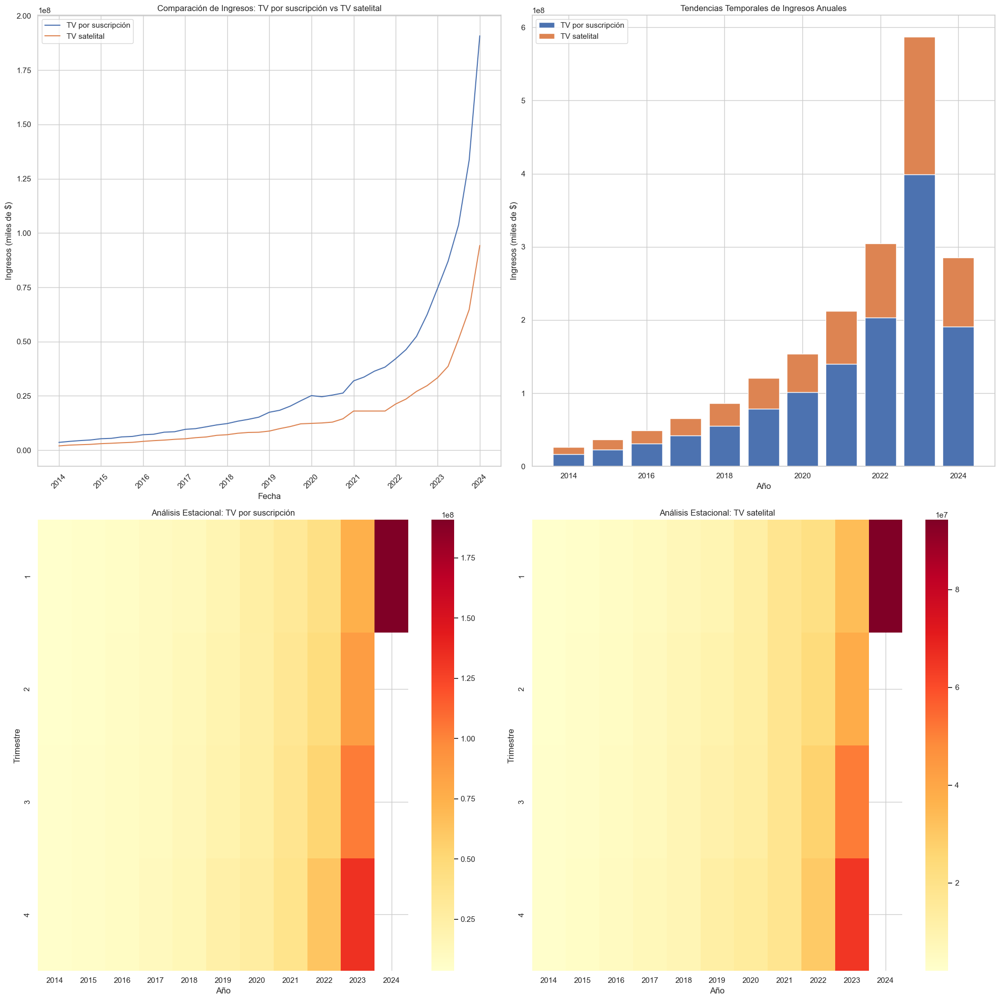

       Ingresos TV por suscripción  (miles de $)  \
count                               4.100000e+01   
mean                                3.127180e+07   
std                                 3.852994e+07   
min                                 3.599484e+06   
25%                                 8.293761e+06   
50%                                 1.747949e+07   
75%                                 3.639803e+07   
max                                 1.907872e+08   

       Ingresos TV satelital (miles de $)  
count                        4.100000e+01  
mean                         1.576816e+07  
std                          1.851451e+07  
min                          2.001221e+06  
25%                          4.653224e+06  
50%                          8.816484e+06  
75%                          1.803844e+07  
max                          9.427053e+07  

Correlación entre ingresos de TV por suscripción y TV satelital:
                                           Ingresos TV por suscripció

In [110]:

# Asegurarnos de que las columnas de ingresos sean numéricas
h['Ingresos TV por suscripción  (miles de $)'] = pd.to_numeric(h['Ingresos TV por suscripción  (miles de $)'], errors='coerce')
h['Ingresos TV satelital (miles de $)'] = pd.to_numeric(h['Ingresos TV satelital (miles de $)'], errors='coerce')

# Crear la figura principal con subplots
fig, axs = plt.subplots(2, 2, figsize=(20, 20))

# 1. Comparación de Ingresos: Gráfico de líneas
axs[0, 0].plot(h['Fecha'], h['Ingresos TV por suscripción  (miles de $)'], label='TV por suscripción')
axs[0, 0].plot(h['Fecha'], h['Ingresos TV satelital (miles de $)'], label='TV satelital')
axs[0, 0].set_title('Comparación de Ingresos: TV por suscripción vs TV satelital')
axs[0, 0].set_xlabel('Fecha')
axs[0, 0].set_ylabel('Ingresos (miles de $)')
axs[0, 0].legend()
plt.setp(axs[0, 0].xaxis.get_majorticklabels(), rotation=45)

# 2. Tendencias Temporales: Gráfico de barras apiladas
h_yearly = h.groupby('Año')[['Ingresos TV por suscripción  (miles de $)', 'Ingresos TV satelital (miles de $)']].sum().reset_index()
axs[0, 1].bar(h_yearly['Año'], h_yearly['Ingresos TV por suscripción  (miles de $)'], label='TV por suscripción')
axs[0, 1].bar(h_yearly['Año'], h_yearly['Ingresos TV satelital (miles de $)'], 
              bottom=h_yearly['Ingresos TV por suscripción  (miles de $)'], label='TV satelital')
axs[0, 1].set_title('Tendencias Temporales de Ingresos Anuales')
axs[0, 1].set_xlabel('Año')
axs[0, 1].set_ylabel('Ingresos (miles de $)')
axs[0, 1].legend()

# 3. Análisis Estacional: Heatmap
h_pivot = h.pivot_table(index='Trimestre', columns='Año', 
                        values=['Ingresos TV por suscripción  (miles de $)', 'Ingresos TV satelital (miles de $)'])
sns.heatmap(h_pivot['Ingresos TV por suscripción  (miles de $)'], ax=axs[1, 0], cmap='YlOrRd')
axs[1, 0].set_title('Análisis Estacional: TV por suscripción')
axs[1, 0].set_ylabel('Trimestre')

sns.heatmap(h_pivot['Ingresos TV satelital (miles de $)'], ax=axs[1, 1], cmap='YlOrRd')
axs[1, 1].set_title('Análisis Estacional: TV satelital')
axs[1, 1].set_ylabel('Trimestre')

plt.tight_layout()
plt.show()

# Estadísticas descriptivas
print(h[['Ingresos TV por suscripción  (miles de $)', 'Ingresos TV satelital (miles de $)']].describe())

# Correlación entre ingresos de TV por suscripción y TV satelital
print("\nCorrelación entre ingresos de TV por suscripción y TV satelital:")
print(h[['Ingresos TV por suscripción  (miles de $)', 'Ingresos TV satelital (miles de $)']].corr())


**Conclusiones:**


1. Comparación de Ingresos (TV por suscripción vs TV satelital):

- Los ingresos de la TV por suscripción han mostrado un crecimiento considerable especialmente a partir del 2020, alcanzando un pico mucho más pronunciado en el 2024.

- Los ingresos de la TV satelital, aunque también han aumentado, lo han hecho a un ritmo más moderado en comparación con la TV por suscripción.

- Es evidente que la TV por suscripción ha superado significativamente a la TV satelital en términos de ingresos en los últimos años, lo que podría indicar un cambio en las preferencias de los consumidores o una expansión más agresiva en las ofertas de servicios de suscripción.

2. Tendencias Temporales de Ingresos Anuales:

- Ambos tipos de servicios muestran un aumento en los ingresos a lo largo de los años.

- Sin embargo, el crecimiento en los ingresos de la TV por suscripción es mucho más destacado, especialmente en los últimos años, con una subida muy notable entre 2020 y 2024.

- La TV satelital también muestra un incremento, aunque más modesto, y parece mantenerse relativamente constante en comparación con el auge de la TV por suscripción.

3. Análisis Estacional (Heatmaps):

- El análisis estacional muestra patrones distintos para cada tipo de servicio. Para la TV por suscripción, hay un incremento marcado en los ingresos en los trimestres más recientes (2023-2024), sugiriendo un posible aumento estacional o una mejora en las ofertas/promociones durante esos períodos.

- Para la TV satelital, el patrón es menos claro, pero parece haber cierta variabilidad estacional con algunos años mostrando mayores ingresos en ciertos trimestres. Sin embargo, no hay un patrón tan marcado como en el caso de la TV por suscripción.

En general, estos analisis EDA sugieren que la TV por suscripción está ganando terreno frente a la TV satelital, posiblemente debido a factores como mejor contenido, mejores ofertas de precio, o una preferencia cambiante hacia servicios de streaming o on-demand que suelen estar más asociados con la TV por suscripción. Además, el análisis estacional podría ser crucial para planificar estrategias de marketing y promociones para maximizar los ingresos durante períodos de alta demanda.

### **4.2 Penetraciones Totales TV**

**Descripción de la Hoja**

La hoja Penetracion_totales_TV del DataFrame contiene información detallada sobre la penetración de televisión en función de diferentes variables. Esta hoja registra datos anuales y trimestrales sobre el acceso a televisión por suscripción y satelital, tanto por cada 100 habitantes como por cada 100 hogares. Los datos están organizados en las siguientes columnas:

- Año: El año en el que se registraron los datos.

- Trimestre: El trimestre del año en el que se registraron los datos.

- Accesos TV por suscripción por cada 100 hab: El número de accesos a televisión por suscripción por cada 100 habitantes.

- Accesos TV satelital por cada 100 hab: El número de accesos a televisión satelital por cada 100 habitantes.

- Accesos TV por suscripción por cada 100 hogares: El número de accesos a televisión por suscripción por cada 100 hogares.

- Accesos TV satelital por cada 100 hogares: El número de accesos a televisión satelital por cada 100 hogares.

**Objetivos del EDA**
El objetivo de este análisis exploratorio es:

1. Analizar la Evolución Temporal: Examinar cómo han cambiado los accesos a televisión por suscripción y satelital a lo largo del tiempo, tanto por cada 100 habitantes como por cada 100 hogares.

2. Evaluar la Relación entre las Variables: Investigar la relación entre los distintos tipos de acceso (suscripción y satelital) y su distribución por habitantes y hogares.

3. Identificar Tendencias y Patrones: Detectar cualquier tendencia o patrón en los datos que pueda indicar cambios en el comportamiento de acceso a televisión.

4. Detectar Valores Atípicos y Anomalías: Identificar cualquier valor atípico o anomalía que pueda requerir una investigación adicional o ajustes en los datos.

**Metodología y Procesos**

Análisis Descriptivo: Calcular estadísticas descriptivas básicas como medias, medianas, desviaciones estándar, y crear gráficos para visualizar la distribución de los accesos a televisión.
Análisis de Tendencias: Utilizar gráficos de series temporales para analizar la evolución de los accesos a televisión a lo largo del tiempo.
Comparación de Variables: Crear gráficos de dispersión y matrices de correlación para evaluar las relaciones entre las diferentes variables.
Identificación de Valores Atípicos: Utilizar gráficos de caja (box plots) y histogramas para identificar y analizar valores atípicos.

**Conclusiones Esperadas**

Tendencias Temporales: Esperamos identificar si hay una tendencia general en el aumento o disminución del acceso a televisión por suscripción y satelital a lo largo del tiempo.
Relaciones entre Variables: Determinar si existe una relación significativa entre los accesos a televisión por suscripción y satelital y si estas relaciones difieren cuando se considera el número de habitantes versus el número de hogares.
Valores Atípicos: Detectar cualquier anomalía en los datos que pueda sugerir errores o áreas que requieran una mayor investigación.

In [111]:

# Leer una hoja específica
h = df.parse(sheet_name='Penetracion_totales_TV')
h

,Año,Trimestre,Accesos TV por suscripción por cada 100 hab,Accesos TV satelital por cada 100 hab,Accesos TV por suscripción por cada 100 hogares,Accesos TV satelital por cada 100 hogares
0,2024,1,16.200000,3.080000,51.550000,9.800000
1,2023,4,16.340000,3.220000,52.050000,10.260000
2,2023,3,16.570000,3.600000,52.840000,11.490000
3,2023,2,17.320000,3.720000,55.290000,11.880000
4,2023,1,16.710000,3.800000,53.360000,12.130000
5,2022,4,16.550000,3.960000,52.900000,12.660000
6,2022,3,16.560000,4.460000,52.970000,14.270000
7,2022,2,16.550000,4.470000,53.010000,14.310000
8,2022,1,16.412165,4.446742,52.605411,14.253006
9,2021,4,16.520000,4.370000,52.990000,14.020000


In [112]:
# Obtener la forma de la hoja (número de filas y columnas)
print(h.shape)
# Obtener los nombres de las columnas
print(h.columns)

# Obtener los tipos de datos de cada columna
print(h.dtypes)

#Head del dataframe 

print(h.head(1))

(41, 6)
Index(['Año', 'Trimestre', 'Accesos TV por suscripción por cada 100 hab',
       'Accesos TV satelital por cada 100 hab',
       'Accesos TV por suscripción por cada 100 hogares',
       'Accesos TV satelital por cada 100 hogares'],
      dtype='object')
Año                                                  int64
Trimestre                                            int64
Accesos TV por suscripción por cada 100 hab        float64
Accesos TV satelital por cada 100 hab              float64
Accesos TV por suscripción por cada 100 hogares    float64
Accesos TV satelital por cada 100 hogares          float64
dtype: object
    Año  Trimestre  Accesos TV por suscripción por cada 100 hab  \
0  2024          1                                         16.2   

   Accesos TV satelital por cada 100 hab  \
0                                   3.08   

   Accesos TV por suscripción por cada 100 hogares  \
0                                            51.55   

   Accesos TV satelital por cada 100

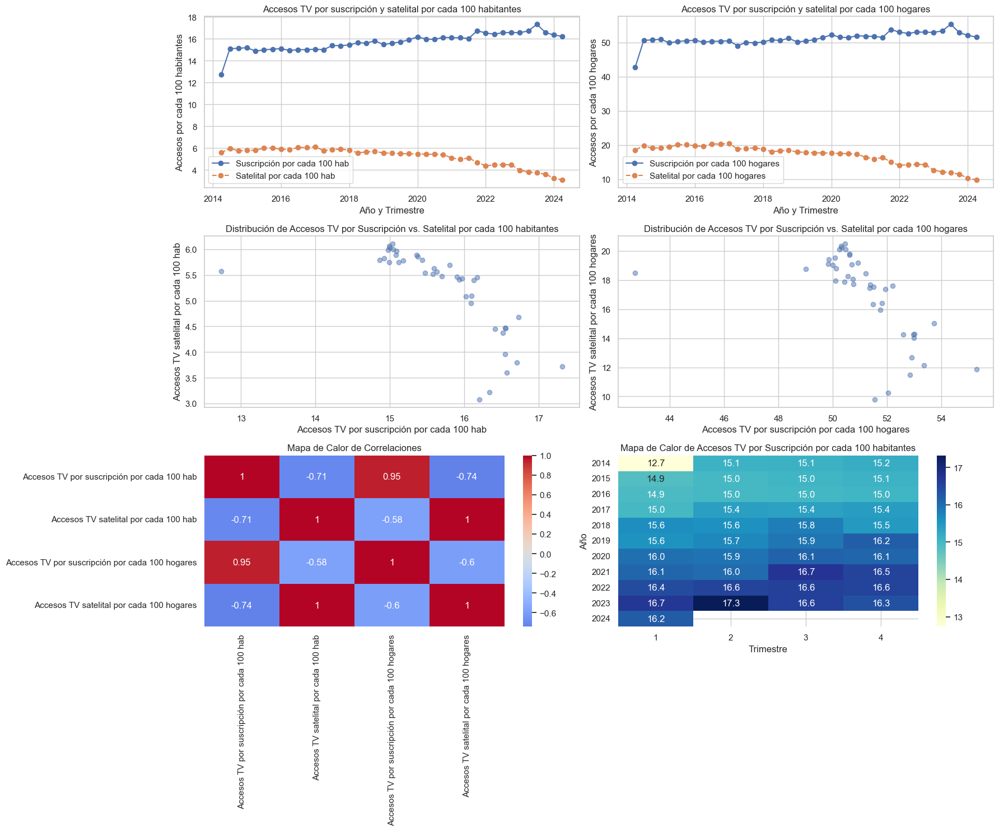

In [114]:


# Configuración de los gráficos
sns.set(style="whitegrid")

# Crear una figura con subplots
fig, axs = plt.subplots(3, 2, figsize=(18, 15), sharex=False)

# Gráfico 1: Accesos TV por suscripción y satelital por cada 100 habitantes
axs[0, 0].plot(h['Año'] + h['Trimestre'] / 4, h['Accesos TV por suscripción por cada 100 hab'], marker='o', label='Suscripción por cada 100 hab')
axs[0, 0].plot(h['Año'] + h['Trimestre'] / 4, h['Accesos TV satelital por cada 100 hab'], marker='o', label='Satelital por cada 100 hab', linestyle='--')
axs[0, 0].set_title('Accesos TV por suscripción y satelital por cada 100 habitantes')
axs[0, 0].set_xlabel('Año y Trimestre')
axs[0, 0].set_ylabel('Accesos por cada 100 habitantes')
axs[0, 0].legend()
axs[0, 0].grid(True)

# Gráfico 2: Accesos TV por suscripción y satelital por cada 100 hogares
axs[0, 1].plot(h['Año'] + h['Trimestre'] / 4, h['Accesos TV por suscripción por cada 100 hogares'], marker='o', label='Suscripción por cada 100 hogares')
axs[0, 1].plot(h['Año'] + h['Trimestre'] / 4, h['Accesos TV satelital por cada 100 hogares'], marker='o', label='Satelital por cada 100 hogares', linestyle='--')
axs[0, 1].set_title('Accesos TV por suscripción y satelital por cada 100 hogares')
axs[0, 1].set_xlabel('Año y Trimestre')
axs[0, 1].set_ylabel('Accesos por cada 100 hogares')
axs[0, 1].legend()
axs[0, 1].grid(True)

# Gráfico 3: Distribución de accesos TV por suscripción y satelital por cada 100 habitantes
axs[1, 0].scatter(h['Accesos TV por suscripción por cada 100 hab'], h['Accesos TV satelital por cada 100 hab'], alpha=0.5)
axs[1, 0].set_title('Distribución de Accesos TV por Suscripción vs. Satelital por cada 100 habitantes')
axs[1, 0].set_xlabel('Accesos TV por suscripción por cada 100 hab')
axs[1, 0].set_ylabel('Accesos TV satelital por cada 100 hab')

# Gráfico 4: Distribución de accesos TV por suscripción y satelital por cada 100 hogares
axs[1, 1].scatter(h['Accesos TV por suscripción por cada 100 hogares'], h['Accesos TV satelital por cada 100 hogares'], alpha=0.5)
axs[1, 1].set_title('Distribución de Accesos TV por Suscripción vs. Satelital por cada 100 hogares')
axs[1, 1].set_xlabel('Accesos TV por suscripción por cada 100 hogares')
axs[1, 1].set_ylabel('Accesos TV satelital por cada 100 hogares')

# Gráfico 5: Mapa de calor de correlaciones
corr = h[['Accesos TV por suscripción por cada 100 hab',
          'Accesos TV satelital por cada 100 hab',
          'Accesos TV por suscripción por cada 100 hogares',
          'Accesos TV satelital por cada 100 hogares']].corr()
sns.heatmap(corr, annot=True, cmap='coolwarm', center=0, ax=axs[2, 0])
axs[2, 0].set_title('Mapa de Calor de Correlaciones')

# Gráfico 6: Mapa de calor de accesos TV por año y trimestre
pivot_subscr = h.pivot_table(index='Año', columns='Trimestre', values='Accesos TV por suscripción por cada 100 hab', aggfunc='mean')
pivot_satelital = h.pivot_table(index='Año', columns='Trimestre', values='Accesos TV satelital por cada 100 hab', aggfunc='mean')

# Gráfico de mapa de calor para suscripción por cada 100 habitantes
sns.heatmap(pivot_subscr, cmap='YlGnBu', annot=True, fmt=".1f", ax=axs[2, 1])
axs[2, 1].set_title('Mapa de Calor de Accesos TV por Suscripción por cada 100 habitantes')
axs[2, 1].set_xlabel('Trimestre')
axs[2, 1].set_ylabel('Año')


# Ajustar el layout para que no se sobrepongan los gráficos
plt.tight_layout()
plt.show()


**Conclusiones:**


**Tendencias generales:**

- Los accesos de TV por suscripción han mostrado un crecimiento gradual a lo largo de los años, tanto por cada 100 habitantes como por cada 100 hogares.

- En contraste, los accesos de TV satelital han experimentado una disminución constante, especialmente notable desde 2020.

**Penetración del mercado:**

- La TV por suscripción tiene una penetración significativamente mayor que la TV satelital, con aproximadamente 16 accesos por cada 100 habitantes frente a 6 para TV satelital en los últimos años.

- En términos de hogares, la diferencia es aún más pronunciada, con cerca de 50 accesos por cada 100 hogares para TV por suscripción frente a 20 para TV satelital.

**Distribución y correlación:**

- Existe una fuerte correlación positiva (0.95) entre los accesos de TV por suscripción por habitantes y por hogares.

- Hay una correlación negativa (-0.71) entre los accesos de TV por suscripción y TV satelital, lo que sugiere que a medida que uno aumenta, el otro tiende a disminuir.

**Patrones estacionales:**

- El mapa de calor de accesos TV por suscripción muestra cierta variabilidad estacional, con tendencia a valores más altos en el segundo y tercer trimestre de cada año.

**Evolución temporal:**

- Se observa un aumento constante en los accesos de TV por suscripción desde 2014 hasta 2024, con un crecimiento más pronunciado en los últimos años.

- El año 2024 muestra los valores más altos de accesos por suscripción en todos los trimestres.

**Competencia entre servicios:**

- La disminución en los accesos de TV satelital coincide con el aumento en los accesos de TV por suscripción, lo que podría indicar una migración de usuarios de un servicio a otro.

**Saturación del mercado:**

El crecimiento de la TV por suscripción parece estar alcanzando una meseta en los últimos trimestres, lo que podría indicar una saturación del mercado.

**Diferencias entre métricas:**

Los gráficos muestran que la penetración por hogares es significativamente mayor que por habitantes, lo que es lógico considerando que un hogar puede tener múltiples habitantes.

Estas conclusiones sugieren un cambio en las preferencias de los consumidores hacia la TV por suscripción, posiblemente debido a factores como una mayor oferta de contenido, mejor infraestructura de cable, o cambios en los modelos de negocio y estrategias de marketing de las empresas proveedoras de servicios de televisión.

### **5. Mapa_conectividad**

Este dataframe nos muestra por ubicacion geografica por provincia, localidad o partido, ademas de la poblacion total y como se distribuyen las tecnologias por cada o si hay o no ciertas tecnologias. 

In [9]:

# Ruta del Archivo
file_path = '/Users/felipeamezquita/Library/Mobile Documents/com~apple~CloudDocs/Documents/HENRY/PROYECTO INDIVIDUAL/EJERCICIO 2/DATA/DATA SECUNDARIA/mapa_conectividad.xlsx'

# Cargar el archivo Excel usando openpyxl
df = pd.ExcelFile(file_path, engine='openpyxl')


In [10]:
# Obtener la lista de hojas en el archivo
hojas = df.sheet_names

# Imprimir la lista de hojas
print(hojas)

['Hoja3']


**Descripción de la Hoja**

La hoja "Hoja 3" del DataFrame proporciona información sobre la ubicación geográfica y la disponibilidad de tecnologías de telecomunicaciones en distintas áreas. La hoja incluye datos de varias provincias, partidos y localidades, así como la presencia de diferentes tipos de tecnologías y sus respectivas coordenadas geográficas (latitud y longitud).

**Columnas del DataFrame**

- Provincia: La provincia en la que se encuentra la localidad.

- Partido: El partido dentro de la provincia.

- Localidad: La localidad específica dentro del partido.

- Población: Número de habitantes en la localidad.

- ADSL: Disponibilidad de tecnología ADSL (Sí/No).

- Cablemódem: Disponibilidad de tecnología Cablemódem (Sí/No).

- Dial Up: Disponibilidad de tecnología Dial Up (Sí/No).

- Fibra óptica: Disponibilidad de tecnología Fibra óptica (Sí/No).

- Satelital: Disponibilidad de tecnología Satelital (Sí/No).

- Wireless: Disponibilidad de tecnología Wireless (Sí/No).

- Telefonía Fija: Disponibilidad de telefonía fija (Sí/No).

- 3G: Disponibilidad de tecnología 3G (Sí/No).

- 4G: Disponibilidad de tecnología 4G (Sí/No).

- Link: Identificador o código de referencia.

- Latitud: Latitud geográfica de la localidad.

- Longitud: Longitud geográfica de la localidad.

**Objetivos del EDA**

1. Distribución Geográfica: Visualizar la distribución geográfica de las localidades usando latitud y longitud para entender la cobertura geográfica de las tecnologías de telecomunicaciones.

2. Disponibilidad Tecnológica: Evaluar la disponibilidad de diferentes tecnologías (ADSL, Cablemódem, etc.) en función de la ubicación geográfica y la población.

3. Población y Tecnología: Analizar la relación entre la población de cada localidad y la disponibilidad de tecnologías.

3. Cobertura Regional: Identificar patrones regionales en la disponibilidad de tecnologías y cómo varía según las provincias y partidos.

**Metodología y Procesos**

Preparación de Datos: Limpiar y transformar los datos según sea necesario. Esto puede incluir la conversión de valores "Sí" y "No" en valores booleanos o categóricos y la gestión de valores nulos.
Visualización Geográfica: Utilizar mapas de calor o gráficos de dispersión para visualizar la distribución geográfica de las localidades y la cobertura de tecnologías.
Análisis de Disponibilidad Tecnológica: Crear gráficos de barras o pasteles para mostrar la proporción de localidades con diferentes tipos de tecnologías en cada región.
Análisis de Población: Realizar gráficos de dispersión para analizar cómo la población se correlaciona con la disponibilidad de tecnologías.
Mapas de Calor: Usar mapas de calor para identificar concentraciones y patrones en la disponibilidad de tecnologías y la población.

**Conclusiones Esperadas**

Patrones Geográficos: Identificación de áreas con alta o baja cobertura de tecnologías, proporcionando una visión general de la distribución regional.
Cobertura de Tecnologías: Comprensión de qué tecnologías están más o menos disponibles en función de la ubicación y la población.
Tendencias Regionales: Identificación de tendencias en la disponibilidad de tecnologías a nivel provincial y local, así como posibles áreas de mejora para futuras implementaciones.
Correlaciones: Observación de posibles correlaciones entre la población y la disponibilidad de diferentes tecnologías.

In [117]:

# Leer una hoja específica
h = df.parse(sheet_name='Hoja3')
h

,Provincia,Partido,Localidad,Población,ADSL,Cablemódem,Dial Up,Fibra óptica,Satelital,Wireless,Telefonía Fija,3G,4G,Link,Latitud,Longitud
0,BUENOS AIRES,25 de Mayo,25 de Mayo,23408,SI,SI,--,--,SI,SI,SI,SI,SI,6854100.0,-35.433939,-60.173121
1,BUENOS AIRES,25 de Mayo,Agustín Mosconi,280,--,--,--,--,--,--,SI,--,--,6854010.0,-35.739217,-60.559063
2,BUENOS AIRES,25 de Mayo,Del Valle,899,SI,--,--,--,SI,--,--,SI,--,6854020.0,-35.897345,-60.731609
3,BUENOS AIRES,25 de Mayo,Ernestina,145,SI,--,--,--,--,--,SI,--,--,6854030.0,-35.270234,-59.557503
4,BUENOS AIRES,25 de Mayo,Gobernador Ugarte,547,--,--,--,--,--,SI,--,--,--,6854040.0,-35.164397,-60.081358
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4300,SANTA FE,General López,Wheelwright,5733,--,SI,--,SI,SI,SI,SI,SI,SI,82042310.0,-33.794294,-61.211441
4301,SANTA FE,General Obligado,Arroyo Ceibal,622,--,--,--,--,--,SI,SI,--,SI,82049010.0,-28.725087,-59.480416
4302,SANTA FE,General Obligado,Avellaneda (Est. Ewald),23341,SI,--,--,SI,--,SI,SI,SI,SI,82049020.0,-29.119366,-59.659251
4303,SANTA FE,General Obligado,Berna,629,--,--,--,--,--,SI,SI,--,SI,82049030.0,-29.275268,-59.847222


In [118]:
# Obtener la forma de la hoja (número de filas y columnas)
print(h.shape)
# Obtener los nombres de las columnas
print(h.columns)

# Obtener los tipos de datos de cada columna
print(h.dtypes)

#Head del dataframe 

print(h.head(1))

(4305, 16)
Index(['Provincia', 'Partido', 'Localidad', 'Población', 'ADSL', 'Cablemódem',
       'Dial Up', 'Fibra óptica', 'Satelital', 'Wireless', 'Telefonía Fija',
       '3G', '4G', 'Link', 'Latitud', 'Longitud'],
      dtype='object')
Provincia          object
Partido            object
Localidad          object
Población           int64
ADSL               object
Cablemódem         object
Dial Up            object
Fibra óptica       object
Satelital          object
Wireless           object
Telefonía Fija     object
3G                 object
4G                 object
Link              float64
Latitud           float64
Longitud          float64
dtype: object
      Provincia     Partido   Localidad  Población ADSL Cablemódem Dial Up  \
0  BUENOS AIRES  25 de Mayo  25 de Mayo      23408   SI         SI      --   

  Fibra óptica Satelital Wireless Telefonía Fija  3G  4G       Link  \
0           --        SI       SI             SI  SI  SI  6854100.0   

     Latitud   Longitud  
0 -3

In [132]:
# Sumatoria de la población
total_population = h['Población'].sum()
print(f'Total de la población: {total_population}')

Total de la población: 37484525
